In [1]:
import os
import sys
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
import neuroencoders.utils.MOBS_Functions as mf
plt.style.use("neuroencoders.mobs")
%matplotlib inline

In [ ]:
%reload_ext autoreload
%autoreload 2

## loading

In [ ]:
nameExp = "STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer"
# nameExp = "STRIDE_4_consensus_v8_factor3_dim64_3Transformers_lr001_nHeads4_dropout015_cLambda07_speed_75_50_Transformer"
jsonPath = None
windowSizeMS = [108]
mode = "ann"
target = "PosAndHeadDirectionAndThigmo"
phase = "pre"
nEpochs = 30 
mouse = "1162"
manipe = "PAG"

In [ ]:
Dir = mf.path_for_experiments_df('Sub', nameExp)

In [ ]:
deviceName = "gpu"
min_speed = 7.5
max_speed = 50
Mouse_Results = mf.Mouse_Results(Dir, mouse_name=mouse, manipe=manipe, target=target,  
                                                        nameExp=nameExp, nEpochs=nEpochs, phase=phase, 
                                                        deviceName=deviceName, windows=windowSizeMS,
                                                        isTransformer = "LSTM" not in nameExp, 
                                                        denseweight= False, 
                                                        transform_w_log = False,
                                                        which = "both",
                                                        isPredLoss = False,
                                                        load_trainers_at_init = True,
                                                        load_at_init = False,
                                                        show = False,
                                                        batch_size = 128,
                                                        GaussianHeatmap = True,
                                                        contrastive_loss = True,
                                                        jit_compile = False,
                                                        # max_nb_spikes = 400,
                                                        # max_spikes_per_group = 100,
                                                        )
Mouse_Results.DataHelper.force_speed_mask(min_speed, max_speed, l_function = Mouse_Results.l_function)

In [ ]:
import tensorflow as tf
tf.keras.utils.plot_model(Mouse_Results.ann.model, expand_nested=True, show_shapes=True, show_dtype=False, show_layer_names=True)

In [11]:
Mouse_Results.load_data(suffixes = ["_training", "_pre", "_cond", "_post"], load_pickle = True, redo = True)

In [1]:
Mouse_Results.load_bayes(suffixes = ["_training", "_pre", "_cond", "_post"], load_pickle = True, redo = True)

NameError: name 'Mouse_Results' is not defined

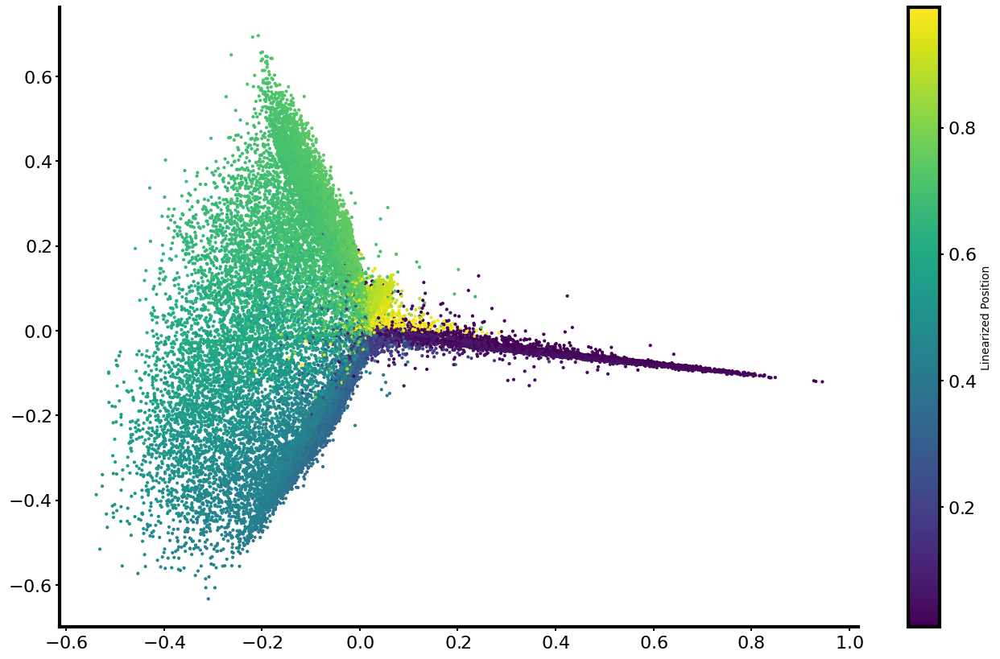

In [11]:
from sklearn.decomposition import PCA
phase = "_training"
latents = Mouse_Results.resultsNN_phase_pkl[phase]["latent"][0]
pca = PCA(n_components=2)
pca_result = pca.fit_transform(latents)
plt.scatter(pca_result[:, 0], pca_result[:, 1], c= Mouse_Results.resultsNN_phase_pkl[phase]["linearPred"][0], cmap='viridis')
plt.colorbar(label='Linearized Position')

In [12]:
Mouse_Results

Mouse_Results(mouse_name=1199, manipe=PAG, name_exp=STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, target=PosAndHeadDirectionAndThigmo, phase=pre, path=/media/mickey/DataTheotime210/DimaERC2/neuroencoders_1021/_work/M1199_PAG, windows=['108'])

## back to work

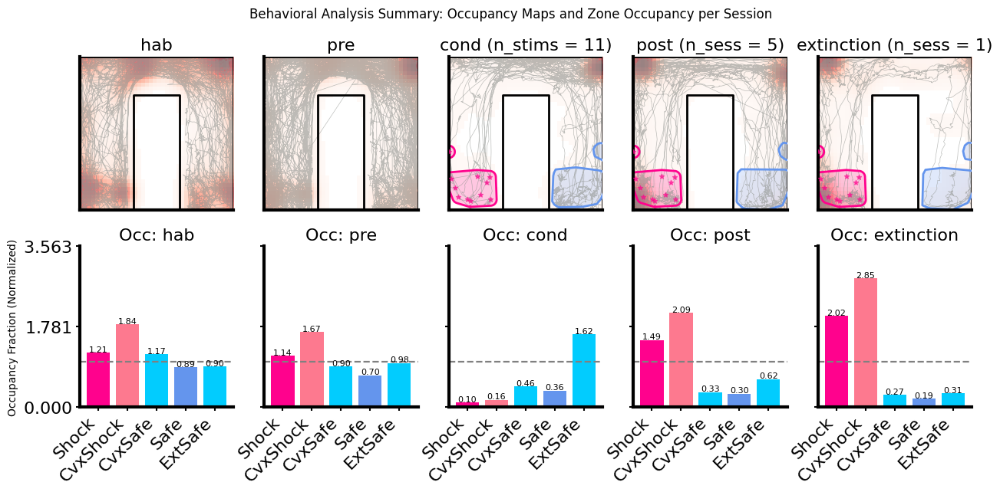

In [13]:
Mouse_Results.summary_behavior(Mouse_Results.DataHelper, num_sess_post = 10)

In [14]:
Mouse_Results.load_data(suffixes=["_training", "_pre", "_cond", "_post"], redo = True, load_pickle = True)

In [15]:
Mouse_Results.resultsNN_phase_pkl["_pre"]["latent"][0].shape

(12416, 64)

## analyse place cells

In [15]:
linearTuningCurves, binEdges = Mouse_Results.trainerBayes.calculate_linear_tuning_curve(
            l_function=Mouse_Results.l_function, behaviorData=Mouse_Results.behaviorData
        )


using speed filter: True
No suffix provided, using combined train and test epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.35 Hz


In [16]:
Mouse_Results.bayesMatrices = Mouse_Results.trainerBayes.train_order_by_pos(
    Mouse_Results.behaviorData,
    l_function = Mouse_Results.l_function,
)

2026-05-19 14:12:18,600 - INFO - Training data saved with (10036, 2) valid positions.
2026-05-19 14:12:18,601 - INFO - Initializing spike matrices for 4 tetrodes...


will redo bayes mat : False


2026-05-19 14:12:21,097 - INFO - Loaded existing Bayesian matrices.
2026-05-19 14:12:21,098 - INFO - Using pre-existing linear ordering of neurons.


In [17]:
placeFieldSort = Mouse_Results.trainerBayes.linearPosArgSort

In [18]:
Mouse_Results.DataHelper.get_true_target(108, Mouse_Results.l_function, in_place = True)

/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/utils/global_classes.py:658: UserWarning: old_positions already exist,meaning you already ran the true target ! beware.
  warn(
/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.13/site-packages/shapely/measurement.py:81: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)


array([[        nan,         nan,         nan,         inf],
       [        nan,         nan,         nan,         inf],
       [        nan,         nan,         nan,         inf],
       ...,
       [ 0.05163875,  0.0050221 , -0.63148404,  0.0050221 ],
       [ 0.05218648,  0.00288278, -0.63148404,  0.00288278],
       [ 0.04985683,  0.00554465, -0.63148404,  0.00554465]],
      shape=(400782, 4))

In [117]:
plt.style.use("neuroencoders.mobs")

using speed filter: True
Using training epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.37 Hz
using speed filter: False
Using post epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.23 Hz


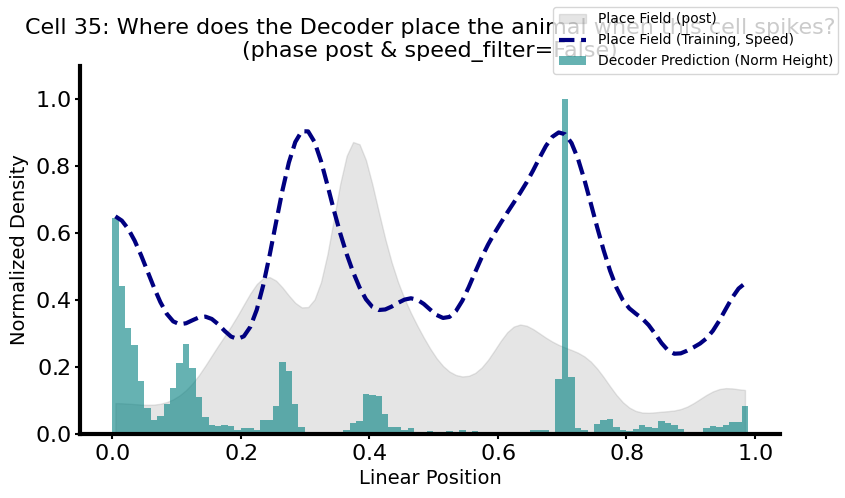

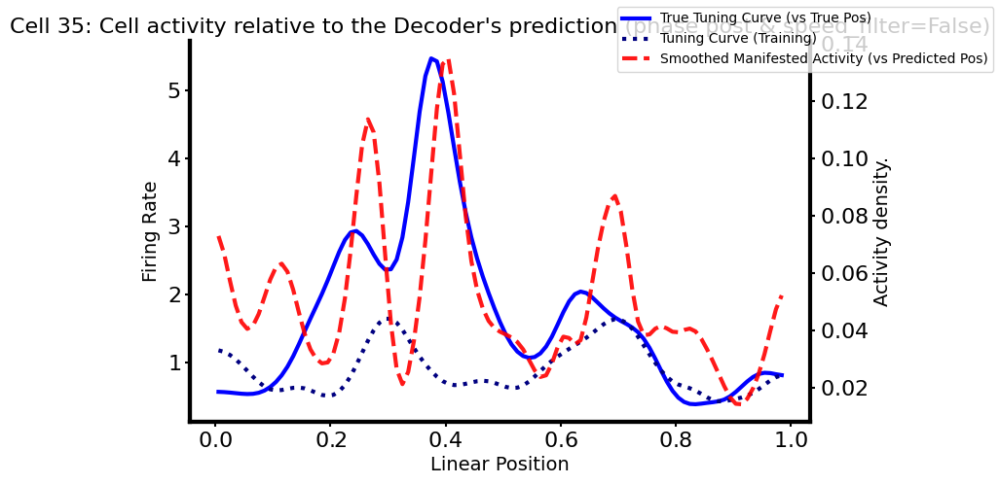

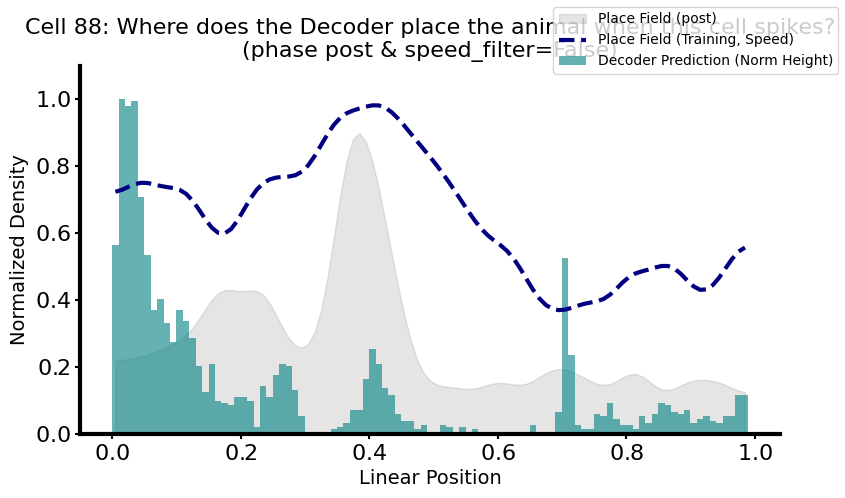

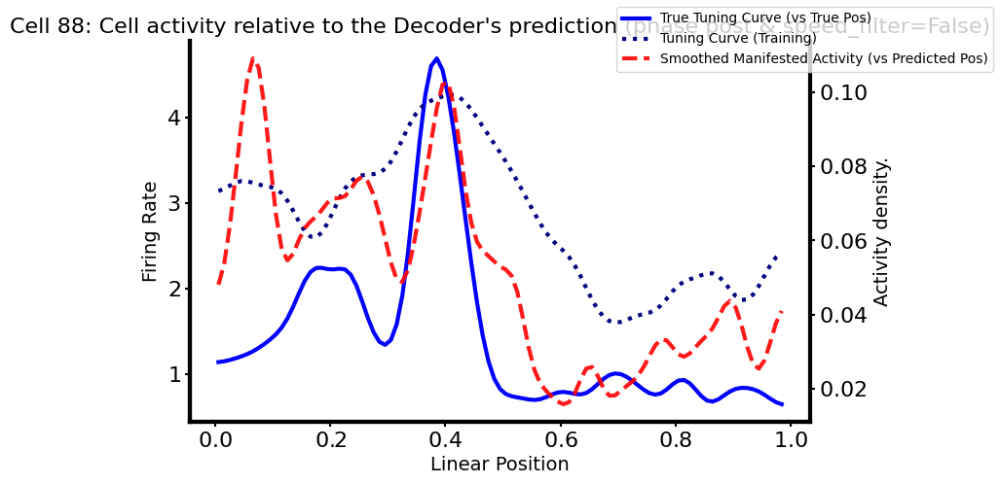

In [131]:
Mouse_Results.plot_pc_activity_vs_predictions(phase = "post", useAll = True, use_speed_filter = False, show = True, keep_only_neurons = [35,88])

using speed filter: True
Using training epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.37 Hz
using speed filter: False
Using cond epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 13.69 Hz


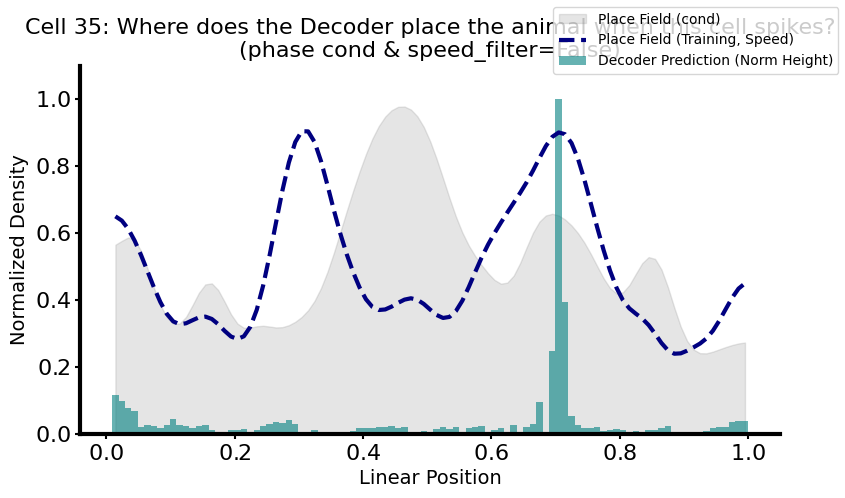

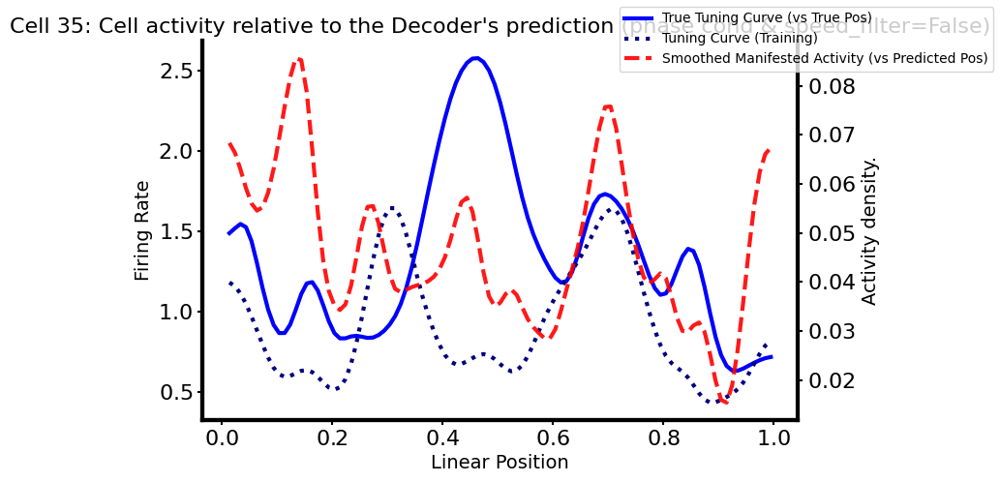

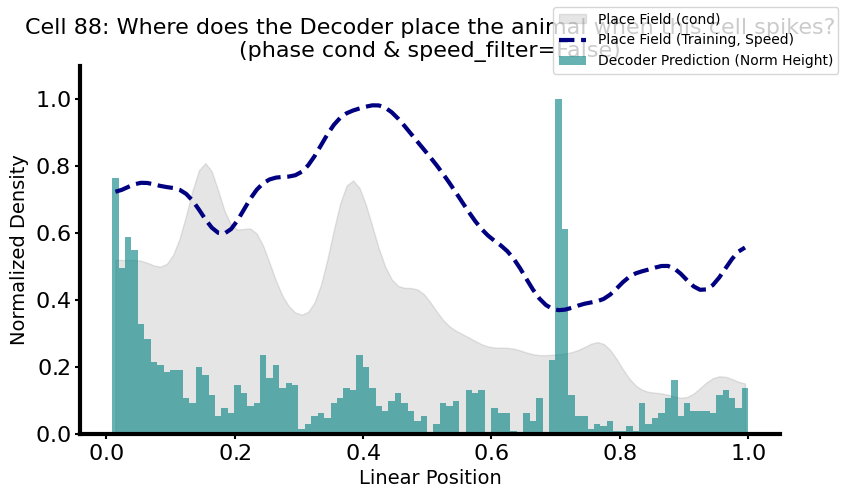

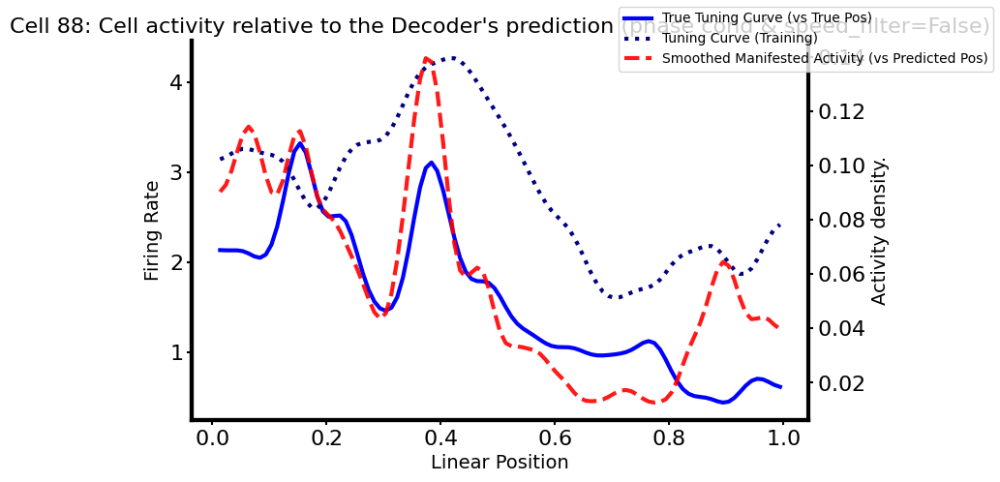

In [132]:
Mouse_Results.plot_pc_activity_vs_predictions(phase = "cond", useAll = True, use_speed_filter = False, show = True, keep_only_neurons = [35,88])

using speed filter: True
Using training epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.37 Hz
using speed filter: True
Using pre epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.35 Hz


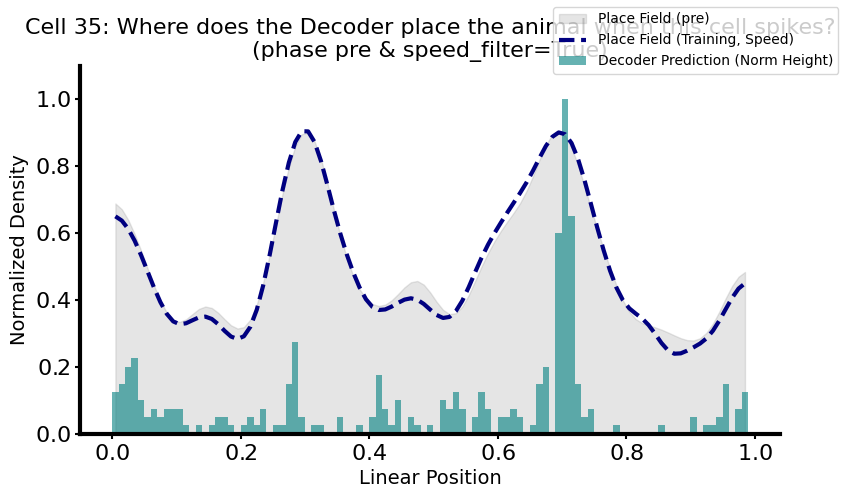

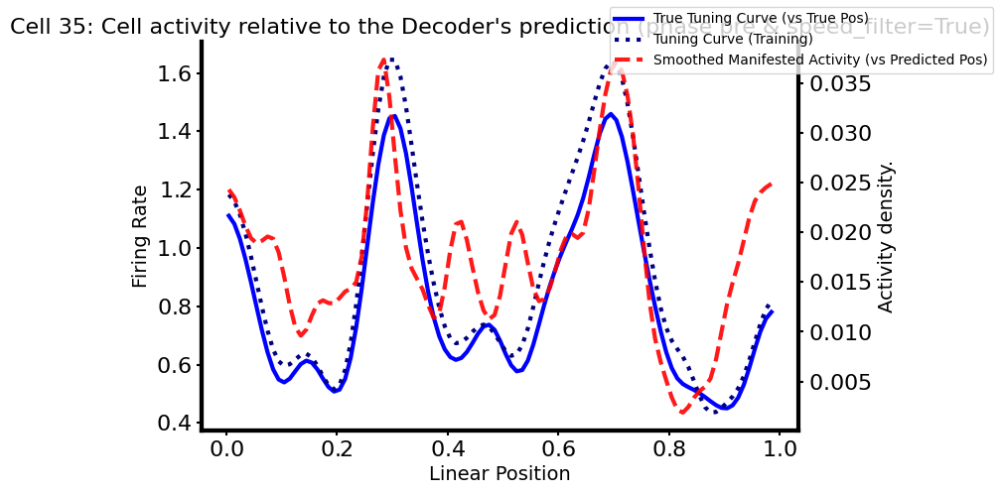

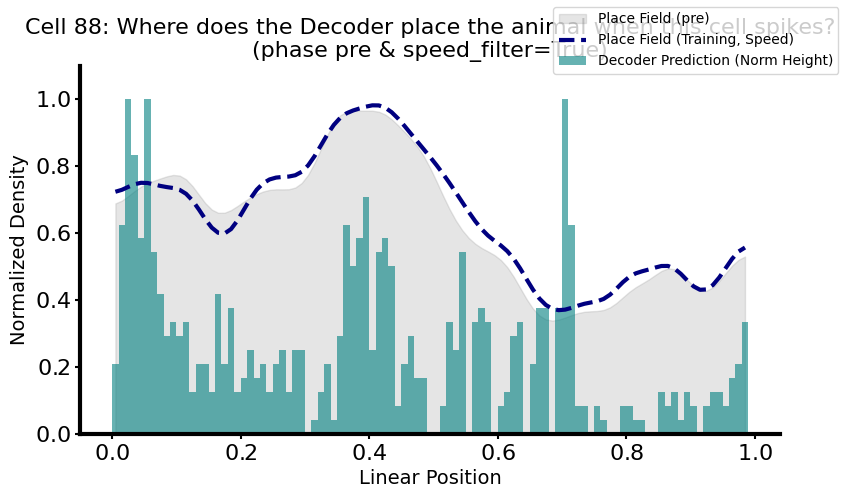

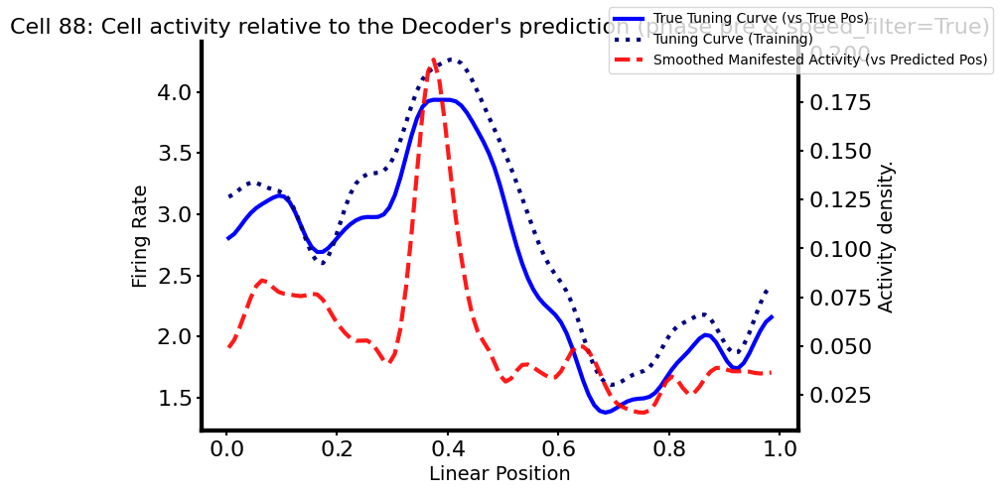

In [133]:
Mouse_Results.plot_pc_activity_vs_predictions(use_speed_filter = True, show = True, keep_only_neurons = [35,88])

using speed filter: True
Using pre epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.35 Hz
using speed filter: True
Using post epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.23 Hz


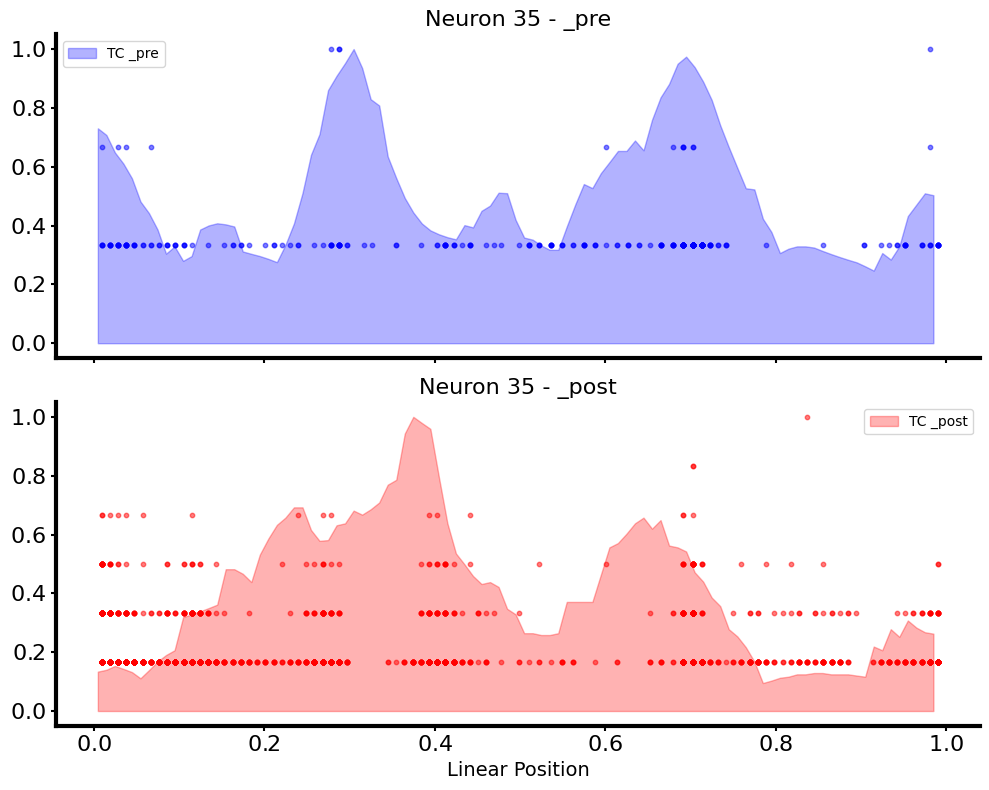

In [140]:
Mouse_Results.plot_single_cell_remapping("_pre", "_post", 35)

In [21]:
Mouse_Results.plot_pc_activity_vs_predictions(use_speed_filter = False, show = False)

using speed filter: True
Using training epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.37 Hz
using speed filter: False
Using pre epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.35 Hz
Skipping cell 76 due to low activity.
Skipping cell 75 due to low activity.


In [22]:
Mouse_Results.plot_pc_activity_vs_predictions(phase = "cond", useAll = True, use_speed_filter = False, show = False)
Mouse_Results.plot_pc_activity_vs_predictions(phase = "cond", useAll = True, show = False)
Mouse_Results.plot_pc_activity_vs_predictions(phase = "post", useAll = True, use_speed_filter = False, show = False)
Mouse_Results.plot_pc_activity_vs_predictions(phase = "post", useAll = True, show = False)

using speed filter: True
Using training epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.37 Hz
using speed filter: False
Using cond epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 13.69 Hz
Skipping cell 76 due to low activity.
using speed filter: True
Using training epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.37 Hz
using speed filter: True
Using cond epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 13.69 Hz
Skipping cell 76 due to low activity.
using speed filter: True
Using training epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.37 Hz
using speed filter: False
Using post epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.23 Hz
using speed filter: True
Using training epochs for linear tuning curve calculation.
Estimated sampling rate from

using speed filter: False
Using pre epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.35 Hz
using speed filter: False
Using cond epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 13.69 Hz


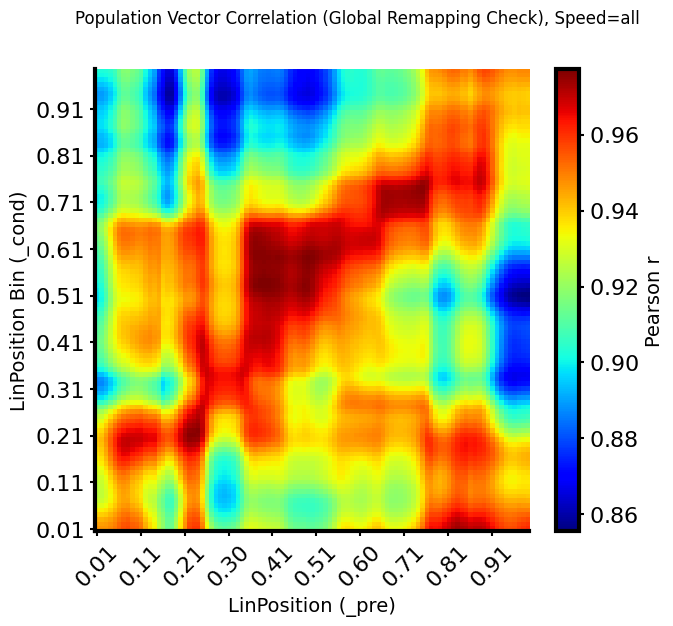

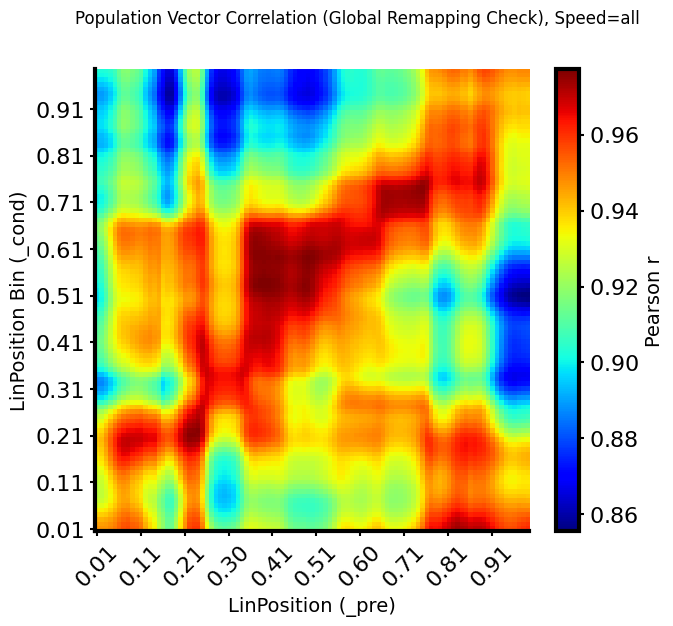

In [19]:
Mouse_Results.plot_pv_correlation("_pre", "_cond", use_speed_filter = False)

using speed filter: True
Using pre epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.35 Hz
using speed filter: True
Using training epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.37 Hz


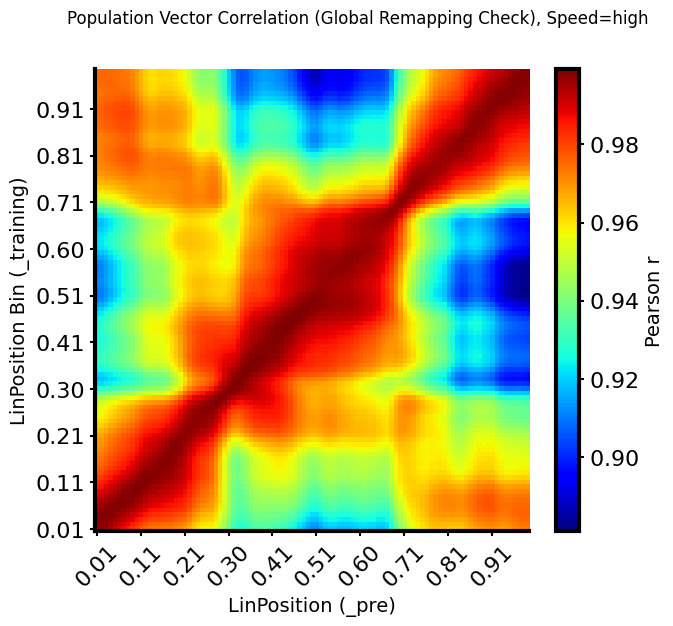

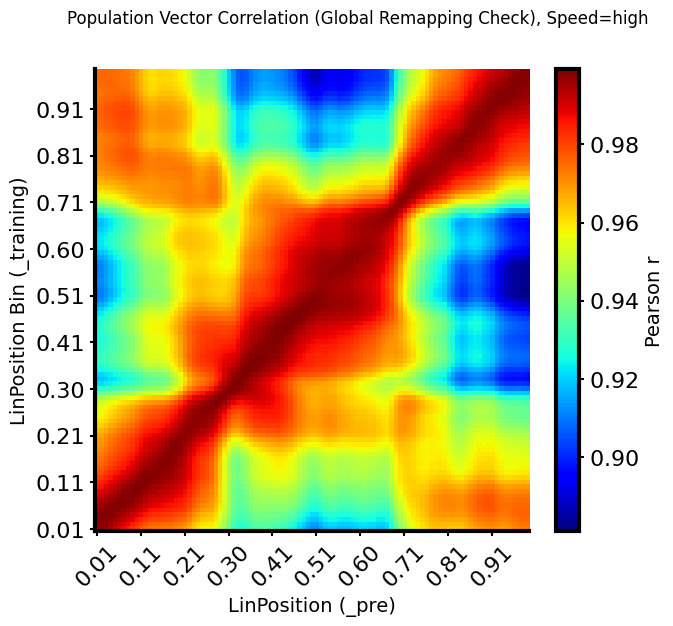

In [24]:

Mouse_Results.plot_pv_correlation("_pre", "_training", use_speed_filter = True)

## analyse latent space 

In [20]:
from umap import UMAP

In [21]:
Mouse_Results.load_data(suffixes=["_training", "_pre", "_cond", "_post"], redo = True, load_pickle = True)

In [144]:
all_data = []
for phase in Mouse_Results.suffixes:
    data_latent = Mouse_Results.resultsNN_phase_pkl[phase]["latent"][0]
    all_data.append(data_latent)

all_data = np.concatenate(all_data)
umap = UMAP(n_components=3, random_state=42)
data_umap["all"] = umap.fit_transform(all_data)

import dill as pickle
with open(f"latent_space_umap_{nameExp}_{mouse}_{manipe}_3d.pkl", "wb") as f:
    pickle.dump(data_umap, f)

/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [141]:
try:
    with open(f"latent_space_umap_{nameExp}_{mouse}_{manipe}_3d.pkl", "rb") as f:
        import dill as pickle
        data_umap = pickle.load(f)
except:
    data_umap = {}
    for phase in Mouse_Results.suffixes:
        data_latent = Mouse_Results.resultsNN_phase_pkl[phase]["latent"][0]
        # data_latent = StandardScaler().fit_transform(data_latent)
        umap = UMAP(n_components=3, random_state=42)
        data_umap[phase] = umap.fit_transform(data_latent)
        all_data = []

        for phase in Mouse_Results.suffixes:
            data_latent = Mouse_Results.resultsNN_phase_pkl[phase]["latent"][0]
            all_data.append(data_latent)

        all_data = np.concatenate(all_data)
        umap = UMAP(n_components=3, random_state=42)
        data_umap["all"] = umap.fit_transform(all_data)

        import dill as pickle
        with open(f"latent_space_umap_{nameExp}_{mouse}_{manipe}_3d.pkl", "wb") as f:
            pickle.dump(data_umap, f)

/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Us

In [23]:
%matplotlib inline

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, widgets
from neuroencoders.importData.epochs_management import inEpochsMask

def get_nn_dist(res):
    from sklearn.neighbors import NearestNeighbors
    nbrs = NearestNeighbors(n_neighbors=2).fit(res)
    distances, _ = nbrs.kneighbors(res  )
    return distances[:, 1] # Distance to the closest neighbor in 64D

freeze_epochs = Mouse_Results.get_freeze_epochs()
ripples_epochs = Mouse_Results.get_ripples_epochs()
forbid_mask = Mouse_Results.ann.forbid_mask_np.astype(bool)

def plot_umap(color_by, phase="_pre"):
    plt.figure(figsize=(10, 8))

    # 1. Determine which phases to extract data from
    phases_to_process = Mouse_Results.suffixes if phase == "all" else [phase]


    # 2. Extract and concatenate the feature data
    concatenated_features = []

    for p in phases_to_process:
        res = Mouse_Results.resultsNN_phase_pkl[p]

        # Mapping for the feature arrays
        feature_map = {
            "featurePredx":     lambda: res["featurePred"][0][:, 0],
            "featureTruex":     lambda: res["featureTrue"][0][:, 0],
            "featurePredy":     lambda: res["featurePred"][0][:, 1],
            "featureTruey":     lambda: res["featureTrue"][0][:, 1],
            "featurePredthigmo":lambda: res["featurePred"][0][:, 3],
            "featureTruethigmo":lambda: res["featureTrue"][0][:, 3],
            "featurePredhd":    lambda: res["featurePred"][0][:, 2],
            "featureTruehd":    lambda: res["featureTrue"][0][:, 2],
            "linearPred":       lambda: res["linearPred"][0],
            "linearTrue":       lambda: res["linearTrue"][0],
            "times":            lambda: res["times"][0],
            "var_total":        lambda: res["var_total"][0],
            "Hn":               lambda: res["Hn"][0],
            "maxp":             lambda: res["maxp"][0],
            "speed":            lambda: Mouse_Results.fullBehavior["Speed"][res["posIndex"][0]],
            "logits_mean":      lambda: res["logits_hw"][0].reshape(res["logits_hw"][0].shape[0], -1).mean(axis=1),
            "logits_max":       lambda: res["logits_hw"][0].reshape(res["logits_hw"][0].shape[0], -1).max(axis=1),
            "phase":            lambda: (Mouse_Results.suffixes.index(p) +1 )* np.ones_like(res["times"][0]),
            "latent_norm":      lambda: np.linalg.norm(res["latent"][0], axis = 1),
            "nn_dist":          lambda: get_nn_dist(res["latent"][0]),
            "mean_forbid_p":    lambda: res["logits_hw"][0][:, forbid_mask].mean(1),
            "max_forbid_p":     lambda: res["logits_hw"][0][:, forbid_mask].max(1),
            "median_forbid_p":  lambda: np.median(res["logits_hw"][0][:, forbid_mask],1),
            "freezing":         lambda: inEpochsMask(res["times"][0], freeze_epochs).flatten(),
            "ripples":         lambda: inEpochsMask(res["times"][0], ripples_epochs).flatten(),
        }

        if color_by in feature_map:
            val = feature_map[color_by]()
        else:
            # Fallback for latent dimensions if passed as numeric strings
            val = res["latent"][0][str(color_by)]

        concatenated_features.append(val)

    to_use = np.concatenate(concatenated_features)
    # 3. Plotting
    highlight_features = ["freezing", "ripples"]

    if color_by in highlight_features:
            # Create arrays for properties based on the mask
            mask = to_use > 0

            # High contrast mapping: 0 -> Light Gray, 1 -> Bright Red/Orange
            # We use a custom normalization so 0 is always one end and 1 is the other
            sizes = np.where(mask, 4, 2)       # Active points are much larger
            alphas = np.where(mask, 1.0, 0.1)    # Inactive points are faint
            current_cmap = 'autumn'
    else:
        # Standard continuous/phase behavior
        sizes = 2
        alphas = 0.7
        current_cmap = 'viridis' if color_by != "phase" else plt.get_cmap('PiYG', len(np.unique(to_use)))

    # 4. Single Scatter Call
    # Note: matplotlib scatter accepts arrays for s and alpha (in some versions),
    # but for max compatibility and speed, we use a single call with array-based sizes.
    scatter = plt.scatter(
        data_umap[phase][:, 0],
        data_umap[phase][:, 1],
        c=to_use,
        s=sizes,
        alpha=0.7, # We apply alpha via the cmap or globally to prevent flickering in interact
        cmap=current_cmap,
        zorder=1 # Default zorder
    )

    # Force zorder adjustment if highlighting
    if color_by in highlight_features:
        # This sorts points so that True values are drawn last (on top)
        sort_idx = np.argsort(to_use)
        plt.cla() # Clear and redraw with sorted order for perfect z-stacking
        scatter = plt.scatter(
            data_umap[phase][sort_idx, 0],
            data_umap[phase][sort_idx, 1],
            c=to_use[sort_idx],
            s=sizes[sort_idx] if isinstance(sizes, np.ndarray) else sizes,
            alpha=alphas[sort_idx] if isinstance(alphas, np.ndarray) else alphas,
            cmap=current_cmap
        )

    # 5. UI Elements
    cbar = plt.colorbar(scatter)
    cbar.set_label(color_by)

    plt.title(f'UMAP colored by {color_by} | Phase: {phase}')
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.show()

# --- Widget Setup ---
list_colors = ["times", "var_total", "Hn", "linearPred", "linearTrue",
               "featurePredx", "featureTruex", "featurePredy", "featureTruey",
               "featurePredthigmo", "featureTruethigmo", "featurePredhd",
               "featureTruehd", "speed", "logits_mean", "logits_max", "maxp", "phase",
               "latent_norm", "nn_dist", "mean_forbid_p",
               "max_forbid_p", "median_forbid_p", "freezing", "ripples"]

list_phases = ["_pre", "_cond", "_post", "_training", "all"]

interact(plot_umap,
         color_by=widgets.Dropdown(options=list_colors, description="Color by:"),
         phase=widgets.Dropdown(options=list_phases, description="Phase:"))

/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/utils/global_classes.py:1830: UserWarning: Some starts and ends are equal. Removing 1 microsecond!
Some starts precede the previous end. Joining them!
  ripples_epochs = IntervalSet(


interactive(children=(Dropdown(description='Color by:', options=('times', 'var_total', 'Hn', 'linearPred', 'li…

<function __main__.plot_umap(color_by, phase='_pre')>

In [32]:
phase = "_cond"

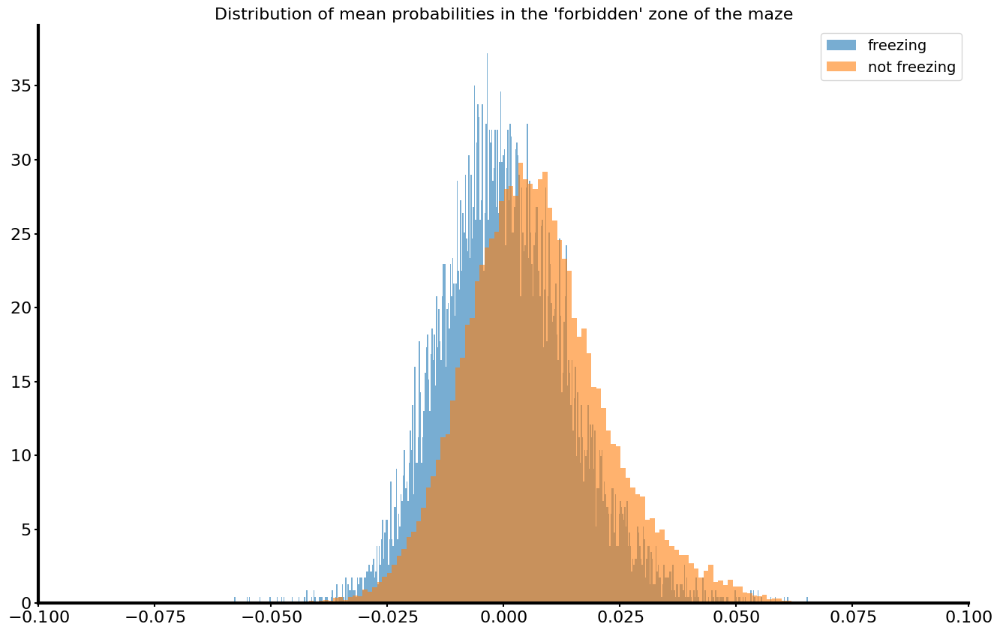

In [69]:
forbid_mask = Mouse_Results.ann.forbid_mask_np.astype(bool)
is_freezing = inEpochsMask( Mouse_Results.resultsNN_phase_pkl[phase]["times"][0], freeze_epochs)
plt.figure()
plt.hist(np.mean(Mouse_Results.resultsNN_phase_pkl[phase]["logits_hw"][0][is_freezing][:, forbid_mask], 1), 500, label = "freezing", density = True, alpha = 0.6)
plt.hist(np.mean(Mouse_Results.resultsNN_phase_pkl[phase]["logits_hw"][0][~is_freezing][:, forbid_mask], 1), 500, label = "not freezing",  density = True, alpha = 0.6)
plt.legend()
plt.xlim(-0.1,0.1)
plt.title("Distribution of mean probabilities in the 'forbidden' zone of the maze")
plt.show()

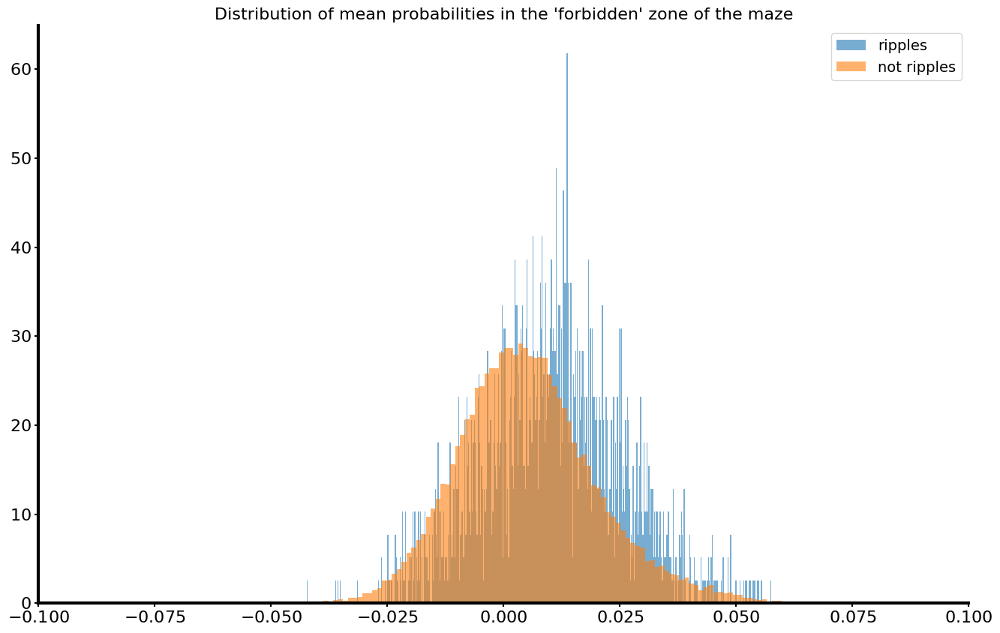

In [70]:
forbid_mask = Mouse_Results.ann.forbid_mask_np.astype(bool)
is_ripples = inEpochsMask(Mouse_Results.resultsNN_phase_pkl[phase]["times"][0], ripples_epochs)
plt.figure()
plt.hist(np.mean(Mouse_Results.resultsNN_phase_pkl[phase]["logits_hw"][0][is_ripples][:, forbid_mask], 1), 500, label = "ripples", density = True, alpha = 0.6)
plt.hist(np.mean(Mouse_Results.resultsNN_phase_pkl[phase]["logits_hw"][0][~is_ripples][:, forbid_mask], 1), 500, label = "not ripples",  density = True, alpha = 0.6)
plt.legend()
plt.xlim(-0.1,0.1)
plt.title("Distribution of mean probabilities in the 'forbidden' zone of the maze")
plt.show()

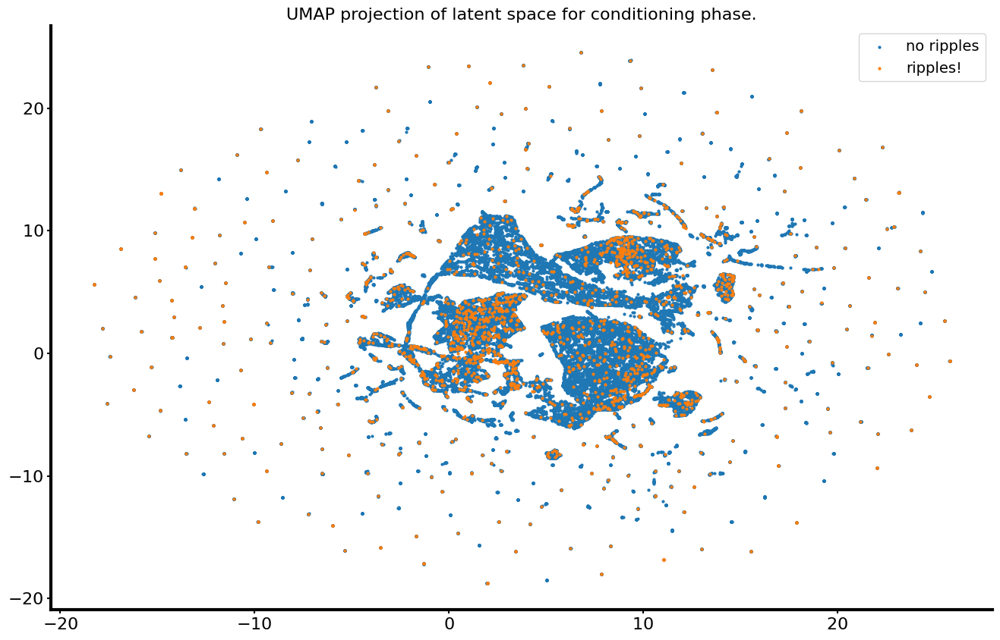

In [42]:
coords = data_umap[phase]
is_ripples = inEpochsMask(Mouse_Results.resultsNN_phase_pkl[phase]["times"][0], ripples_epochs)
plt.figure()
plt.scatter(coords[~is_ripples,0], coords[~is_ripples,1], zorder = 1, label = "no ripples")
plt.scatter(coords[is_ripples,0], coords[is_ripples,1], zorder = 2, label = "ripples!")
plt.legend()
plt.title("UMAP projection of latent space for conditioning phase.")
plt.show()

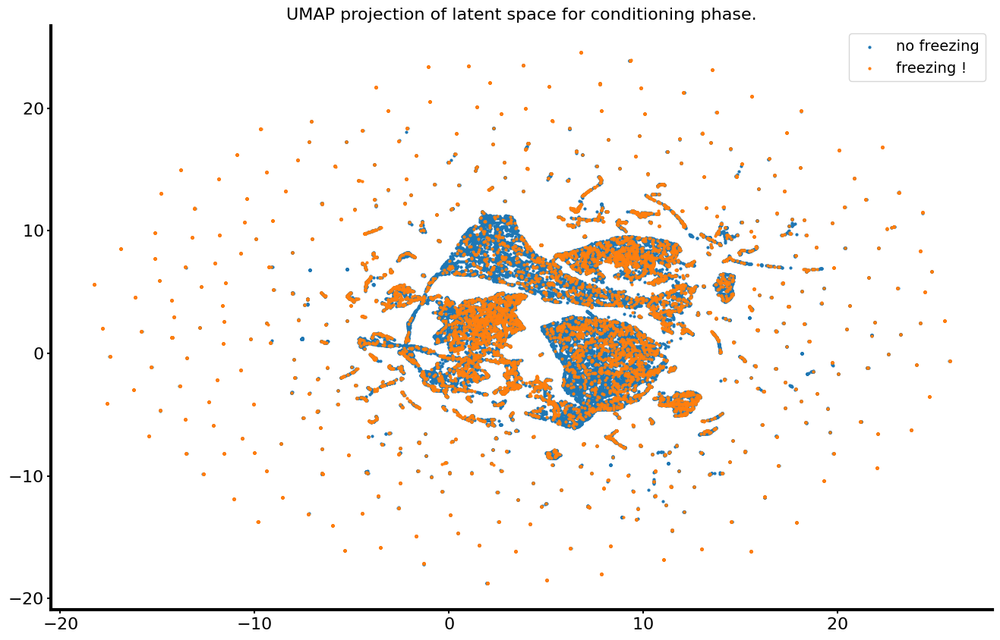

In [40]:
coords = data_umap[phase]
is_freezing = inEpochsMask( Mouse_Results.resultsNN_phase_pkl[phase]["times"][0], freeze_epochs )
plt.figure()
plt.scatter(coords[~is_freezing,0], coords[~is_freezing,1], zorder = 1, label = "no freezing")
plt.scatter(coords[is_freezing,0], coords[is_freezing,1], zorder = 2, label = "freezing !")
plt.legend()
plt.title("UMAP projection of latent space for conditioning phase.")
plt.show()

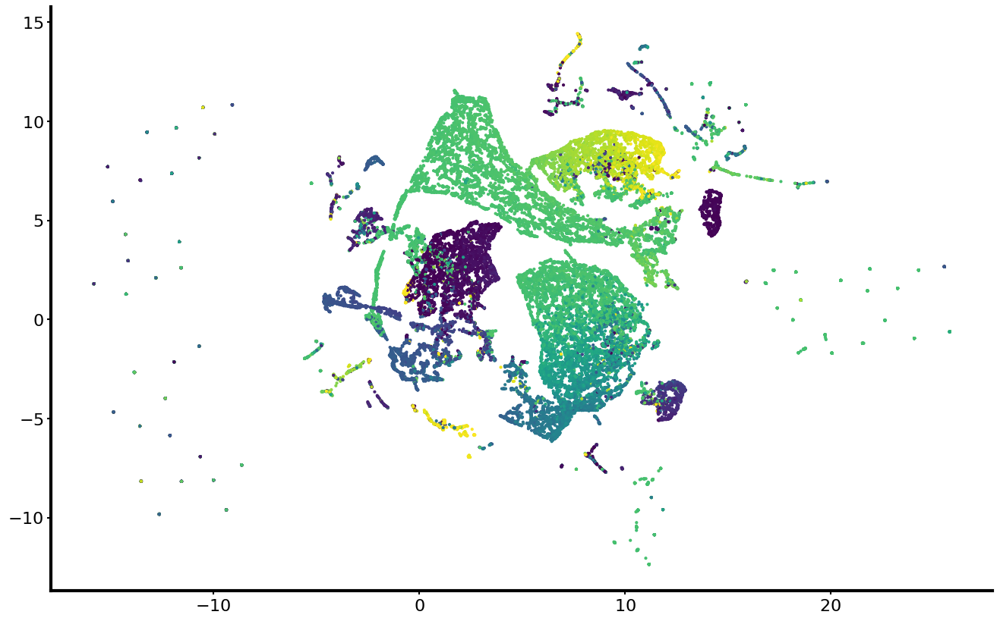

In [75]:
from neuroencoders.utils.backend import cuml
import numpy as np

# 1. Grab your UMAP coordinates
coords = data_umap[phase]

# 2. Run HDBSCAN
# min_cluster_size=30 means any group smaller than 30 is labeled as noise (-1)
clusterer = cuml.cluster.HDBSCAN(min_cluster_size=400, min_samples=10, prediction_data=True)
cluster_labels = clusterer.fit_predict(coords)

# 3. Create a mask for "valid" points (not noise)
valid_mask = cluster_labels != -1

# 4. Filter your data
filtered_umap = coords[valid_mask]
filtered_latent = Mouse_Results.resultsNN_phase_pkl[phase]["latent"][0][valid_mask]
# Remember to filter your predictions/behavior too!
# plt.scatter(coords[:,0], coords[:,1], c = valid_mask, cmap = "grey")
plt.figure()
plt.scatter(filtered_umap[:,0], filtered_umap[:,1], c = Mouse_Results.resultsNN_phase_pkl[phase]["linearPred"][0][valid_mask])
plt.show()

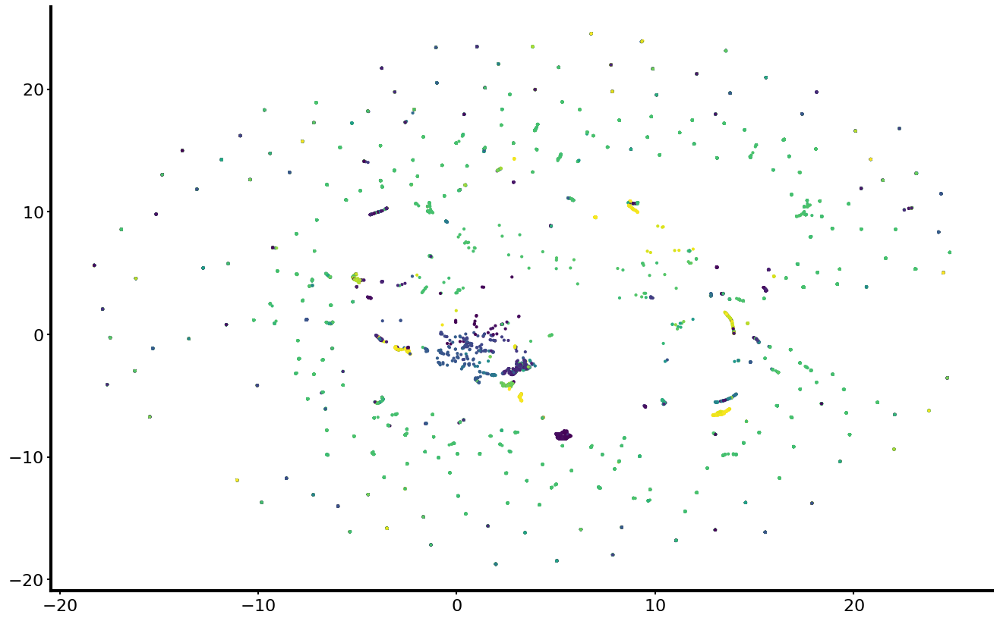

In [90]:
plt.figure()
plt.scatter(coords[~valid_mask,0], coords[~valid_mask,1], c = Mouse_Results.resultsNN_phase_pkl[phase]["linearPred"][0][~valid_mask])
plt.show()

In [91]:
res = Mouse_Results.resultsNN_phase_pkl[phase]

Text(0.5, 0.98, 'Heatmap at OOD')

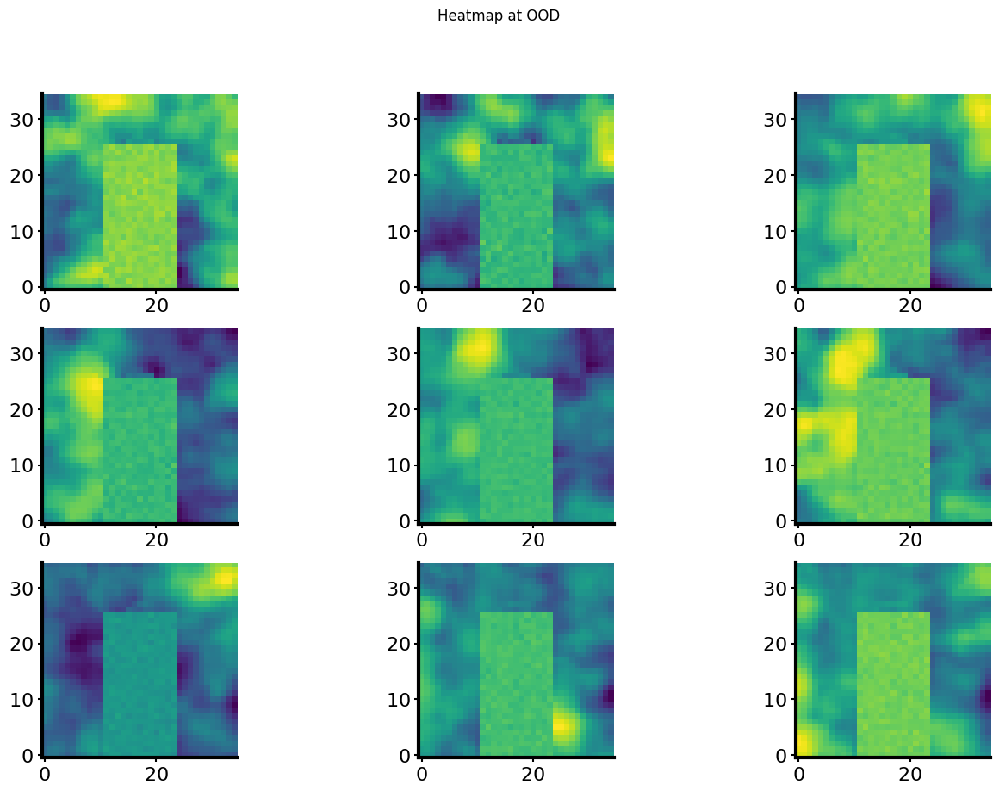

In [92]:
fig, axs = plt.subplots(3,3)
axs = axs.flatten()
wrong_logits = Mouse_Results.resultsNN_phase_pkl[phase]["logits_hw"][0][~valid_mask]
for i in range(9):
    axs[i].imshow(wrong_logits[i], origin  = "lower")

fig.suptitle("Heatmap at OOD")

/tmp/ipykernel_2293802/2685296968.py:8: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


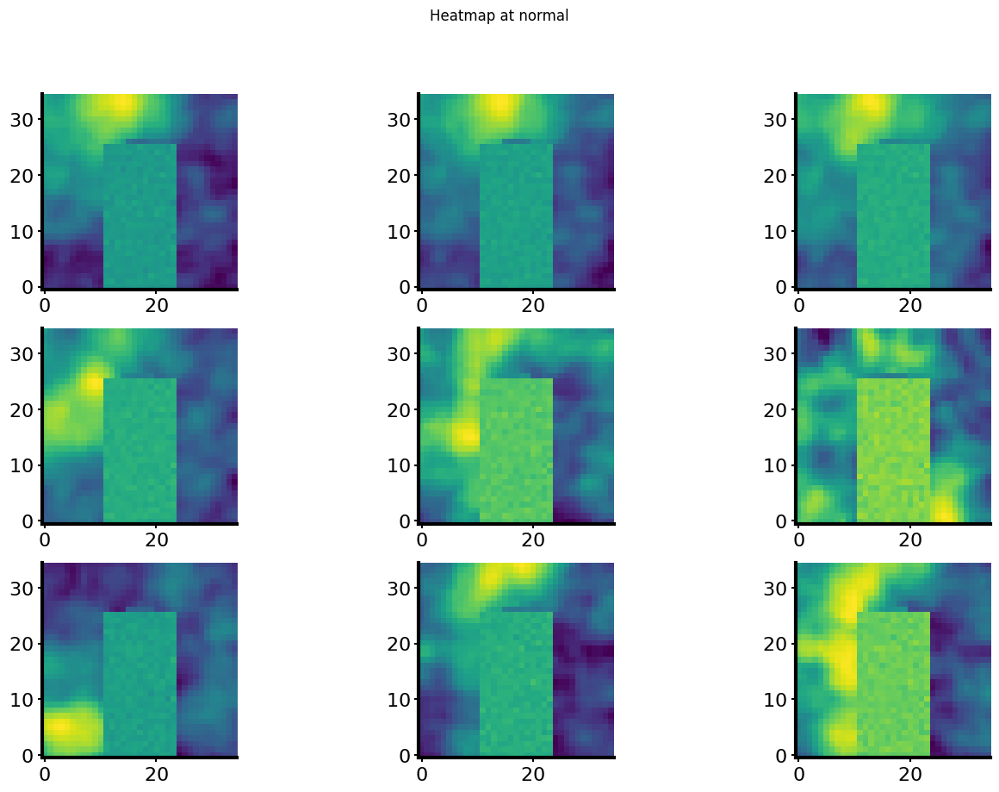

In [93]:
fig, axs = plt.subplots(3,3)
axs = axs.flatten()
good_logits = Mouse_Results.resultsNN_phase_pkl[phase]["logits_hw"][0][valid_mask]
for i in range(9):
    axs[i].imshow(good_logits[i], origin  = "lower")

fig.suptitle("Heatmap at normal")
fig.show()

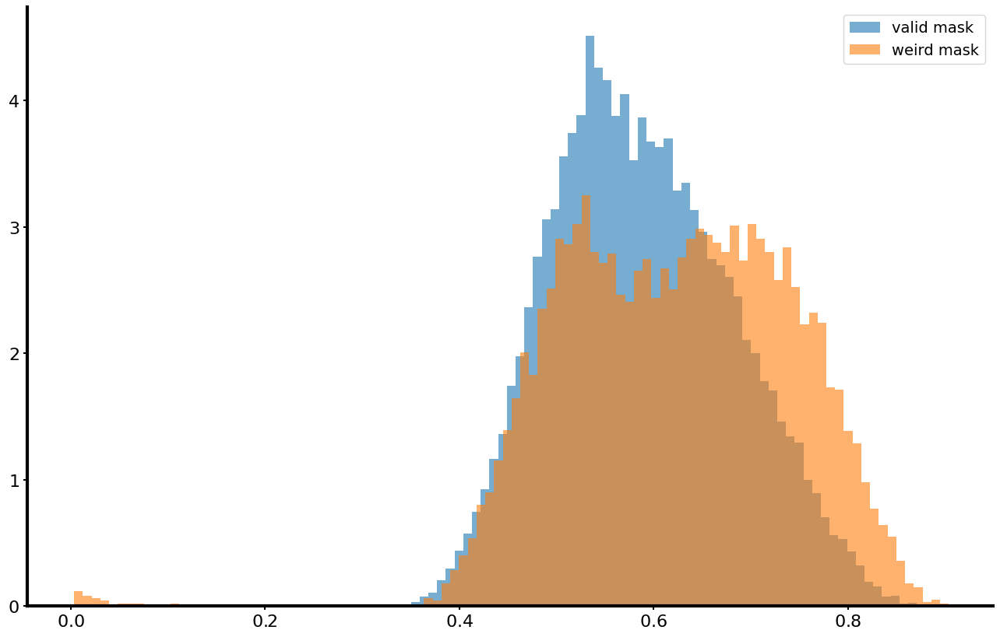

In [94]:
plt.figure()
plt.hist(Mouse_Results.resultsNN_phase_pkl[phase]["Hn"][0][valid_mask], label = "valid mask", alpha = 0.6, bins = 100, density = True)
plt.hist(Mouse_Results.resultsNN_phase_pkl[phase]["Hn"][0][~valid_mask], label = "weird mask", alpha = 0.6, bins = 100, density = True)
plt.legend()
plt.show()

In [95]:
entropy_chelou = np.where(Mouse_Results.resultsNN_phase_pkl[phase]["Hn"][0][~valid_mask] < 0.2)[0]

In [97]:
xy, maxp, Hn, var_total  = Mouse_Results.ann.decode_and_uncertainty_tf(Mouse_Results.resultsNN_phase_pkl[phase]["logits_hw"][0][~valid_mask][entropy_chelou])

In [98]:
self = Mouse_Results.ann

In [99]:
logits_hw = Mouse_Results.resultsNN_phase_pkl[phase]["logits_hw"][0][~valid_mask][entropy_chelou][:2]

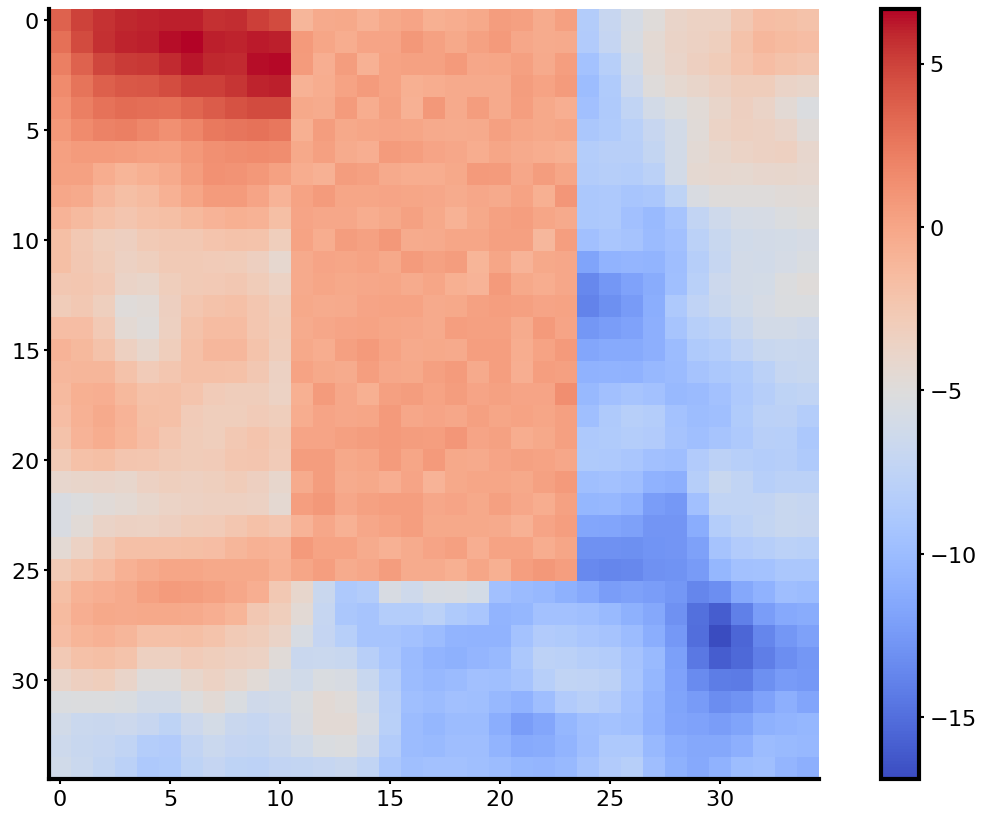

In [100]:
from matplotlib.colors import TwoSlopeNorm
plt.figure()
plt.imshow(Mouse_Results.resultsNN_phase_pkl[phase]["logits_hw"][0][valid_mask][-17], cmap = "coolwarm")
plt.colorbar()

In [102]:
all_logits = Mouse_Results.resultsNN_phase_pkl[phase]["logits_hw"][0]
all_preds = Mouse_Results.resultsNN_phase_pkl[phase]["linearPred"][0]
all_true = Mouse_Results.resultsNN_phase_pkl[phase]["linearTrue"][0]
forbid_mask = Mouse_Results.ann.forbid_mask_np.astype(bool)
speed_mask = Mouse_Results.resultsNN_phase_pkl[phase]["speedMask"][0]

mean_p = all_logits[:, forbid_mask].mean(1)
max_p = all_logits[:, forbid_mask].max(1)
median_p = np.median(all_logits[:, forbid_mask], 1)
error = np.abs(all_preds-all_true)


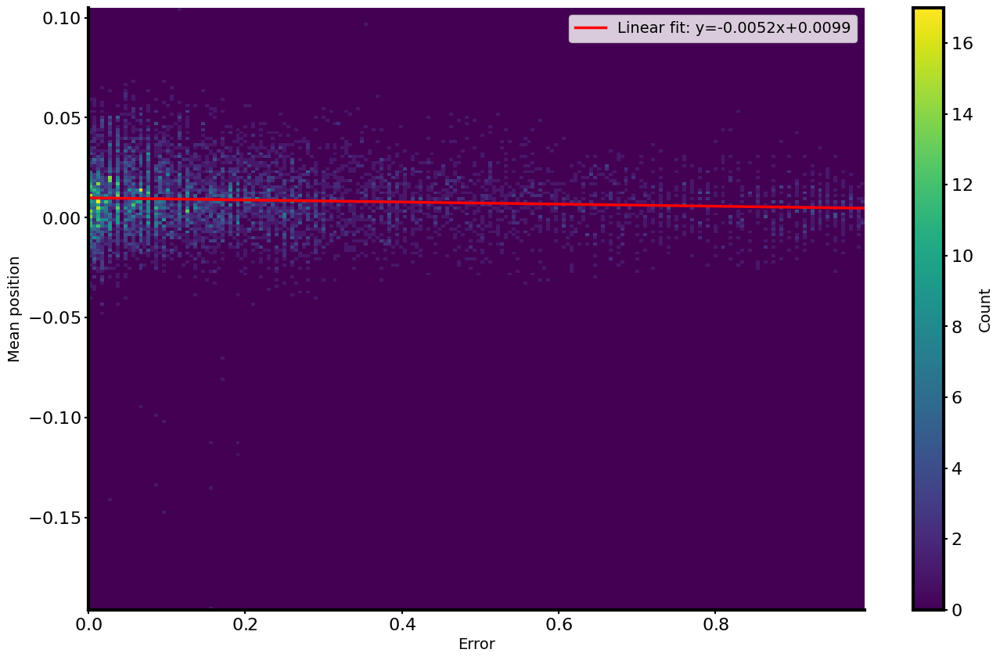

In [103]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure()
plt.hist2d(error[speed_mask], mean_p[speed_mask], 200)

# Compute linear fit: mean_p = f(error)
coeffs = np.polyfit(error[speed_mask], mean_p[speed_mask], 1)
p = np.poly1d(coeffs)
x_fit = np.linspace(np.nanmin(error[speed_mask]), np.nanmax(error[speed_mask]), 100)
y_fit = p(x_fit)

# Plot the linear fit as red line
plt.plot(x_fit, y_fit, 'r-', linewidth=2.5,
         label=f'Linear fit: y={coeffs[0]:.4f}x+{coeffs[1]:.4f}')
plt.colorbar(label='Count')
plt.xlabel('Error')
plt.ylabel('Mean position')
plt.legend()

plt.show()

In [105]:
B = tf.shape(logits_hw)[0]
H, W = self.GRID_H, self.GRID_W

# Mask forbidden
masked_logits = tf.where(
    self.forbid_mask_tf[None] > 0, self.common_neg, logits_hw
)

# Softmax over grid
probs_flat = tf.nn.softmax(tf.reshape(masked_logits, [B, H * W]), axis=-1)
probs = tf.reshape(probs_flat, [B, H, W])


In [114]:
# Renormalize (safety)
allowed_mask = self.get_allowed_mask(use_tensorflow=True)
probs_allowed = probs * allowed_mask
sum_p = tf.reduce_sum(probs_allowed, axis=[1, 2], keepdims=True)
probs_allowed /= sum_p + self.common_eps


/tmp/ipykernel_2293802/3144762433.py:7: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


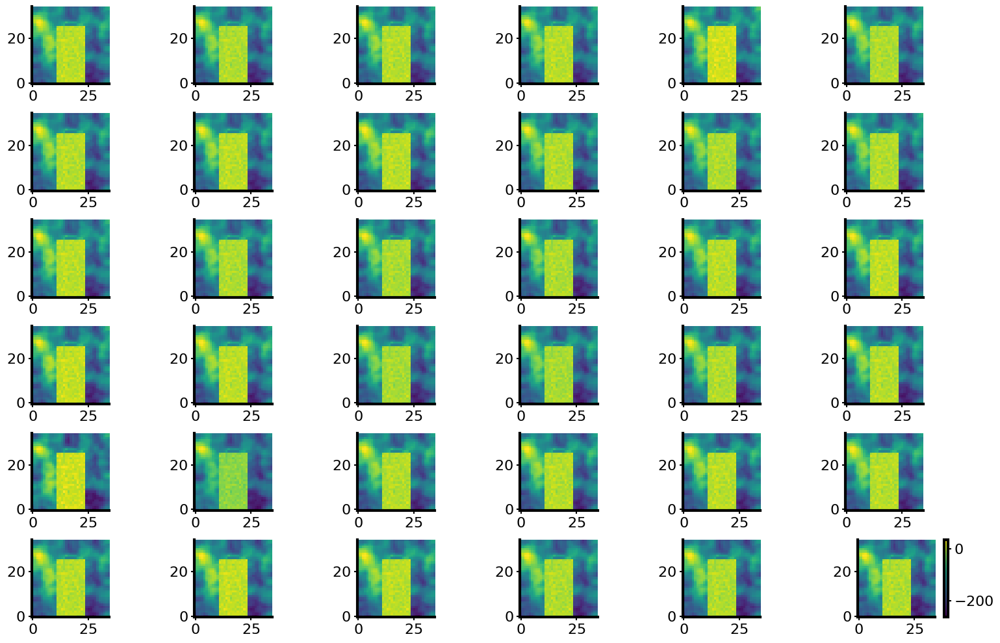

In [112]:
fig, axs = plt.subplots(6,6)
axs = axs.ravel()
for i in range(36):
    zouzou = axs[i].imshow(Mouse_Results.resultsNN_phase_pkl[phase]["logits_hw"][0][~valid_mask][entropy_chelou][i], origin = "lower")
plt.colorbar(zouzou)
fig.tight_layout()
fig.show()

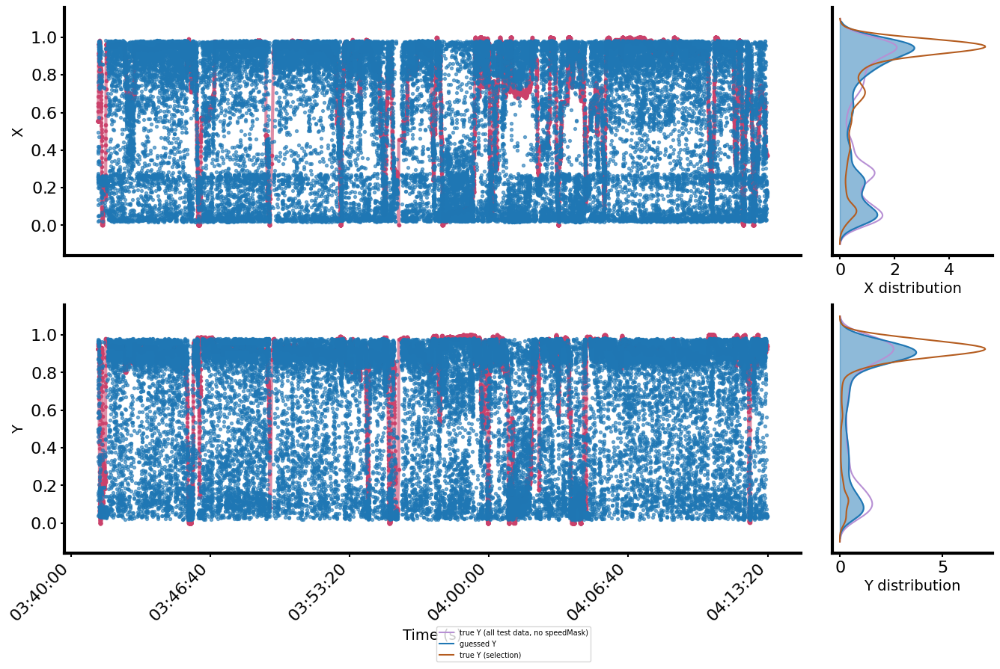

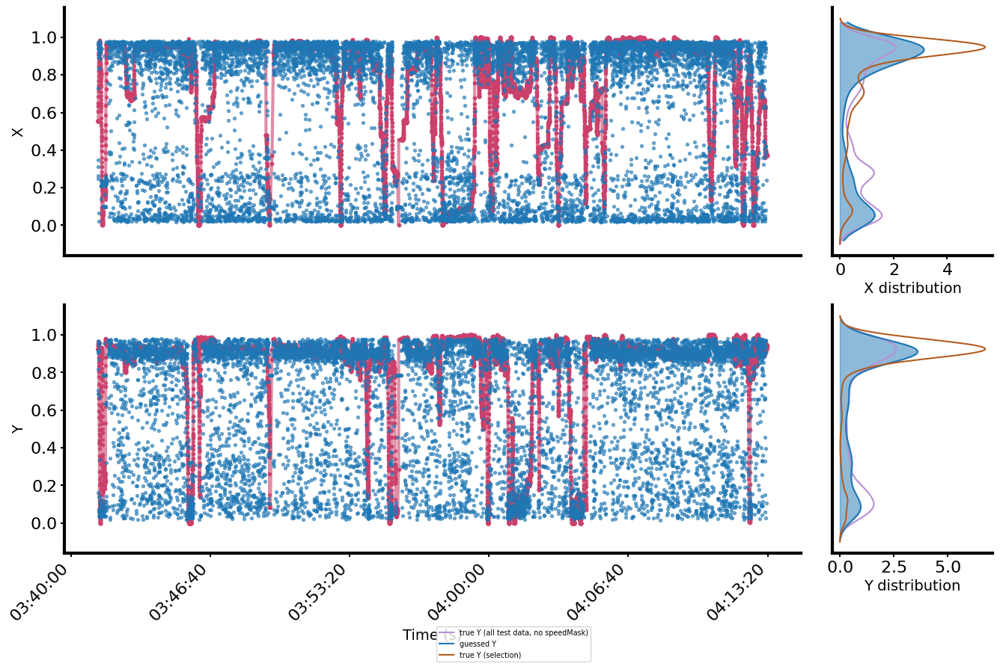

In [113]:
from neuroencoders.resultAnalysis.print_results import overview_fig

overview_fig(
    pos=res["featureTrue"][0][:,:2],
    inferring=res["featurePred"][0][:,:2],
    selection=valid_mask,
    outfolder="~/download/",
    dimOutput=2,
    show=True,
    speedMask=None,
    training_data=Mouse_Results.resultsNN_phase["_training"]["featureTrue"][0][:,:2],
    posIndex=res["posIndex"][0],
    timeStepsPred=res["times"][0],
    close = False

)
overview_fig(
    pos=res["featureTrue"][0][:,:2],
    inferring=res["featurePred"][0][:,:2],
    selection=np.logical_not(valid_mask),
    outfolder="~/download/",
    dimOutput=2,
    show=True,
    speedMask=None,
    training_data=Mouse_Results.resultsNN_phase["_training"]["featureTrue"][0][:,:2],
    posIndex=res["posIndex"][0],
    timeStepsPred=res["times"][0],
    close = False

)

## Analyse spike data during freezing

spike sorting found 91 neurons, full response has shape (162, 91), will sort using a map of shape (91,)


/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.13/site-packages/pynapple/core/time_series.py:278: RuntimeWarning: divide by zero encountered in divide
  out = ufunc(*new_args, **kwargs)


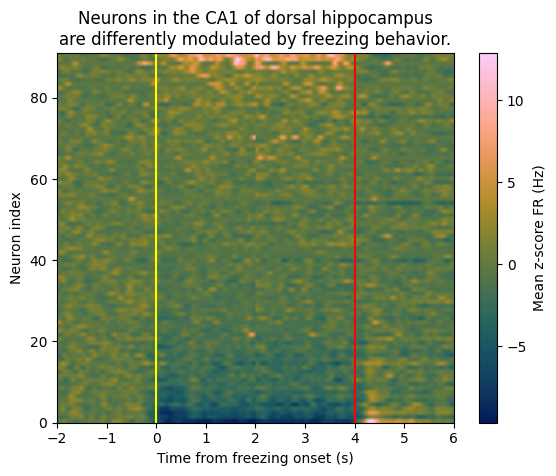

In [25]:
import copy
import pynapple as nap

# Parameters from your template
wi = 2.0
bin_size = 0.05
restrict = True

# 1. Get smoothed firing rate (z-scored as in your template)
# Assuming 'spikes' is your TsGroup
spikes = Mouse_Results.DataHelper.get_spike_data()
counts = spikes.count(bin_size)
fr = counts / bin_size
cond_epoch = Mouse_Results.cond
freeze_epochs = Mouse_Results.DataHelper.get_freeze_epochs().intersect(cond_epoch)
cond_epoch = nap.IntervalSet(Mouse_Results.cond)

z_fr = fr.smooth(0.05)
# 2. Compute PETH around Onsets
# 'freeze_epochs' is an IntervalSet
onsets = nap.Ts(freeze_epochs.start)
peth_on = nap.compute_perievent(z_fr, onsets, window=(-wi, wi), epochs = cond_epoch)

# 3. Compute PETH around Offsets
offsets = nap.Ts(freeze_epochs.end)
peth_off = nap.compute_perievent(z_fr, offsets, window=(-wi, wi), epochs = cond_epoch)

# 4. Average across trials to get the mean response per neuron
# peth_on.mean() returns a TsdFrame (time x neurons)
mean_on = peth_on.mean(axis = 1)
mean_off = peth_off.mean(axis = 1)
mean_on[np.isinf(mean_on)] = np.nan
mean_off[np.isinf(mean_off)] = np.nan

time_pre = mean_on.times() <= - 0.5
mean_pre = mean_on[time_pre].mean(0, keepdims=True)
z_pre = mean_on[time_pre].std(0, keepdims=True)

mean_on = (mean_on - mean_pre) / z_pre
mean_off = (mean_off - mean_pre) / z_pre
mean_on[np.isinf(mean_on)] = np.nan
mean_off[np.isinf(mean_off)] = np.nan
times_mask = (peth_on.times() >= -0.05) & (peth_on.times() <= 1.9)

sort_idx_full = np.argsort(mean_on.values[times_mask].mean(0))
keep_neurons_on = ~np.isnan(mean_on).all(axis = 0)
keep_neurons_off = ~np.isnan(mean_off).all(axis = 0)
keep_neurons = keep_neurons_on | keep_neurons_off

full_response = np.vstack([mean_on.values, mean_off.values])
# every inf is set to nan

print(f"spike sorting found {len(spikes.values())} neurons, full response has shape {full_response.shape}, will sort using a map of shape {sort_idx_full.shape}")
sorted_heatmap = full_response[:,sort_idx_full]

plt.figure()
plt.imshow(sorted_heatmap.T[keep_neurons[sort_idx_full]], origin = "lower", aspect = "auto", extent = (-wi, 3*wi, 0, sorted_heatmap.T.shape[0]), cmap = "cmc.batlow")
plt.colorbar(label = "Mean z-score FR (Hz)")
plt.axvline(0, label = "Freezing onset", color = "yellow")
plt.axvline(2*wi, label = "Freezing offset", color = "red")
plt.xlabel("Time from freezing onset (s)")
plt.ylabel("Neuron index")
plt.title("Neurons in the CA1 of dorsal hippocampus\nare differently modulated by freezing behavior.")
plt.show()

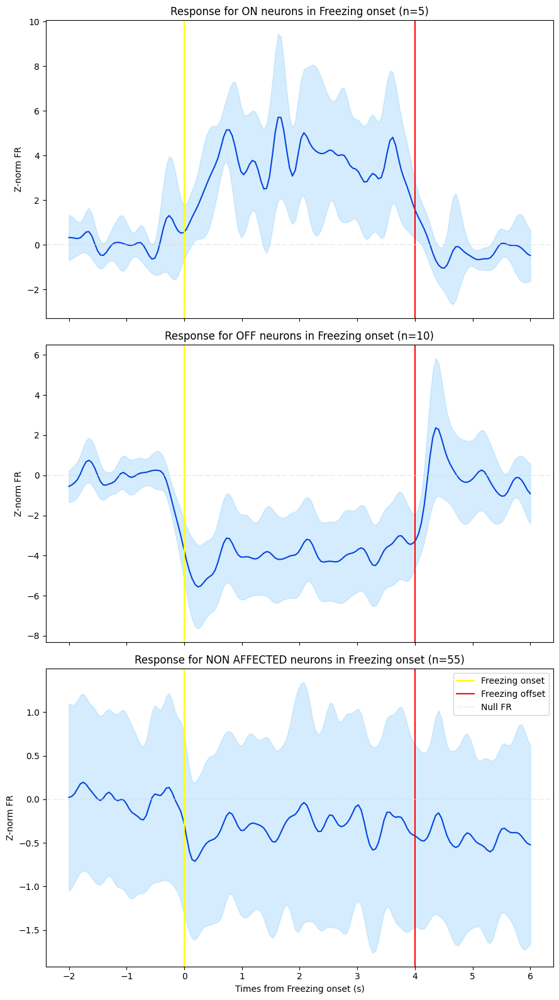

In [26]:
from scipy.ndimage import gaussian_filter

sigma = 1.5

freezing_response = full_response.T
keep_neurons_sorted = keep_neurons[sort_idx_full]
on_neurons_freezing = sort_idx_full[keep_neurons_sorted][-5:]
off_neurons_freezing = sort_idx_full[keep_neurons_sorted][:10]
not_affected_neurons_freezing = sort_idx_full[keep_neurons_sorted][20:-15]
on_response = freezing_response[on_neurons_freezing]
off_response = freezing_response[off_neurons_freezing]
no_response = freezing_response[not_affected_neurons_freezing]
# show mean response for on and off

fig, axs = plt.subplots(3, sharex = True, sharey = False, figsize = (9,16))
axs = axs.flatten()
times = np.linspace(- wi, 3*wi, on_response.shape[1])
for i, (response, status) in enumerate(zip([on_response, off_response, no_response], ["on", "off", "non affected"])):
    mean = gaussian_filter(np.nanmean(response, axis=0), sigma = sigma)
    std = gaussian_filter(np.nanstd(response, axis=0), sigma = sigma)
    # first, plot individual traces in light grey
    # for resp in response:
    #     axs[i].plot(times, resp, color = "xkcd:light grey", alpha = 0.4)
    axs[i].plot(times, mean, color = "xkcd:blue")
    axs[i].fill_between(times, mean - 1*std, mean + 1*std, color = "xkcd:light blue", alpha = 0.4)
    axs[i].set_title(f"Response for {status.upper()} neurons in Freezing onset (n={response.shape[0]})")
    axs[i].axvline(0, label = "Freezing onset", color = "yellow")
    axs[i].axvline(2*wi, label = "Freezing offset", color = "red")
    axs[i].set_ylabel("Z-norm FR")
    axs[i].axhline(0, label = "Null FR", linestyle = "--", alpha = 0.4, color = "xkcd:light grey")

axs[-1].set_xlabel("Times from Freezing onset (s)")
axs[-1].legend()
fig.tight_layout()
plt.show()

### look at ON neurons and their PFs

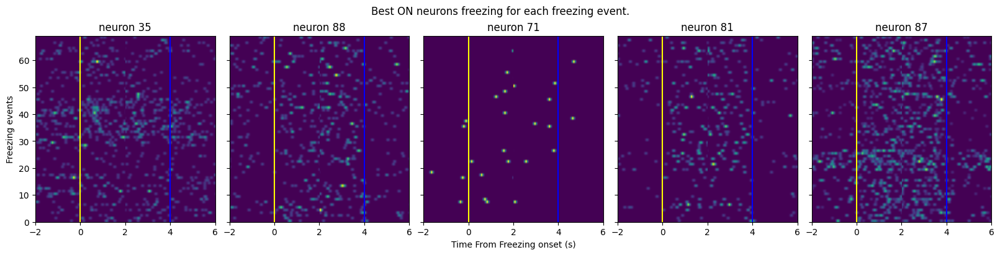

In [27]:
fig, axs = plt.subplots(1, len(on_neurons_freezing), sharex = True, sharey = True, figsize = (16,4), constrained_layout = True)
axs = axs.ravel()
full_resp = np.concatenate([peth_on.values, peth_off.values], axis = 0)
for i, neuron in enumerate(on_neurons_freezing):
    axs[i].imshow(full_resp[:,:,neuron].T, extent = (- wi, 3*wi, 0, full_resp.shape[1]), aspect = "auto")
    axs[i].set_title(f"neuron {neuron}")
    axs[i].axvline(0, label = "Freezing onset", color = "yellow")
    axs[i].axvline(2*wi, label = "Freezing offset", color = "blue")
axs[i//2].set_xlabel("Time From Freezing onset (s)")
axs[0].set_ylabel("Freezing events")
fig.suptitle("Best ON neurons freezing for each freezing event.")
plt.show()

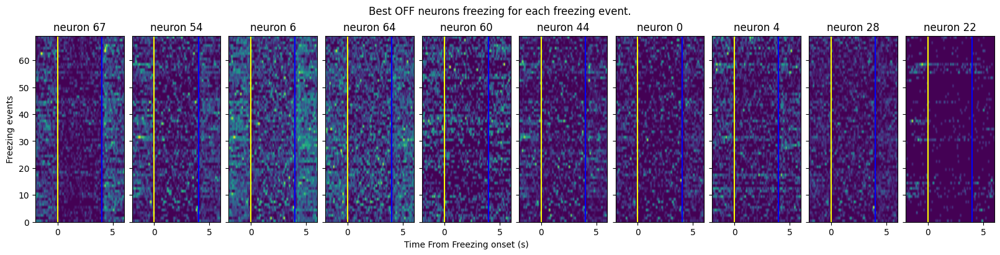

In [28]:
fig, axs = plt.subplots(1, len(off_neurons_freezing), sharex = True, sharey = True, figsize = (16,4), constrained_layout = True)
axs = axs.ravel()
full_resp = np.concatenate([peth_on.values, peth_off.values], axis = 0)
for i, neuron in enumerate(off_neurons_freezing):
    axs[i].imshow(full_resp[:,:,neuron].T, extent = (- wi, 3*wi, 0, full_resp.shape[1]), aspect = "auto")
    axs[i].set_title(f"neuron {neuron}")
    axs[i].axvline(0, label = "Freezing onset", color = "yellow")
    axs[i].axvline(2*wi, label = "Freezing offset", color = "blue")
axs[i//2].set_xlabel("Time From Freezing onset (s)")
axs[0].set_ylabel("Freezing events")
fig.suptitle("Best OFF neurons freezing for each freezing event.")
plt.show()

In [29]:
main_dir = os.path.realpath("/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Figures/Pres180526")

In [30]:
on_neurons_freezing

array([35, 88, 71, 81, 87])

using speed filter: True
Using training epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.37 Hz
using speed filter: False
Using training epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 14.37 Hz
using speed filter: True
Using cond epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 13.69 Hz
using speed filter: False
Using cond epochs for linear tuning curve calculation.
Estimated sampling rate from position data: 13.69 Hz


/tmp/ipykernel_210144/1862964823.py:36: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


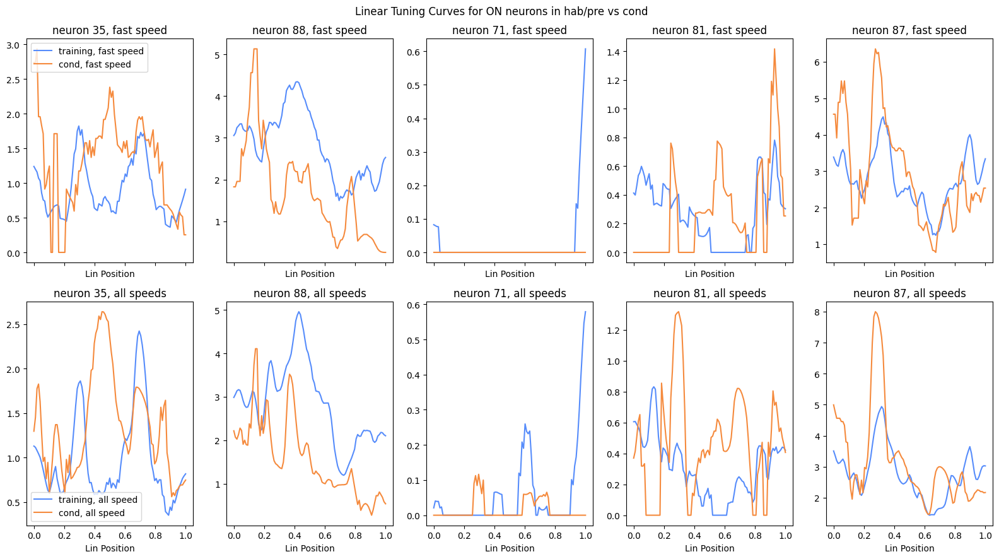

In [38]:
fig, axs = plt.subplots(2, len(on_neurons_freezing), figsize = (16,9), sharex = True)
l_function = Mouse_Results.l_function
for p, suffix in enumerate(["_training", "_cond"]):
    lin_place_fields, bin_edges = Mouse_Results.trainerBayes.calculate_linear_tuning_curve(
        suffix = suffix,
        l_function=l_function,
        behaviorData=Mouse_Results.DataHelper.fullBehavior,
        use_speed_filter=True
        )
    lin_pos = np.linspace(0, 1, np.array(lin_place_fields).shape[1])
    for i, neuron in enumerate(on_neurons_freezing):
        axs[0, i].plot(lin_pos, lin_place_fields[neuron], label = f"{suffix.strip('_')}, fast speed")
        axs[0, i].set_title(f"neuron {neuron}, fast speed")
        # axs[0,i].set_xlabel("Lin Position")


    lin_place_fields, bin_edges = Mouse_Results.trainerBayes.calculate_linear_tuning_curve(
        suffix = suffix,
        l_function=l_function,
        behaviorData=Mouse_Results.DataHelper.fullBehavior,
        use_speed_filter=False
        )

    for i, neuron in enumerate(on_neurons_freezing):
        axs[1, i].plot(lin_pos, lin_place_fields[neuron], label = f"{suffix.strip('_')}, all speed")
        axs[1, i].set_title(f"neuron {neuron}, all speeds")
        axs[1,i].set_xlabel("Lin Position")

axs[0,0].set_ylabel("Firing Rate (Hz)")
axs[1,0].set_ylabel("Firing Rate (Hz)")

axs[0, 0].legend(loc = "upper left")
axs[-1, 0].legend(loc = "lower left")
fig.suptitle("Linear Tuning Curves for ON neurons in hab/pre vs cond")
fig.tight_layout()
fig.savefig(os.path.join(main_dir, "lt_curves_ON_FREEZING.png"))
fig.savefig(os.path.join(main_dir, "lt_curves_ON_FREEZING.svg"))

fig.show()

using speed filter: True
Using training epochs for linear tuning curve calculation.
using speed filter: False
Using training epochs for linear tuning curve calculation.
using speed filter: True
Using cond epochs for linear tuning curve calculation.
using speed filter: False
Using cond epochs for linear tuning curve calculation.


/tmp/ipykernel_3933799/1798941213.py:31: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


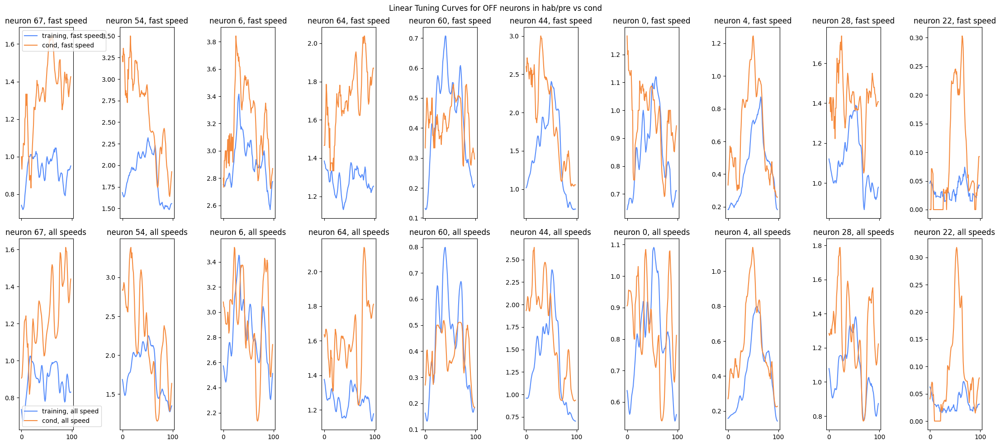

In [74]:
fig, axs = plt.subplots(2, len(off_neurons_freezing), sharex = True, figsize = (22,10))
l_function = Mouse_Results.l_function
for p, suffix in enumerate(["_training", "_cond"]):
    lin_place_fields, bin_edges = Mouse_Results.trainerBayes.calculate_linear_tuning_curve(
        suffix = suffix,
        l_function=l_function,
        behaviorData=Mouse_Results.DataHelper.fullBehavior,
        use_speed_filter=True
        )
    for i, neuron in enumerate(off_neurons_freezing):
        axs[0, i].plot(lin_place_fields[neuron], label = f"{suffix.strip('_')}, fast speed")
        axs[0, i].set_title(f"neuron {neuron}, fast speed")

    lin_place_fields, bin_edges = Mouse_Results.trainerBayes.calculate_linear_tuning_curve(
        suffix = suffix,
        l_function=l_function,
        behaviorData=Mouse_Results.DataHelper.fullBehavior,
        use_speed_filter=False
        )

    for i, neuron in enumerate(off_neurons_freezing):
        axs[1, i].plot(lin_place_fields[neuron], label = f"{suffix.strip('_')}, all speed")
        axs[1, i].set_title(f"neuron {neuron}, all speeds")

axs[0, 0].legend(loc = "upper left")
axs[-1, 0].legend(loc = "lower left")
fig.suptitle("Linear Tuning Curves for OFF neurons in hab/pre vs cond")
fig.tight_layout()
fig.savefig(os.path.join(main_dir, "lt_curves_OFF_FREEZING.png"))
fig.savefig(os.path.join(main_dir, "lt_curves_OFF_FREEZING.svg"))
fig.show()

### Remove them from population coding

using speed filter: True
Using training epochs for linear tuning curve calculation.
using speed filter: True
Using cond epochs for linear tuning curve calculation.


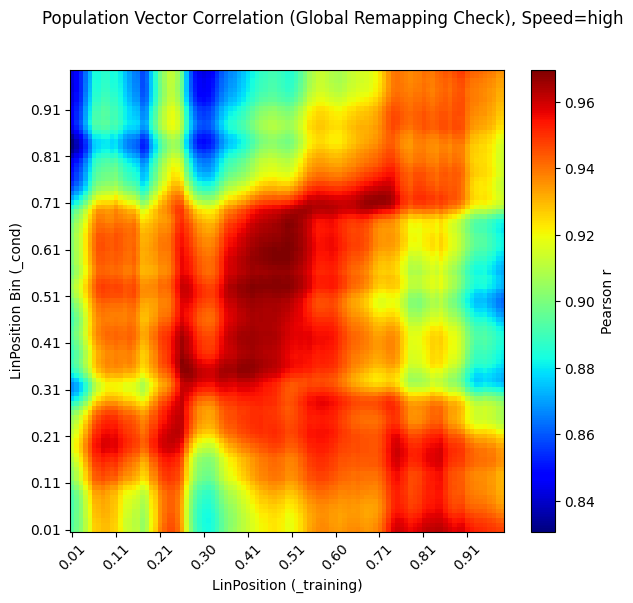

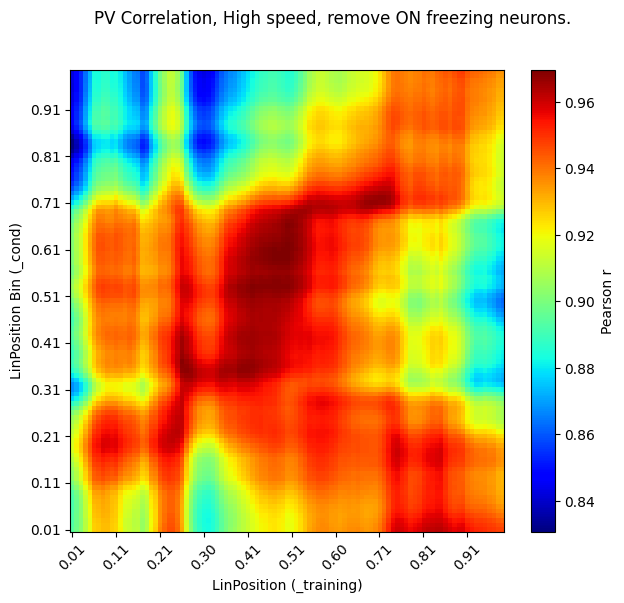

In [180]:
fig = Mouse_Results.plot_pv_correlation("_training", "_cond", use_speed_filter = True, remove_neurons = on_neurons_freezing)
fig.suptitle("PV Correlation, High speed, remove ON freezing neurons.")
fig

using speed filter: True
Using training epochs for linear tuning curve calculation.
using speed filter: True
Using cond epochs for linear tuning curve calculation.


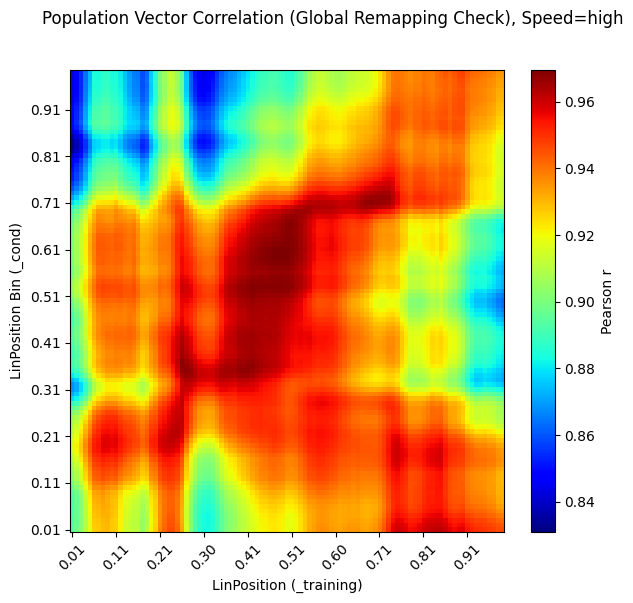

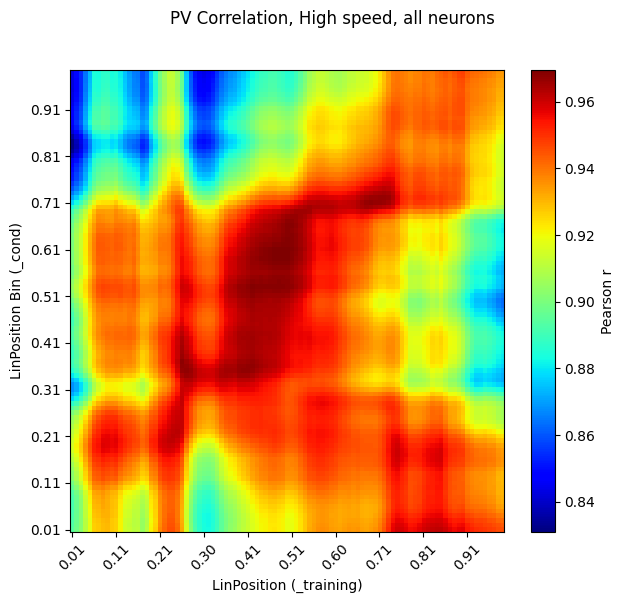

In [177]:
fig = Mouse_Results.plot_pv_correlation("_training", "_cond", use_speed_filter = True)
fig.suptitle("PV Correlation, High speed, all neurons")
fig

using speed filter: True
Using training epochs for linear tuning curve calculation.
using speed filter: True
Using cond epochs for linear tuning curve calculation.


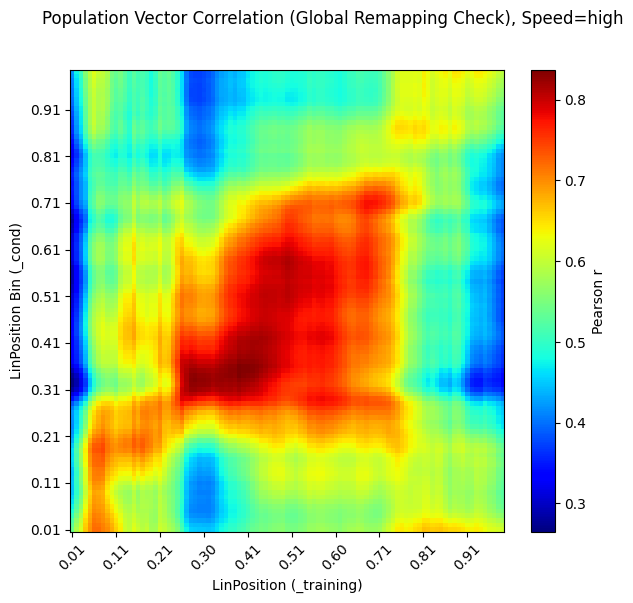

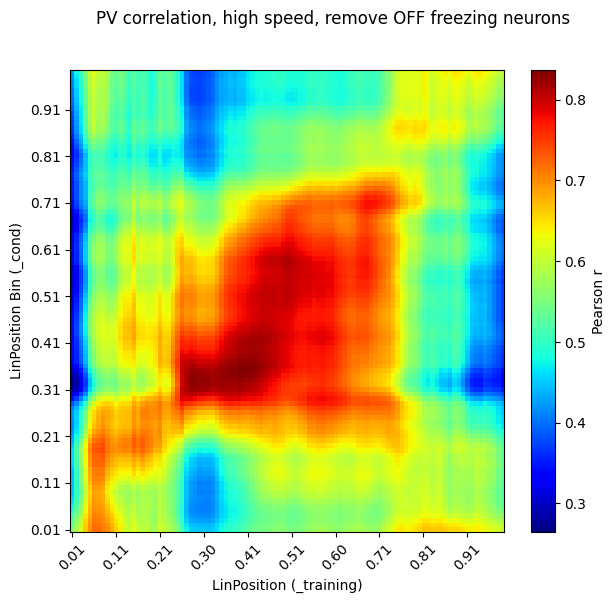

In [179]:
fig = Mouse_Results.plot_pv_correlation("_training", "_cond", use_speed_filter = True, remove_neurons = off_neurons_freezing)
fig.suptitle("PV correlation, high speed, remove OFF freezing neurons")
fig

using speed filter: True
Using pre epochs for linear tuning curve calculation.
using speed filter: True
Using cond epochs for linear tuning curve calculation.


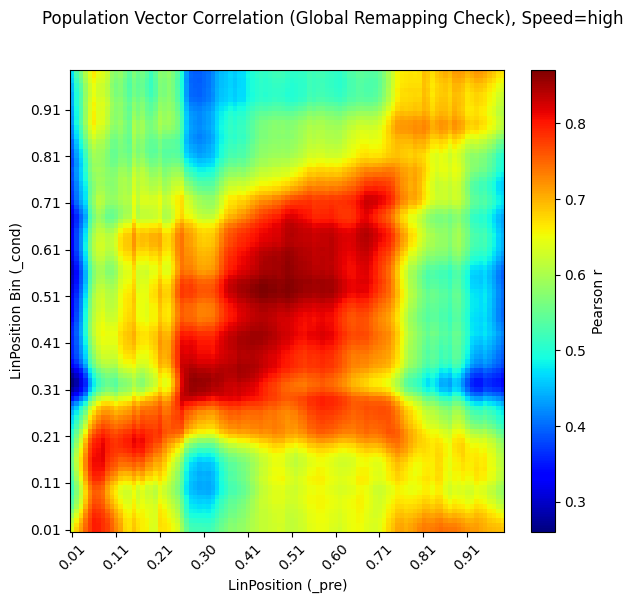

In [169]:
Mouse_Results.plot_pv_correlation("_pre", "_cond", use_speed_filter = True, remove_neurons = np.concatenate([on_neurons_freezing, off_neurons_freezing]))

## Analyse spike data during shocks

In [112]:
import pynapple as nap

stim_ts = nap.Ts(t = Mouse_Results.DataHelper.fullBehavior["Times"]["start_stim"].flatten())
spike_group = Mouse_Results.DataHelper.get_spike_data()
cond_epoch = nap.IntervalSet(Mouse_Results.cond)
bin_size = 0.05

all_frs = spikes.count(bin_size) / bin_size
all_frs_smooth = all_frs.smooth(0.02)
eta = nap.compute_event_triggered_average(all_frs_smooth.restrict(cond_epoch), stim_ts, bin_size, window=(-2, 2))

In [113]:
mean_fr = np.mean(all_frs_smooth.restrict(cond_epoch), axis = 0, keepdims = True)
std_fr = np.std(all_frs_smooth.restrict(cond_epoch), axis = 0, keepdims = True)

In [114]:
matrix = eta.values.reshape(-1, eta.values.shape[-1]).T
times = eta.times()
stim_reaction = (times > 0.3)
before_stim = (times < -0.07)
stim_epoch = nap.IntervalSet(
    [t - 0.07, t + 0.3] for t in stim_ts.t
)
mean_fr = np.mean(all_frs_smooth.restrict(cond_epoch.set_diff(stim_epoch)), axis = 0, keepdims = True).T
std_fr = np.std(all_frs_smooth.restrict(cond_epoch.set_diff(stim_epoch)), axis = 0, keepdims = True).T
zscored = (matrix - mean_fr) / std_fr
zscored[np.std(matrix[:, before_stim], axis = 1) == 0] = np.nan
mean_reaction = zscored[:, stim_reaction].mean(axis=1)
sort_map = np.argsort(mean_reaction)
sorted_matrix = zscored[sort_map]
sorted_matrix[np.isinf(sorted_matrix)] = np.nan

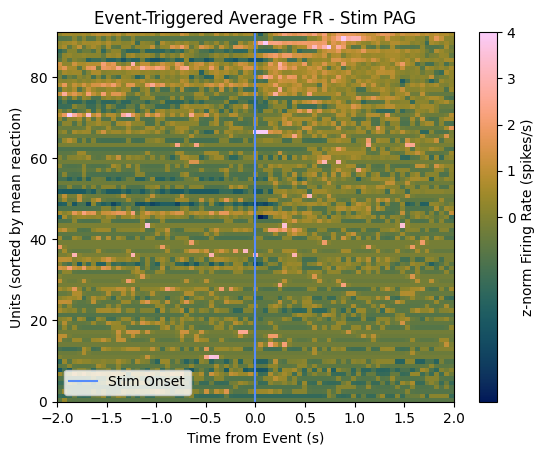

In [115]:
isnan_or_inf = np.isnan(sorted_matrix).all(axis = 1)
is_too_small = np.sum(matrix == 0, axis = 1) > matrix.shape[1] // 4
to_remove = isnan_or_inf

from matplotlib.colors import Normalize, TwoSlopeNorm
plt.figure()
plt.imshow(sorted_matrix[~to_remove], origin = "lower", aspect='auto', extent=[times[0], times[-1], 0, sorted_matrix.shape[0]],
           cmap = "cmc.batlow", norm = TwoSlopeNorm(vcenter = 0, vmax = 4))
plt.colorbar(label='z-norm Firing Rate (spikes/s)')
plt.xlabel('Time from Event (s)')
plt.ylabel('Units (sorted by mean reaction)')
plt.title('Event-Triggered Average FR - Stim PAG')
plt.axvline(0,label = "Stim Onset")
plt.legend(loc = "lower left")
plt.savefig(os.path.join(main_dir, "spike_dat_ON_STIM_PAG.png"))
plt.savefig(os.path.join(main_dir, "spike_dat_ON_STIM_PAG.svg"))

plt.show()

In [116]:
off_neurons_stim = sort_map[:10]
on_neurons_stim = sort_map[-10:]
neutral_neurons_stim = sort_map[20:-20]

off_shock = sorted_matrix[:10]
on_shock = sorted_matrix[-10:]
neutral_shock = sorted_matrix[20:-20]

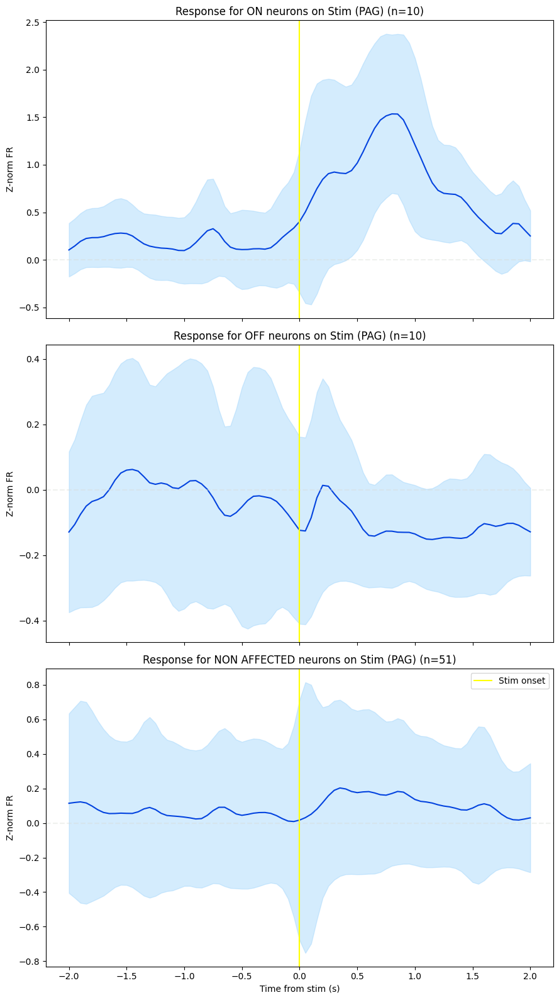

In [117]:
from scipy.ndimage import gaussian_filter

fig, axs = plt.subplots(3, sharex = True, figsize=(9,16))
axs = axs.flatten()
sigma = 1.5
times = eta.times()
for i, (response, status) in enumerate(zip([on_shock, off_shock, neutral_shock], ["on", "off", "non affected"])):
    mean = gaussian_filter(np.nanmean(response, axis=0), sigma = sigma)
    std = gaussian_filter(np.nanstd(response, axis=0), sigma = sigma)

    # first, plot individual traces in light grey
    # for resp in response:
    #     axs[i].plot(times, resp, color = "xkcd:light grey", alpha = 0.4)
    axs[i].plot(times, mean, color = "xkcd:blue")
    axs[i].fill_between(times, mean - 1*std, mean + 1*std, color = "xkcd:light blue", alpha = 0.4)
    axs[i].set_title(f"Response for {status.upper()} neurons on Stim (PAG) (n={response.shape[0]})")
    axs[i].axvline(0, label = "Stim onset", color = "yellow")
    axs[i].set_ylabel("Z-norm FR")
    axs[i].axhline(0, linestyle = "--", color = "xkcd:light grey", alpha = 0.4)

axs[-1].legend()
axs[-1].set_xlabel("Time from stim (s)")
fig.tight_layout()
plt.show()


### SHOCK cells and remapping

In [31]:
response_full = nap.compute_perievent(all_frs_smooth.restrict(cond_epoch), stim_ts, window=(-2, 2), epochs = cond_epoch)

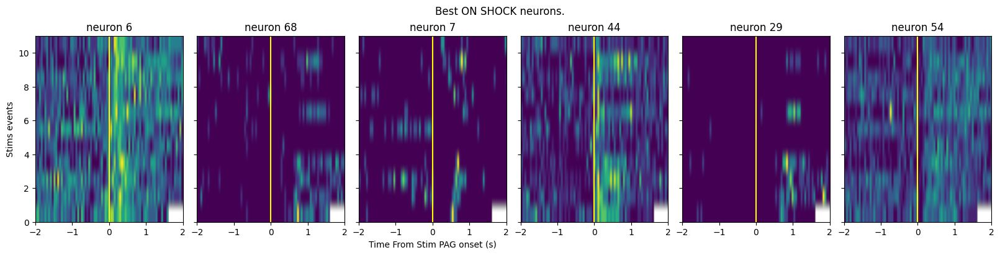

In [32]:
on_neurons_stim = on_neurons_stim[:6]
fig, axs = plt.subplots(1, len(on_neurons_stim), sharex = True, sharey = True, figsize = (16,4), constrained_layout = True)
axs = axs.ravel()
full_resp = response_full.values
for i, neuron in enumerate(on_neurons_stim):
    axs[i].imshow(full_resp[:,:,neuron].T, extent = (- 2, 2, 0, full_resp.shape[1]), aspect = "auto")
    axs[i].set_title(f"neuron {neuron}")
    axs[i].axvline(0, label = "Stim onset", color = "yellow")
axs[i//2].set_xlabel("Time From Stim PAG onset (s)")
axs[0].set_ylabel("Stims events")
fig.suptitle("Best ON SHOCK neurons.")
plt.show()

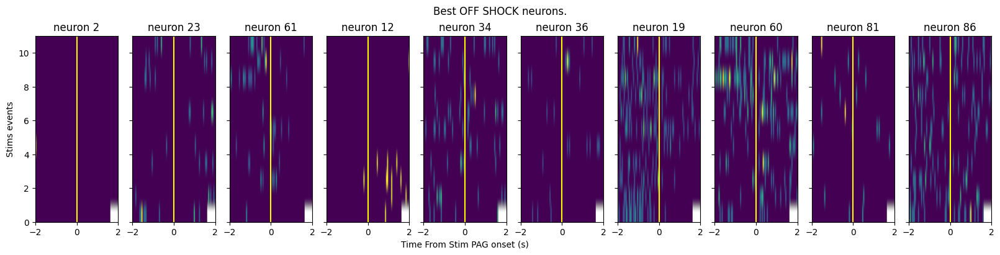

In [33]:
fig, axs = plt.subplots(1, len(off_neurons_stim), sharex = True, sharey = True, figsize = (16,4), constrained_layout = True)
axs = axs.ravel()
full_resp = response_full.values
for i, neuron in enumerate(off_neurons_stim):
    axs[i].imshow(full_resp[:,:,neuron].T, extent = (- 2, 2, 0, full_resp.shape[1]), aspect = "auto")
    axs[i].set_title(f"neuron {neuron}")
    axs[i].axvline(0, label = "Stim onset", color = "yellow")
axs[i//2].set_xlabel("Time From Stim PAG onset (s)")
axs[0].set_ylabel("Stims events")
fig.suptitle("Best OFF SHOCK neurons.")
plt.show()

In [121]:
on_neurons_stim

array([ 6, 68,  7, 44, 29, 54, 76, 75, 74, 13])

In [122]:
off_neurons_freezing

array([67, 54,  6, 64, 60, 44,  0,  4, 28, 22])

using speed filter: True
Using training epochs for linear tuning curve calculation.
using speed filter: False
Using training epochs for linear tuning curve calculation.
using speed filter: True
Using cond epochs for linear tuning curve calculation.
using speed filter: False
Using cond epochs for linear tuning curve calculation.


/tmp/ipykernel_3933799/184852741.py:31: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


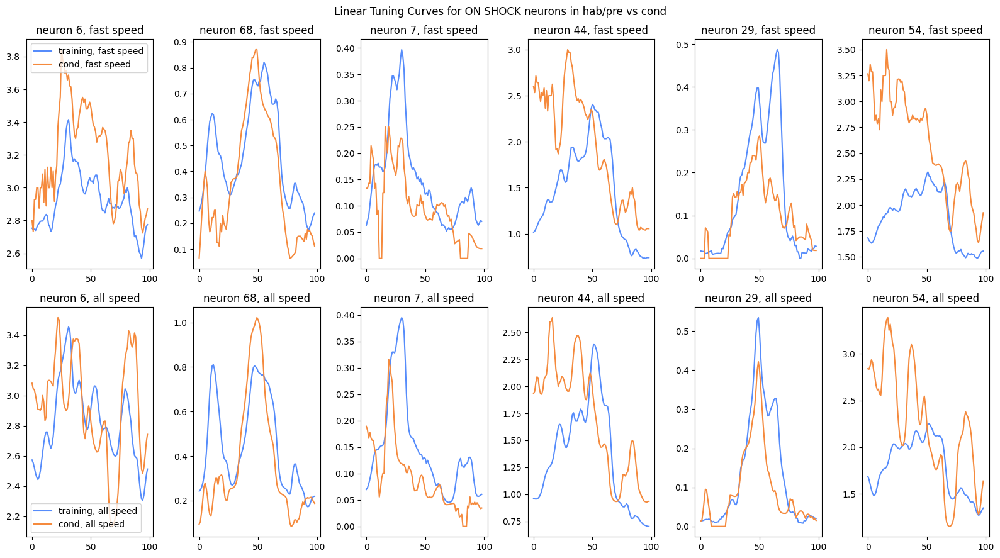

In [106]:
fig, axs = plt.subplots(2, len(on_neurons_stim), figsize = (16,9))
l_function = Mouse_Results.l_function
for p, suffix in enumerate(["_training", "_cond"]):
    lin_place_fields, bin_edges = Mouse_Results.trainerBayes.calculate_linear_tuning_curve(
        suffix = suffix,
        l_function=l_function,
        behaviorData=Mouse_Results.DataHelper.fullBehavior,
        use_speed_filter=True
        )
    for i, neuron in enumerate(on_neurons_stim):
        axs[0, i].plot(lin_place_fields[neuron], label = f"{suffix.strip('_')}, fast speed")
        axs[0, i].set_title(f"neuron {neuron}, fast speed")

    lin_place_fields, bin_edges = Mouse_Results.trainerBayes.calculate_linear_tuning_curve(
        suffix = suffix,
        l_function=l_function,
        behaviorData=Mouse_Results.DataHelper.fullBehavior,
        use_speed_filter=False
        )

    for i, neuron in enumerate(on_neurons_stim):
        axs[1, i].plot(lin_place_fields[neuron], label = f"{suffix.strip('_')}, all speed")
        axs[1, i].set_title(f"neuron {neuron}, all speed")

axs[0, 0].legend(loc = "upper left")
axs[-1, 0].legend(loc = "lower left")
fig.suptitle("Linear Tuning Curves for ON SHOCK neurons in hab/pre vs cond")
fig.tight_layout()
fig.savefig(os.path.join(main_dir, "lt_ON_SHOCK_PAG_stim.png"))
fig.savefig(os.path.join(main_dir, "lt_ON_SHOCK_PAG_stim.png"))
fig.show()

using speed filter: True
Using training epochs for linear tuning curve calculation.
using speed filter: False
Using training epochs for linear tuning curve calculation.
using speed filter: True
Using cond epochs for linear tuning curve calculation.
using speed filter: False
Using cond epochs for linear tuning curve calculation.


/tmp/ipykernel_3933799/609165378.py:31: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


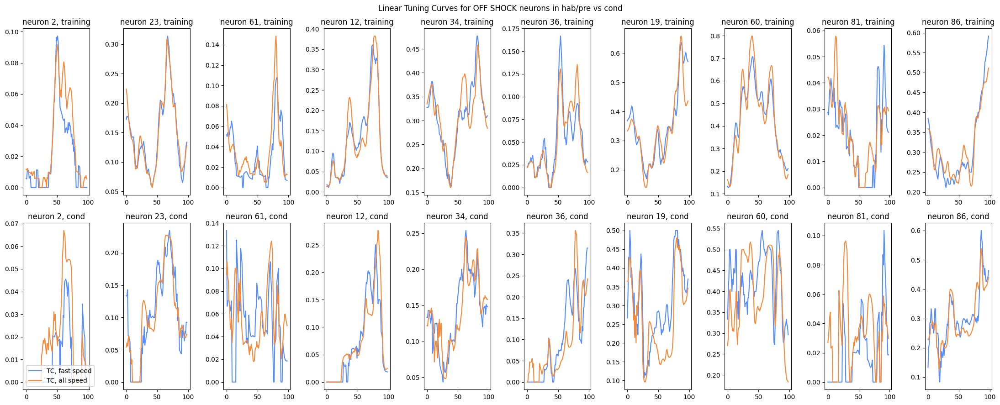

In [110]:
fig, axs = plt.subplots(2, len(off_neurons_stim), figsize = (22,9))
l_function = Mouse_Results.l_function
for p, suffix in enumerate(["_training", "_cond"]):
    lin_place_fields, bin_edges = Mouse_Results.trainerBayes.calculate_linear_tuning_curve(
        suffix = suffix,
        l_function=l_function,
        behaviorData=Mouse_Results.DataHelper.fullBehavior,
        use_speed_filter=True
        )
    for i, neuron in enumerate(off_neurons_stim):
        axs[p, i].plot(lin_place_fields[neuron], label = "TC, fast speed")
        axs[p, i].set_title(f"neuron {neuron}, {suffix.strip('_')}")

    lin_place_fields, bin_edges = Mouse_Results.trainerBayes.calculate_linear_tuning_curve(
        suffix = suffix,
        l_function=l_function,
        behaviorData=Mouse_Results.DataHelper.fullBehavior,
        use_speed_filter=False
        )

    for i, neuron in enumerate(off_neurons_stim):
        axs[p, i].plot(lin_place_fields[neuron], label = "TC, all speed")
        axs[p, i].set_title(f"neuron {neuron}, {suffix.strip('_')}")

axs[-1, 0].legend(loc = "lower left")
fig.suptitle("Linear Tuning Curves for OFF SHOCK neurons in hab/pre vs cond")
fig.tight_layout()
fig.savefig(os.path.join(main_dir, "lt_OFF_SHOCK_PAG_stim.png"))
fig.savefig(os.path.join(main_dir, "lt_OFF_SHOCK_PAG_stim.svg"))

fig.show()

### remove from PV coding

using speed filter: True
Using training epochs for linear tuning curve calculation.
using speed filter: True
Using cond epochs for linear tuning curve calculation.


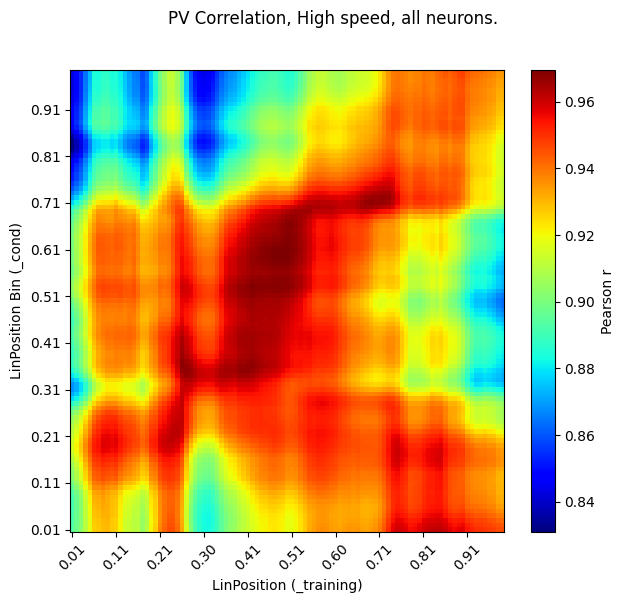

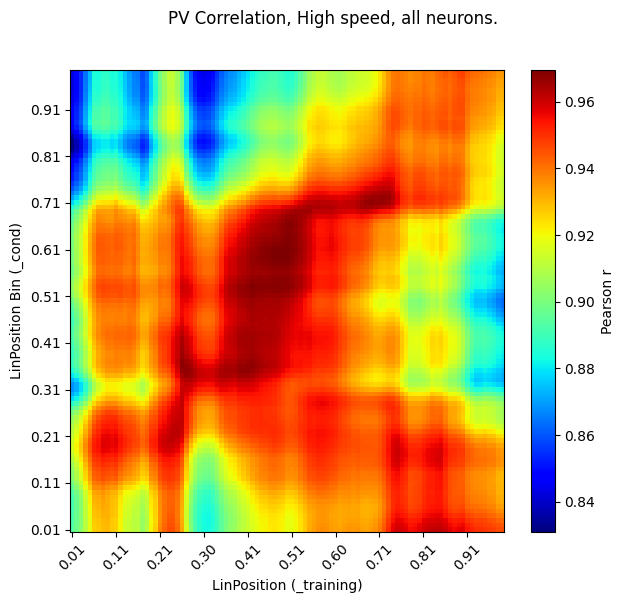

In [224]:
fig = Mouse_Results.plot_pv_correlation("_training", "_cond", use_speed_filter = True, show = False)
fig.suptitle("PV Correlation, High speed, all neurons.")
fig

using speed filter: True
Using training epochs for linear tuning curve calculation.
using speed filter: True
Using cond epochs for linear tuning curve calculation.


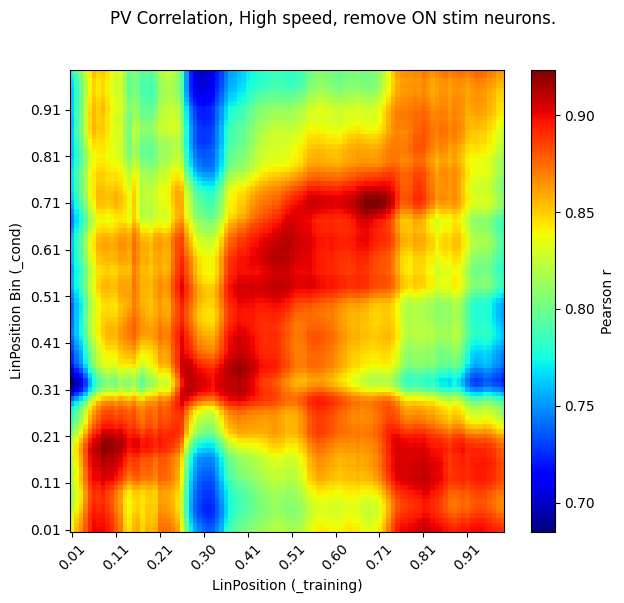

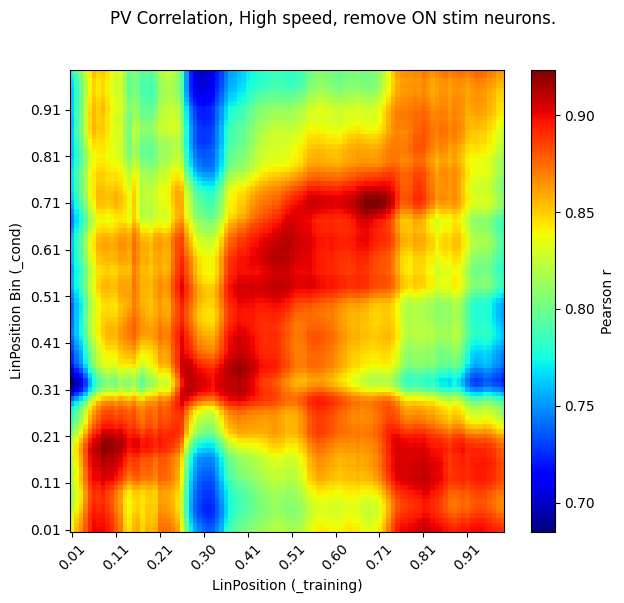

In [225]:
fig = Mouse_Results.plot_pv_correlation("_training", "_cond", use_speed_filter = True, remove_neurons = on_neurons_stim, show = False)
fig.suptitle("PV Correlation, High speed, remove ON stim neurons.")
fig

using speed filter: True
Using training epochs for linear tuning curve calculation.
using speed filter: True
Using cond epochs for linear tuning curve calculation.


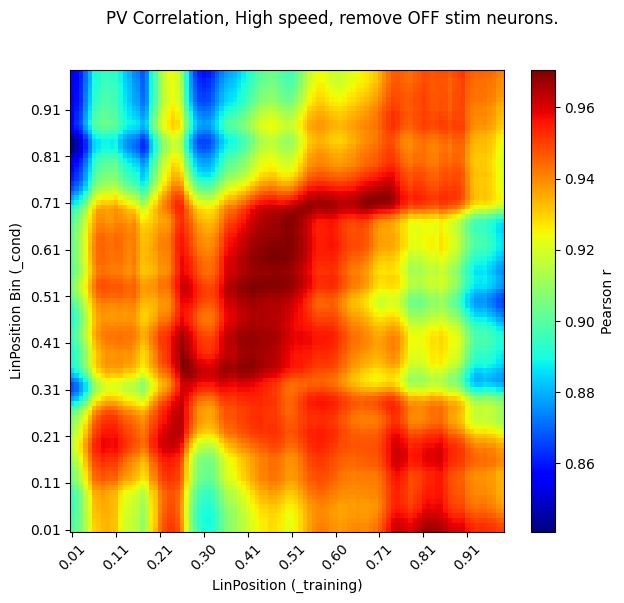

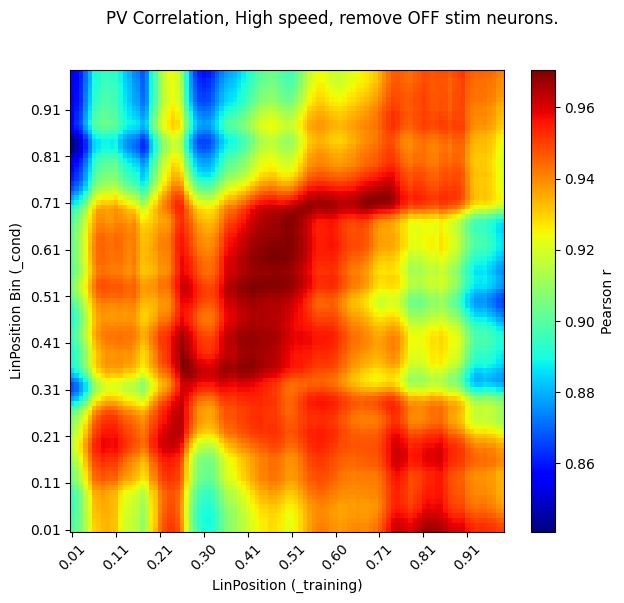

In [226]:
fig = Mouse_Results.plot_pv_correlation("_training", "_cond", use_speed_filter = True, remove_neurons = off_neurons_stim, show = False)
fig.suptitle("PV Correlation, High speed, remove OFF stim neurons.")
fig

using speed filter: True
Using training epochs for linear tuning curve calculation.
using speed filter: True
Using cond epochs for linear tuning curve calculation.


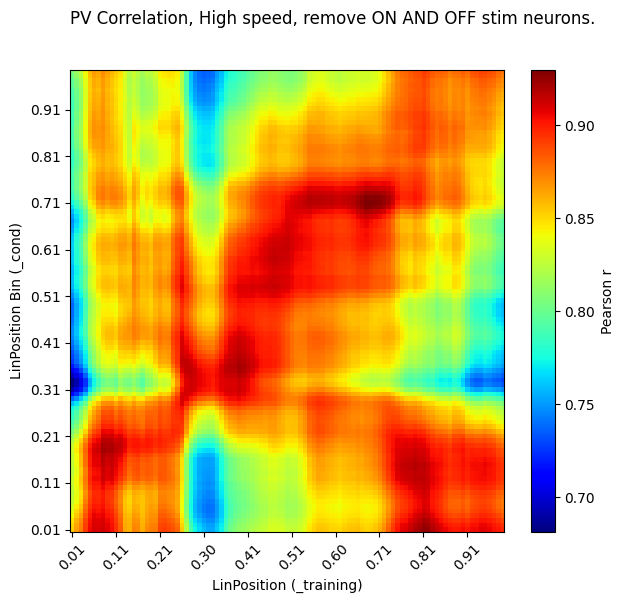

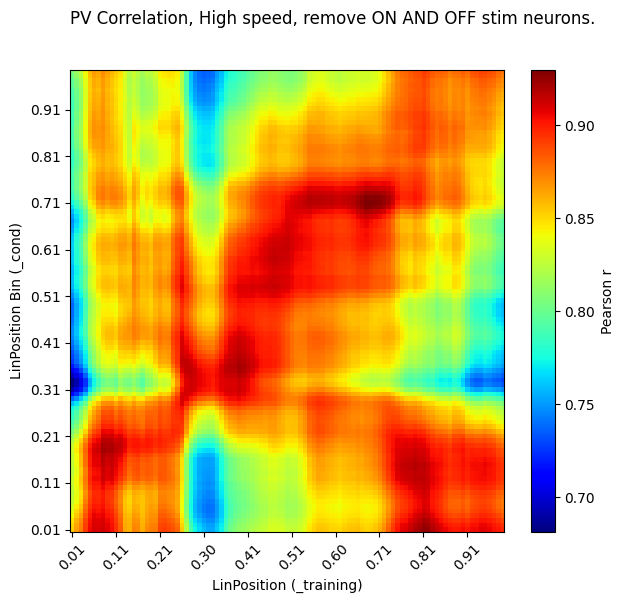

In [227]:
fig = Mouse_Results.plot_pv_correlation("_training", "_cond", use_speed_filter = True, remove_neurons = np.concatenate([on_neurons_stim, off_neurons_stim]), show = False)
fig.suptitle("PV Correlation, High speed, remove ON AND OFF stim neurons.")
fig

## Analyse spike data during ripples

In [44]:
import pynapple as nap

In [45]:
spike_group = Mouse_Results.DataHelper.get_spike_data()

In [46]:
spikes = spike_group
ripples_ts = nap.Ts(t = Mouse_Results.fullBehavior["Times"]["tRipples"])
cond_epoch = nap.IntervalSet(Mouse_Results.cond)

In [47]:
window = (-0.5, 0.5)

In [48]:
peth = nap.compute_perievent(data = spikes.restrict(cond_epoch), events = ripples_ts, window = window)

In [49]:
peth

{0: Index    rate    events
 -------  ------  --------
 0        19.0    13281.56
 1        18.0    13290.3
 2        21.0    13291.44
 3        13.0    13303.98
 4        13.0    13308.87
 5        10.0    13309.51
 6        8.0     13309.86
 ...      ...     ...
 413      11.0    15089.57
 414      9.0     15093.02
 415      11.0    15100.86
 416      9.0     15119.45
 417      6.0     15182.45
 418      11.0    15184.57
 419      12.0    15184.62,
 1: Index    rate    events
 -------  ------  --------
 0        0.0     13281.56
 1        0.0     13290.3
 2        0.0     13291.44
 3        0.0     13303.98
 4        1.0     13308.87
 5        1.0     13309.51
 6        1.0     13309.86
 ...      ...     ...
 413      0.0     15089.57
 414      0.0     15093.02
 415      0.0     15100.86
 416      0.0     15119.45
 417      0.0     15182.45
 418      0.0     15184.57
 419      0.0     15184.62,
 2: Index    rate    events
 -------  ------  --------
 0        0.0     13281.56
 1      

In [50]:
def plot_peth(unit_peth, unit_peth_counts, ax_mean, ax_spikes, color=None):
    mean = np.mean(unit_peth_counts / bin_size, axis=1)
    ax_mean.plot(mean, color=color)
    ax_mean.set_ylabel("spikes/s")
    ax_mean.axvline(0.0, color="gray", linestyle="--")
    ax_spikes.plot(unit_peth.to_tsd(), "|", markersize=5, color=color)
    ax_mean.set_xlabel("time from event (s)")
    ax_spikes.set_ylabel("event")
    ax_spikes.axvline(0.0, color="gray", linestyle="--")

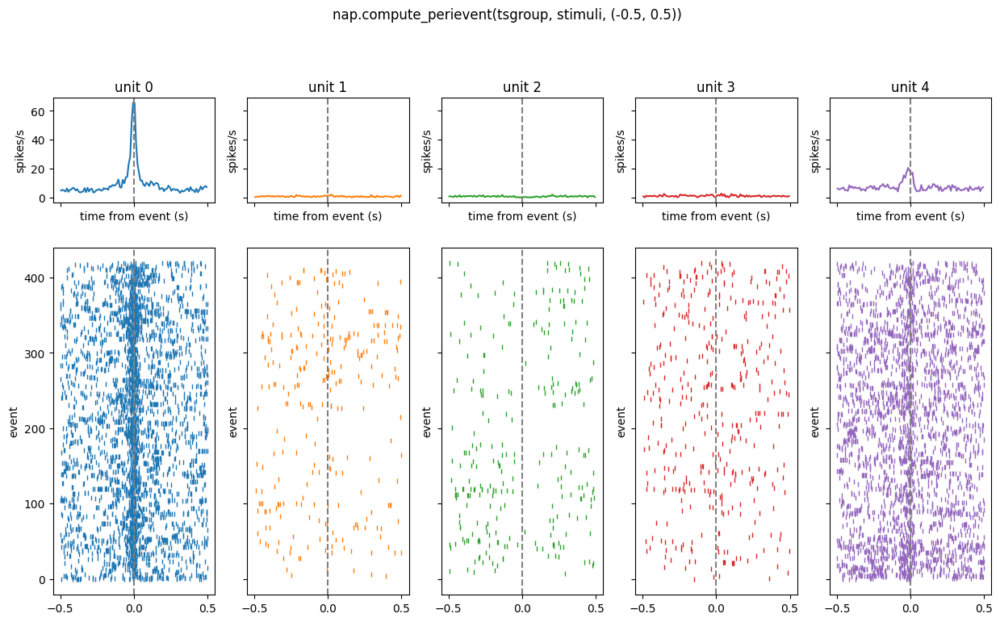

In [51]:
fig, axs = plt.subplots(
    2,
    min(len(spikes), 5),  # Limit to 5 units for visualization
    sharey="row",
    sharex=True,
    height_ratios=[0.3, 1.0],
    figsize=(15, 8),
)
bin_size = 0.01
fig.suptitle("nap.compute_perievent(tsgroup, stimuli, (-0.5, 0.5))", y=1.02)
for i, (unit, unit_axs) in enumerate(zip(spikes, axs.T)):
    if i >= 5:  # Limit to 5 units for visualization
        break
    plot_peth(peth[unit], peth[unit].count(bin_size), *unit_axs, color=plt.cm.tab10(i))
    unit_axs[0].set_title(f"unit {unit}")

In [52]:
pre_ts = nap.IntervalSet(Mouse_Results.pre)
cond_ts = nap.IntervalSet(Mouse_Results.cond)

In [53]:
all_frs = spikes.count(bin_size) / bin_size

In [54]:
eta = nap.compute_event_triggered_average(all_frs.restrict(cond_ts), ripples_ts, bin_size, window=(-2, 2))

In [55]:
matrix = eta.values.reshape(-1, eta.values.shape[-1]).T
times = eta.times()
ripples_reaction = (times >= -0.05)
before_ripples = (times < -0.05)
zscored = (matrix - np.mean(matrix[:, before_ripples], axis = 1, keepdims = True)) / np.std(matrix[:, before_ripples], axis = 1, keepdims = True)
mean_reaction = zscored[:, ripples_reaction].mean(axis=1)
sort_map = np.argsort(mean_reaction)
sorted_matrix = zscored[sort_map]

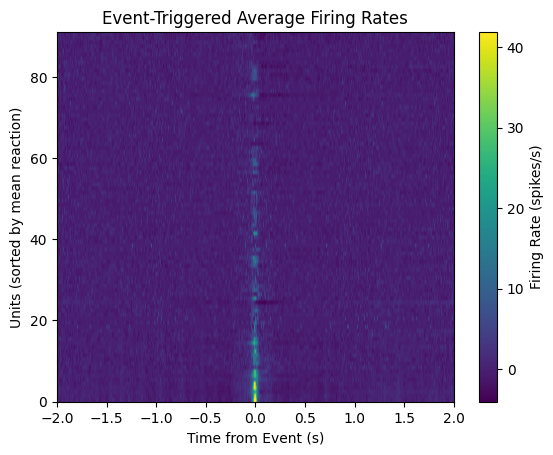

In [56]:
plt.figure()
plt.imshow(sorted_matrix, aspect='auto', extent=[times[0], times[-1], 0, sorted_matrix.shape[0]])
plt.colorbar(label='Firing Rate (spikes/s)')
plt.xlabel('Time from Event (s)')
plt.ylabel('Units (sorted by mean reaction)')
plt.title('Event-Triggered Average Firing Rates')
plt.show()

In [57]:
import pynapple as nap
ripples_cond = nap.Ts(Mouse_Results.DataHelper.tRipples).restrict(nap.IntervalSet(Mouse_Results.cond))
ripples_interval = nap.IntervalSet(ripples_cond.t - 0.05, ripples_cond.t + 0.05)

/tmp/ipykernel_3933799/29601030.py:3: UserWarning: Some starts precede the previous end. Joining them!
  ripples_interval = nap.IntervalSet(ripples_cond.t - 0.05, ripples_cond.t + 0.05)


In [58]:
logits_tsd = nap.TsdTensor(d = Mouse_Results.resultsNN_phase_pkl["_cond"]["logits_hw"][0], t = Mouse_Results.resultsNN_phase_pkl["_cond"]["times"][0])
true_pos_tsd = nap.TsdFrame(d = Mouse_Results.resultsNN_phase_pkl["_cond"]["featureTrue"][0][:,:2], t = Mouse_Results.resultsNN_phase_pkl["_cond"]["times"][0])
pred_pos_tsd = (nap.TsdFrame(d = Mouse_Results.resultsNN_phase_pkl["_cond"]["featurePred"][0][:,:2], t = Mouse_Results.resultsNN_phase_pkl["_cond"]["times"][0]))
entropy_tsd = nap.Tsd(d = Mouse_Results.resultsNN_phase_pkl["_cond"]["Hn"][0], t = Mouse_Results.resultsNN_phase_pkl["_cond"]["times"][0])

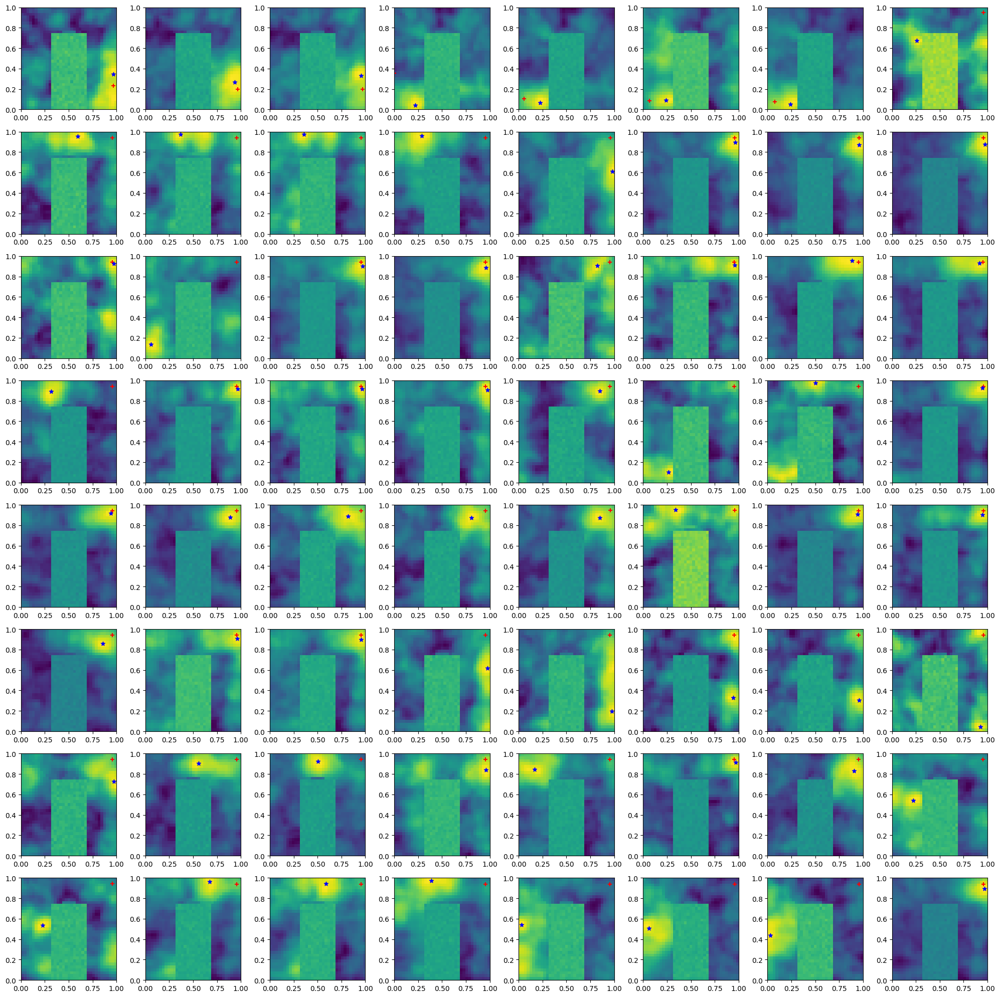

In [59]:
fig, axs = plt.subplots(8,8, figsize = (20,20))
axs = axs.flatten()
for i, (log_event, true_pos, pred_pos) in enumerate(zip(logits_tsd.restrict(ripples_interval), true_pos_tsd.restrict(ripples_interval), pred_pos_tsd.restrict(ripples_interval))):
    if i >= 64 :
        break
    axs[i].imshow(log_event , origin = "lower", aspect = "auto", extent = (0, 1, 0, 1))
    x_true, y_true = true_pos
    x_pred, y_pred = pred_pos
    axs[i].scatter(x_true, y_true, color = "red", marker = "+")
    axs[i].scatter(x_pred, y_pred, color = "blue", marker = "*")

fig.tight_layout()
plt.show()

In [60]:
idx_rip_continous_safe = 5 * 8 + 4
idx_rip_continuous_shock = 60
idx_rip_blob_shock = 3 * 8

In [62]:
main_dir = os.path.realpath("/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Figures/Pres180526")

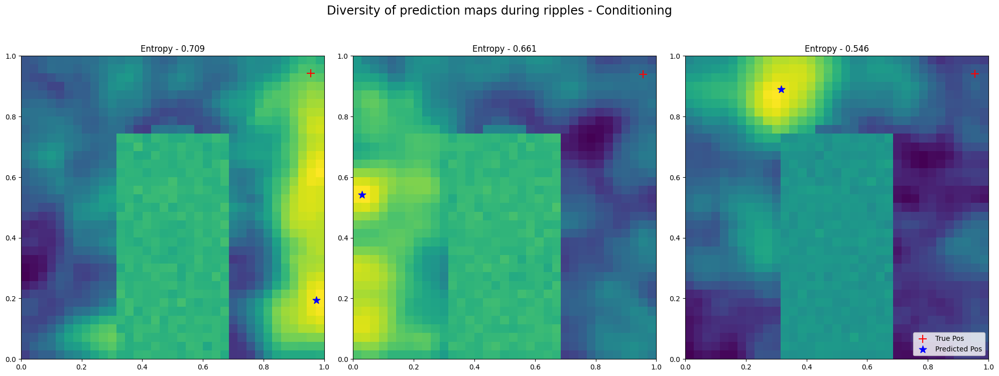

In [68]:
fig, axs = plt.subplots(1,3, figsize = (20,8))
axs = axs.flatten()
for i, idx in enumerate([idx_rip_continous_safe, idx_rip_continuous_shock, idx_rip_blob_shock]):
    axs[i].imshow(logits_tsd.restrict(ripples_interval).values[idx], origin ="lower", aspect ="equal", extent = (0, 1, 0, 1))
    x_true, y_true = true_pos_tsd.restrict(ripples_interval).values[idx]
    x_pred, y_pred = pred_pos_tsd.restrict(ripples_interval).values[idx]
    entropy_at_time = entropy_tsd.restrict(ripples_interval).values[idx]
    axs[i].scatter(x_true, y_true, color = "red", marker = "+", s = 120, label = "True Pos")
    axs[i].scatter(x_pred, y_pred, color = "blue", marker = "*", s= 120, label = "Predicted Pos")
    axs[i].set_title(f"Entropy - {entropy_at_time:.3f}")
fig.suptitle("Diversity of prediction maps during ripples - Conditioning", fontsize = "xx-large")
axs[-1].legend(loc = 'lower right')
fig.tight_layout()
plt.savefig(os.path.join(main_dir, "example_ripples_entropy.png"))
plt.savefig(os.path.join(main_dir, "example_ripples_entropy.svg"))
plt.show()

In [620]:
time_at_ripp = true_pos_tsd.restrict(ripples_interval).t[60]

In [621]:
spikes = Mouse_Results.DataHelper.get_spike_data()

In [622]:
spike_idx = spikes.to_tsd()

In [623]:
time_at_ripp

np.float64(13327.986328125)

In [624]:
spike_idx.get_slice(time_at_ripp)

slice(np.int64(2968576), np.int64(2968577), None)

In [625]:
spike_idx[2968576]

np.float64(55.0)

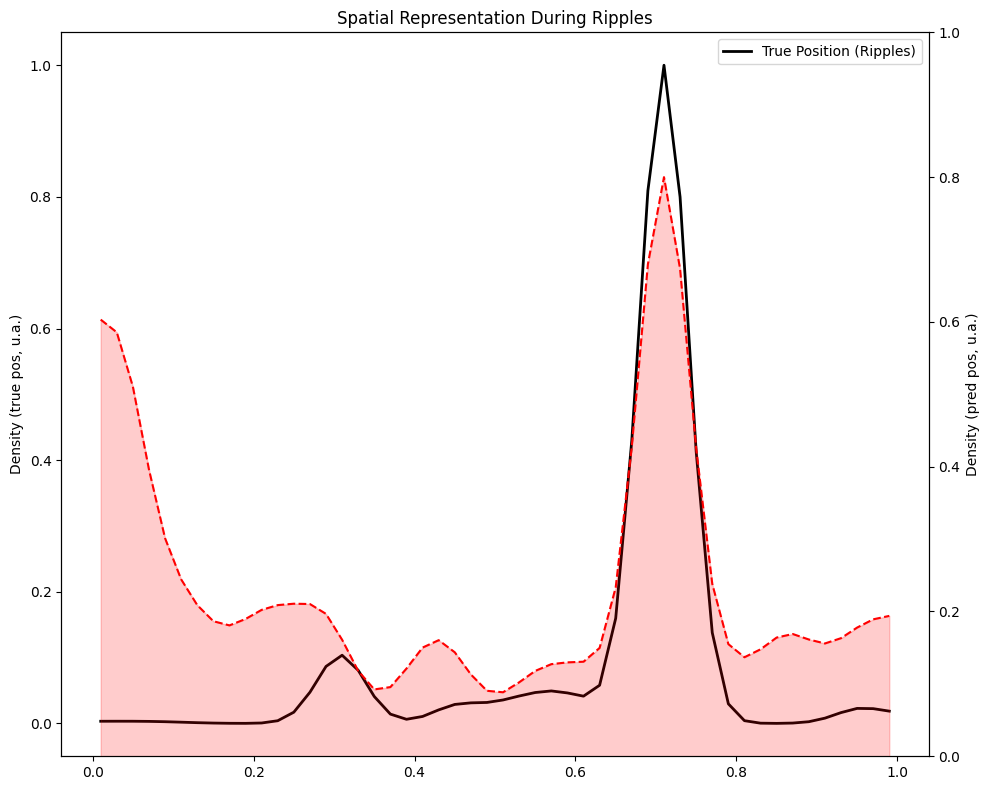

In [626]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from neuroencoders.importData.epochs_management import inEpochsMask

def get_1d_tuning_curve(positions, mask_indices, bins=50, sigma=1.5):
    """
    Generates a smoothed 1D density curve.
    Returns: (density_values, bin_centers)
    """
    # Filter data by mask (e.g., is_freeze)
    masked_data = positions[mask_indices]

    # Calculate histogram
    counts, bin_edges = np.histogram(masked_data, bins=bins, range=(0, 1))
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    # Smooth the curve
    density = gaussian_filter1d(counts.astype(float), sigma=sigma)

    # Optional: Normalize to unit area or max (unit area is better for probability)
    if np.sum(density) > 0:
        density /= np.sum(density)

    return density, bin_centers

true_pre = Mouse_Results.resultsNN_phase["_pre"]["linearTrue"][0]
predictions_pre = Mouse_Results.resultsNN_phase["_pre"]["linearPred"][0]
speedMask_pre = Mouse_Results.resultsNN_phase["_pre"]["speedMask"][0]
true_cond = Mouse_Results.resultsNN_phase["_cond"]["linearTrue"][0]
predictions_cond = Mouse_Results.resultsNN_phase["_cond"]["linearPred"][0]
time_decoding_cond = Mouse_Results.resultsNN_phase["_cond"]["times"][0]

ripples_epochs = Mouse_Results.DataHelper.get_ripples_epochs(0.01, 0.5)
is_ripples = inEpochsMask(time_decoding_cond, ripples_epochs)

# --- 1. Compute Baselines (Pre-phase or Non-Freezing) ---
# We use this to see what 'normal' behavior looks like
pre_true_dens, centers = get_1d_tuning_curve(true_pre, np.ones(len(true_pre), dtype=bool))
pre_pred_dens, _       = get_1d_tuning_curve(predictions_pre, np.ones(len(predictions_pre), dtype=bool))

# --- 2. Compute Ripples Curves (Cond-phase) ---
ripples_true_dens, _    = get_1d_tuning_curve(true_cond, is_ripples)
ripples_pred_dens, _    = get_1d_tuning_curve(predictions_cond, is_ripples)

# --- 3. Visualization ---
fig, ax1 = plt.subplots(1, 1, figsize=(10, 8), sharex=True)

# Plot A: True vs Predicted during Freezing
ripples_true_dens_norm = ripples_true_dens / np.nanmax(ripples_true_dens)
ax1.plot(centers, ripples_true_dens_norm, label='True Position (Ripples)', color='black', lw=2)
ax1bis = ax1.twinx()
ripples_pred_dens_norm = 0.8 * ripples_pred_dens / np.nanmax(ripples_pred_dens)
ax1bis.plot(centers, ripples_pred_dens_norm, label='Predicted Position (Ripples)', color='red', linestyle='--')
ax1bis.fill_between(centers, ripples_pred_dens_norm, alpha=0.2, color='red')
ax1.set_title('Spatial Representation During Ripples')
ax1.set_ylabel('Density (true pos, u.a.)')
ax1bis.set_ylabel('Density (pred pos, u.a.)')
ax1bis.set_ylim(0,1)
ax1.legend()

# # Plot B: The Deviation (Bias)
# # Deviation = (Predicted - True). Positive means decoder over-represents that location.
# bias = ripples_pred_dens - ripples_true_dens
# ax2.bar(centers, bias, width=(centers[1]-centers[0]), color='purple', alpha=0.6)
# ax2.axhline(0, color='grey', lw=1)
# ax2.set_title('Prediction Bias (Pred - True) during Ripples')
# ax2.set_xlabel('Linearized Position (0-1)')
# ax2.set_ylabel('Bias Delta')

plt.tight_layout()
plt.show()

## Analyse freezing reactivations

In [268]:
from neuroencoders.importData.epochs_management import inEpochsMask

In [269]:
freeze_epochs = Mouse_Results.get_freeze_epochs()

In [270]:
time_decoding_cond = Mouse_Results.resultsNN_phase_pkl["_cond"]["times"][0]
predictions_cond = Mouse_Results.resultsNN_phase_pkl["_cond"]["linearPred"][0]
true_cond = Mouse_Results.resultsNN_phase_pkl["_cond"]["linearTrue"][0]
prediction_heatmap = Mouse_Results.resultsNN_phase_pkl["_cond"]["logits_hw"][0]
is_freeze = inEpochsMask(time_decoding_cond, freeze_epochs)
PosMat = Mouse_Results.fullBehavior["Times"]["PosMat"]
PosMatStimMask = PosMat[:, 3] == 1
stims_positions = Mouse_Results.fullBehavior["Positions"][PosMatStimMask, :2]

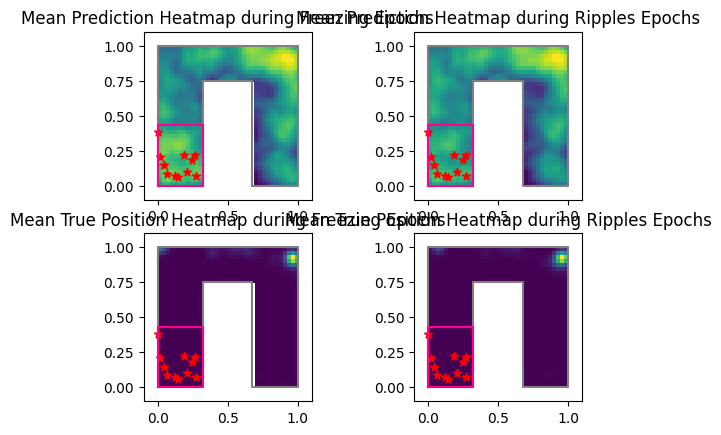

In [271]:
from neuroencoders.utils.global_classes import MAZE_COORDS, ZONEDEF, ZONELABELS, SpatialConstraintsMixin
from neuroencoders.utils.viz_params import SHOCK_COLOR
from scipy.ndimage import gaussian_filter

time_decoding_cond = Mouse_Results.resultsNN_phase_pkl["_cond"]["times"][0]
predictions_cond = Mouse_Results.resultsNN_phase_pkl["_cond"]["featurePred"][0][:,:2]
true_cond = Mouse_Results.resultsNN_phase_pkl["_cond"]["featureTrue"][0][:,:2]
prediction_heatmap = Mouse_Results.resultsNN_phase_pkl["_cond"]["logits_hw"][0]
PosMat = Mouse_Results.fullBehavior["Times"]["PosMat"]
PosMatStimMask = PosMat[:, 3] == 1
stims_positions = Mouse_Results.fullBehavior["Positions"][PosMatStimMask, :2]


freeze_epochs = Mouse_Results.DataHelper.get_freeze_epochs()
is_freeze = inEpochsMask(time_decoding_cond, freeze_epochs)

ripples_epochs = Mouse_Results.DataHelper.get_ripples_epochs(0.1, 0.5)
is_ripples = inEpochsMask(time_decoding_cond, ripples_epochs)

constraint_mixin = SpatialConstraintsMixin(
    grid_size = Mouse_Results.ann.params.GaussianGridSize,
    maze_params = Mouse_Results.Linearizer.maze_params
)

forbidden_mask = constraint_mixin.forbid_mask_np.astype(bool)

fig, axs = plt.subplots(2,2)

mean_heatmap_freeze = prediction_heatmap[is_freeze].mean(axis=0)
mean_heatmap_freeze[forbidden_mask] = np.nan
axs[0,0].imshow(mean_heatmap_freeze, origin = "lower", cmap='viridis', extent = (0,1,0,1))
axs[0,0].plot(constraint_mixin.MAZE_COORDS[:,0], constraint_mixin.MAZE_COORDS[:,1], color='grey')
shock_zone = Mouse_Results.DataHelper.create_zone_polygon_from_borders(
                constraint_mixin.ZONEDEF[ZONELABELS.index("Shock")]
            )
axs[0,0].plot(*shock_zone.exterior.xy, color=SHOCK_COLOR, label='Shock Zone')
axs[0,0].scatter(stims_positions[:,0], stims_positions[:,1], color='red', label='Stim Positions', marker = "*")
axs[0,0].set_title('Mean Prediction Heatmap during Freezing Epochs')
axs[0,0].set_xlim(-0.1,1.1)
axs[0,0].set_ylim(-0.1,1.1)

# same for ripples epochs
mean_heatmap_ripples = prediction_heatmap[is_ripples].mean(axis=0)
mean_heatmap_ripples[forbidden_mask] = np.nan
axs[0,1].imshow(mean_heatmap_ripples, origin = "lower", cmap='viridis', extent = (0,1,0,1))
axs[0,1].plot(constraint_mixin.MAZE_COORDS[:,0], constraint_mixin.MAZE_COORDS[:,1], color='grey')
axs[0,1].plot(*shock_zone.exterior.xy, color=SHOCK_COLOR, label='Shock Zone')
axs[0,1].scatter(stims_positions[:,0], stims_positions[:,1], color='red', label='Stim Positions', marker = "*")
axs[0,1].set_title('Mean Prediction Heatmap during Ripples Epochs')
axs[0,1].set_xlim(-0.1,1.1)
axs[0,1].set_ylim(-0.1,1.1)

# same as above but for true position heatmap during freezing epochs
occupancy, x_edges, y_edges = np.histogram2d(true_cond[is_freeze,0], true_cond[is_freeze,1], bins=prediction_heatmap.shape[1:])
occupancy = occupancy.T
occupancy = gaussian_filter(occupancy, sigma=1)
occupancy[forbidden_mask] = np.nan
max_mean_true_heatmap_freeze = np.nanmax(occupancy)
# renormalize to max of prediction heatmap for better comparison
occupancy = occupancy / max_mean_true_heatmap_freeze
occupancy[forbidden_mask] = np.nan
# apply gaussian filter for better visualization
mean_true_heatmap_freeze = occupancy

axs[1,0].imshow(mean_true_heatmap_freeze, origin = "lower", cmap='viridis', extent = (0,1,0,1))
axs[1,0].plot(constraint_mixin.MAZE_COORDS[:,0], constraint_mixin.MAZE_COORDS[:,1], color='grey')
axs[1,0].plot(*shock_zone.exterior.xy, color=SHOCK_COLOR, label='Shock Zone')
axs[1,0].scatter(stims_positions[:,0], stims_positions[:,1], color='red', label='Stim Positions', marker = "*")
axs[1,0].set_title('Mean True Position Heatmap during Freezing Epochs')
axs[1,0].set_xlim(-0.1,1.1)
axs[1,0].set_ylim(-0.1,1.1)

# same during ripples 
occupancy, x_edges, y_edges = np.histogram2d(true_cond[is_ripples,0], true_cond[is_ripples,1], bins=prediction_heatmap.shape[1:])
occupancy = occupancy.T
occupancy = gaussian_filter(occupancy, sigma=1)
occupancy[forbidden_mask] = np.nan
max_mean_true_heatmap_ripples = np.nanmax(occupancy)
# renormalize to max of prediction heatmap for better comparison
occupancy = occupancy / max_mean_true_heatmap_ripples
occupancy[forbidden_mask] = np.nan
# apply gaussian filter for better visualization
mean_true_heatmap_ripples = occupancy


axs[1,1].imshow(mean_true_heatmap_ripples, origin = "lower", cmap='viridis', extent = (0,1,0,1))
axs[1,1].plot(constraint_mixin.MAZE_COORDS[:,0], constraint_mixin.MAZE_COORDS[:,1], color='grey')
axs[1,1].plot(*shock_zone.exterior.xy, color=SHOCK_COLOR, label='Shock Zone')
axs[1,1].scatter(stims_positions[:,0], stims_positions[:,1], color='red', label='Stim Positions', marker = "*")
axs[1,1].set_title('Mean True Position Heatmap during Ripples Epochs')
axs[1,1].set_xlim(-0.1,1.1)
axs[1,1].set_ylim(-0.1,1.1)


plt.show()

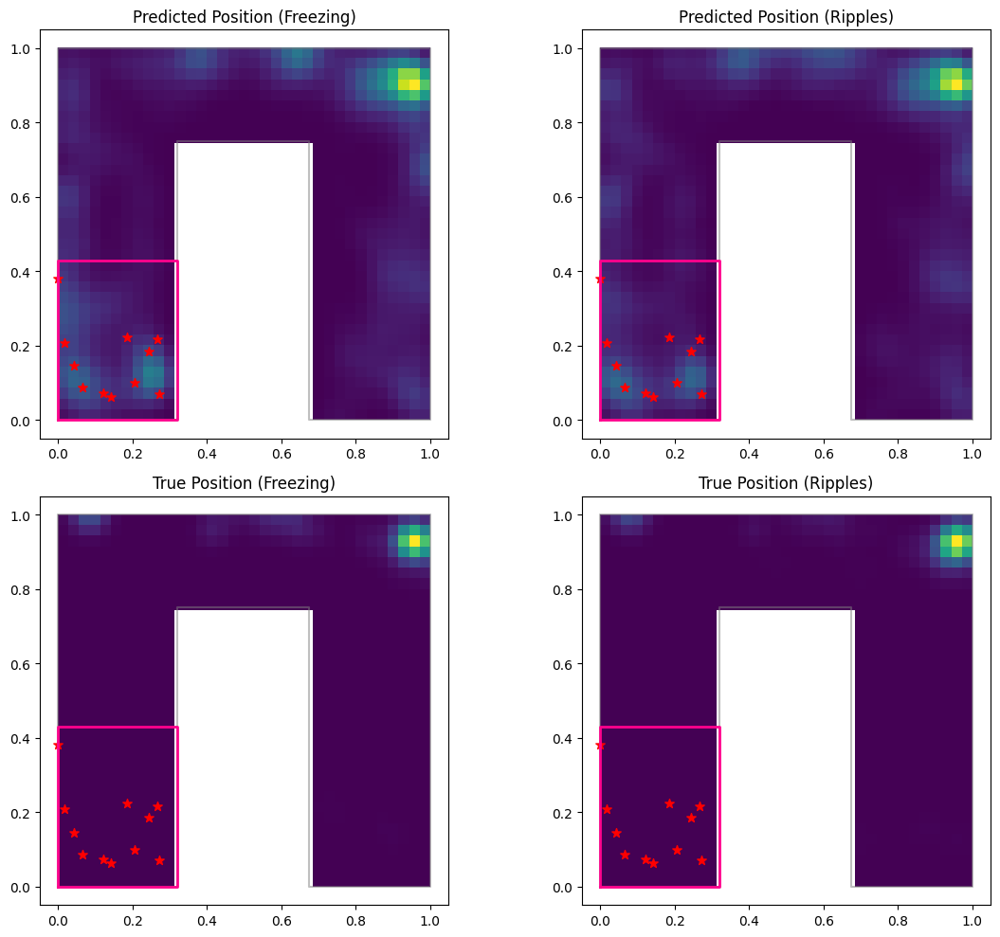

In [272]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# Define a helper to avoid repeating normalization and masking logic
def get_density_heatmap(data, mask_indices, bins, forbidden_mask, sigma=1.0):
    # Use explicit range [[0, 1], [0, 1]] to match the 'extent' in imshow
    heatmap, _, _ = np.histogram2d(data[mask_indices, 0], data[mask_indices, 1], 
                                   bins=bins, range=[[0, 1], [0, 1]])
    
    # 1. Transpose to convert from [X, Y] to [Row, Col] for imshow/mask alignment
    heatmap = heatmap.T 
    
    # 2. Smooth before masking to prevent NaN-leak/edge-erosion
    heatmap = gaussian_filter(heatmap, sigma=sigma)
    
    # 3. Normalize to 0-1 range
    max_val = np.nanmax(heatmap)
    if max_val > 0:
        heatmap /= max_val
        
    # 4. Apply forbidden mask
    heatmap[forbidden_mask] = np.nan
    return heatmap

# Define grid shape from your constraint mixin or existing logits
grid_bins = prediction_heatmap.shape[1:]

fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# --- ROW 0: PREDICTIONS ---
# Now using predictions_cond [time, (x,y)] instead of the mean of logits_hw
axs[0,0].imshow(get_density_heatmap(predictions_cond, is_freeze, grid_bins, forbidden_mask), 
               origin="lower", cmap='viridis', extent=(0,1,0,1))
axs[0,0].set_title('Predicted Position (Freezing)')

axs[0,1].imshow(get_density_heatmap(predictions_cond, is_ripples, grid_bins, forbidden_mask), 
               origin="lower", cmap='viridis', extent=(0,1,0,1))
axs[0,1].set_title('Predicted Position (Ripples)')

# --- ROW 1: TRUE POSITIONS ---
axs[1,0].imshow(get_density_heatmap(true_cond, is_freeze, grid_bins, forbidden_mask), 
               origin="lower", cmap='viridis', extent=(0,1,0,1))
axs[1,0].set_title('True Position (Freezing)')

axs[1,1].imshow(get_density_heatmap(true_cond, is_ripples, grid_bins, forbidden_mask) , 
               origin="lower", cmap='viridis', extent=(0,1,0,1))
axs[1,1].set_title('True Position (Ripples)')

# Common Plotting boilerplate (Overlays)
for ax in axs.flat:
    ax.plot(constraint_mixin.MAZE_COORDS[:,0], constraint_mixin.MAZE_COORDS[:,1], color='grey', alpha=0.5)
    ax.plot(*shock_zone.exterior.xy, color=SHOCK_COLOR, lw=2)
    ax.scatter(stims_positions[:,0], stims_positions[:,1], color='red', marker="*", s=50)
    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(-0.05, 1.05)

plt.tight_layout()
plt.show()

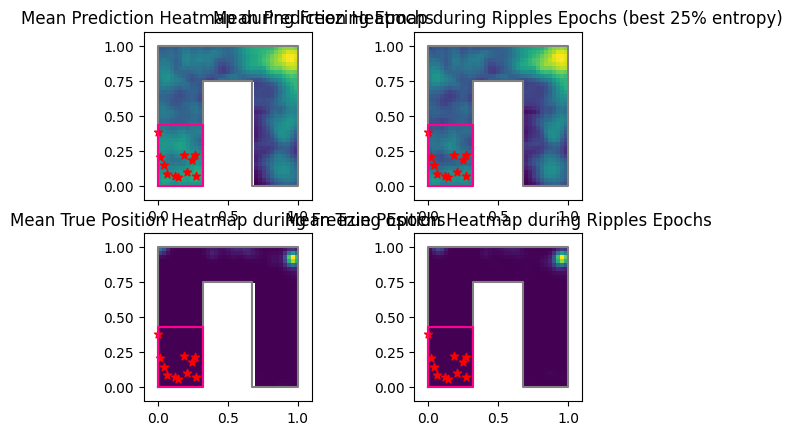

In [273]:
from neuroencoders.utils.global_classes import MAZE_COORDS, ZONEDEF, ZONELABELS, SpatialConstraintsMixin
from neuroencoders.utils.viz_params import SHOCK_COLOR
from scipy.ndimage import gaussian_filter

time_decoding_cond = Mouse_Results.resultsNN_phase_pkl["_cond"]["times"][0]
predictions_cond = Mouse_Results.resultsNN_phase_pkl["_cond"]["featurePred"][0][:,:2]
true_cond = Mouse_Results.resultsNN_phase_pkl["_cond"]["featureTrue"][0][:,:2]
prediction_heatmap = Mouse_Results.resultsNN_phase_pkl["_cond"]["logits_hw"][0]
PosMat = Mouse_Results.fullBehavior["Times"]["PosMat"]
PosMatStimMask = PosMat[:, 3] == 1
stims_positions = Mouse_Results.fullBehavior["Positions"][PosMatStimMask, :2]
entropy = Mouse_Results.resultsNN_phase_pkl["_cond"]["Hn"][0]
thresh_entropy = np.percentile(entropy, 10)  # for example, using the 25th percentile as a threshold
low_entropy_mask = entropy < thresh_entropy


freeze_epochs = Mouse_Results.DataHelper.get_freeze_epochs()
is_freeze = inEpochsMask(time_decoding_cond, freeze_epochs)

ripples_epochs = Mouse_Results.DataHelper.get_ripples_epochs(0.1, 0.5)
is_ripples = inEpochsMask(time_decoding_cond, ripples_epochs)

constraint_mixin = SpatialConstraintsMixin(
    grid_size = Mouse_Results.ann.params.GaussianGridSize,
    maze_params = Mouse_Results.Linearizer.maze_params
)

forbidden_mask = constraint_mixin.forbid_mask_np.astype(bool)

fig, axs = plt.subplots(2,2)

mean_heatmap_freeze = prediction_heatmap[is_freeze & low_entropy_mask].mean(axis=0)
mean_heatmap_freeze[forbidden_mask] = np.nan
axs[0,0].imshow(mean_heatmap_freeze, origin = "lower", cmap='viridis', extent = (0,1,0,1))
axs[0,0].plot(constraint_mixin.MAZE_COORDS[:,0], constraint_mixin.MAZE_COORDS[:,1], color='grey')
shock_zone = Mouse_Results.DataHelper.create_zone_polygon_from_borders(
                constraint_mixin.ZONEDEF[ZONELABELS.index("Shock")]
            )
axs[0,0].plot(*shock_zone.exterior.xy, color=SHOCK_COLOR, label='Shock Zone')
axs[0,0].scatter(stims_positions[:,0], stims_positions[:,1], color='red', label='Stim Positions', marker = "*")
axs[0,0].set_title('Mean Prediction Heatmap during Freezing Epochs')
axs[0,0].set_xlim(-0.1,1.1)
axs[0,0].set_ylim(-0.1,1.1)

# same for ripples epochs
mean_heatmap_ripples = prediction_heatmap[is_ripples & low_entropy_mask].mean(axis=0)
mean_heatmap_ripples[forbidden_mask] = np.nan
axs[0,1].imshow(mean_heatmap_ripples, origin = "lower", cmap='viridis', extent = (0,1,0,1))
axs[0,1].plot(constraint_mixin.MAZE_COORDS[:,0], constraint_mixin.MAZE_COORDS[:,1], color='grey')
axs[0,1].plot(*shock_zone.exterior.xy, color=SHOCK_COLOR, label='Shock Zone')
axs[0,1].scatter(stims_positions[:,0], stims_positions[:,1], color='red', label='Stim Positions', marker = "*")
axs[0,1].set_title('Mean Prediction Heatmap during Ripples Epochs (best 25% entropy)')
axs[0,1].set_xlim(-0.1,1.1)
axs[0,1].set_ylim(-0.1,1.1)

# same as above but for true position heatmap during freezing epochs
occupancy, x_edges, y_edges = np.histogram2d(true_cond[is_freeze,0], true_cond[is_freeze,1], bins=prediction_heatmap.shape[1:])
occupancy = occupancy.T
occupancy = gaussian_filter(occupancy, sigma=1)
occupancy[forbidden_mask] = np.nan
max_mean_true_heatmap_freeze = np.nanmax(occupancy)
# renormalize to max of prediction heatmap for better comparison
occupancy = occupancy / max_mean_true_heatmap_freeze
occupancy[forbidden_mask] = np.nan
# apply gaussian filter for better visualization
mean_true_heatmap_freeze = occupancy

axs[1,0].imshow(mean_true_heatmap_freeze, origin = "lower", cmap='viridis', extent = (0,1,0,1))
axs[1,0].plot(constraint_mixin.MAZE_COORDS[:,0], constraint_mixin.MAZE_COORDS[:,1], color='grey')
axs[1,0].plot(*shock_zone.exterior.xy, color=SHOCK_COLOR, label='Shock Zone')
axs[1,0].scatter(stims_positions[:,0], stims_positions[:,1], color='red', label='Stim Positions', marker = "*")
axs[1,0].set_title('Mean True Position Heatmap during Freezing Epochs')
axs[1,0].set_xlim(-0.1,1.1)
axs[1,0].set_ylim(-0.1,1.1)

# same during ripples 
occupancy, x_edges, y_edges = np.histogram2d(true_cond[is_ripples,0], true_cond[is_ripples,1], bins=prediction_heatmap.shape[1:])
occupancy = occupancy.T
occupancy = gaussian_filter(occupancy, sigma=1)
occupancy[forbidden_mask] = np.nan
max_mean_true_heatmap_ripples = np.nanmax(occupancy)
# renormalize to max of prediction heatmap for better comparison
occupancy = occupancy / max_mean_true_heatmap_ripples
occupancy[forbidden_mask] = np.nan
# apply gaussian filter for better visualization
mean_true_heatmap_ripples = occupancy


axs[1,1].imshow(mean_true_heatmap_ripples, origin = "lower", cmap='viridis', extent = (0,1,0,1))
axs[1,1].plot(constraint_mixin.MAZE_COORDS[:,0], constraint_mixin.MAZE_COORDS[:,1], color='grey')
axs[1,1].plot(*shock_zone.exterior.xy, color=SHOCK_COLOR, label='Shock Zone')
axs[1,1].scatter(stims_positions[:,0], stims_positions[:,1], color='red', label='Stim Positions', marker = "*")
axs[1,1].set_title('Mean True Position Heatmap during Ripples Epochs')
axs[1,1].set_xlim(-0.1,1.1)
axs[1,1].set_ylim(-0.1,1.1)


plt.show()

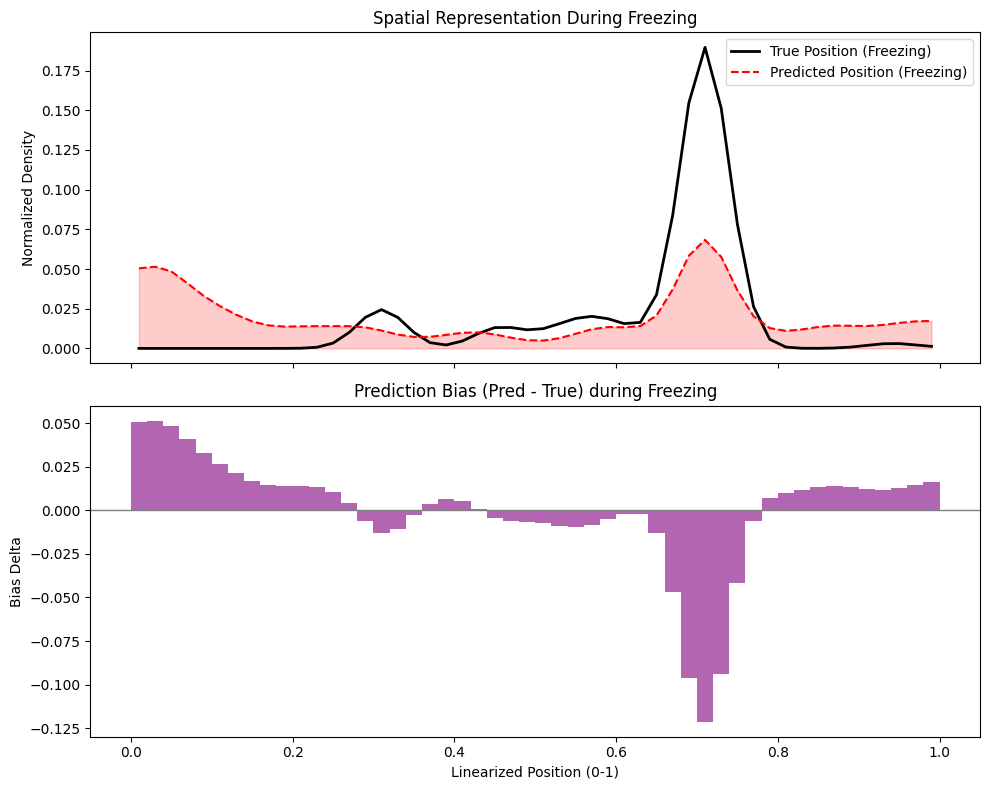

In [274]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

def get_1d_tuning_curve(positions, mask_indices, bins=50, sigma=1.5):
    """
    Generates a smoothed 1D density curve.
    Returns: (density_values, bin_centers)
    """
    # Filter data by mask (e.g., is_freeze)
    masked_data = positions[mask_indices]

    # Calculate histogram
    counts, bin_edges = np.histogram(masked_data, bins=bins, range=(0, 1))
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    # Smooth the curve
    density = gaussian_filter1d(counts.astype(float), sigma=sigma)

    # Optional: Normalize to unit area or max (unit area is better for probability)
    if np.sum(density) > 0:
        density /= np.sum(density)

    return density, bin_centers

true_pre = Mouse_Results.resultsNN_phase["_pre"]["linearTrue"][0]
predictions_pre = Mouse_Results.resultsNN_phase["_pre"]["linearPred"][0]
speedMask_pre = Mouse_Results.resultsNN_phase["_pre"]["speedMask"][0]
true_cond = Mouse_Results.resultsNN_phase["_cond"]["linearTrue"][0]
predictions_cond = Mouse_Results.resultsNN_phase["_cond"]["linearPred"][0]

# --- 1. Compute Baselines (Pre-phase or Non-Freezing) ---
# We use this to see what 'normal' behavior looks like
pre_true_dens, centers = get_1d_tuning_curve(true_pre, np.ones(len(true_pre), dtype=bool))
pre_pred_dens, _       = get_1d_tuning_curve(predictions_pre, np.ones(len(predictions_pre), dtype=bool))

# --- 2. Compute Freezing Curves (Cond-phase) ---
freeze_true_dens, _    = get_1d_tuning_curve(true_cond, is_freeze)
freeze_pred_dens, _    = get_1d_tuning_curve(predictions_cond, is_freeze)

# --- 3. Visualization ---
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Plot A: True vs Predicted during Freezing
ax1.plot(centers, freeze_true_dens, label='True Position (Freezing)', color='black', lw=2)
ax1.plot(centers, freeze_pred_dens, label='Predicted Position (Freezing)', color='red', linestyle='--')
ax1.fill_between(centers, freeze_pred_dens, alpha=0.2, color='red')
ax1.set_title('Spatial Representation During Freezing')
ax1.set_ylabel('Normalized Density')
ax1.legend()

# Plot B: The Deviation (Bias)
# Deviation = (Predicted - True). Positive means decoder over-represents that location.
bias = freeze_pred_dens - freeze_true_dens
ax2.bar(centers, bias, width=(centers[1]-centers[0]), color='purple', alpha=0.6)
ax2.axhline(0, color='grey', lw=1)
ax2.set_title('Prediction Bias (Pred - True) during Freezing')
ax2.set_xlabel('Linearized Position (0-1)')
ax2.set_ylabel('Bias Delta')

plt.tight_layout()
plt.show()

## mean binary error

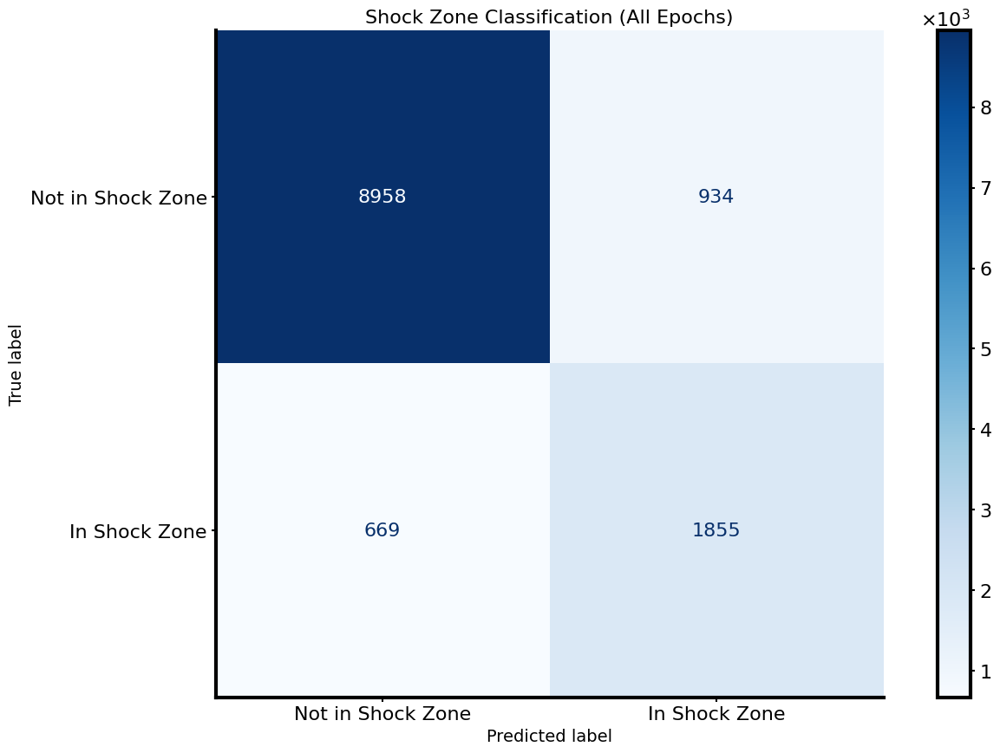

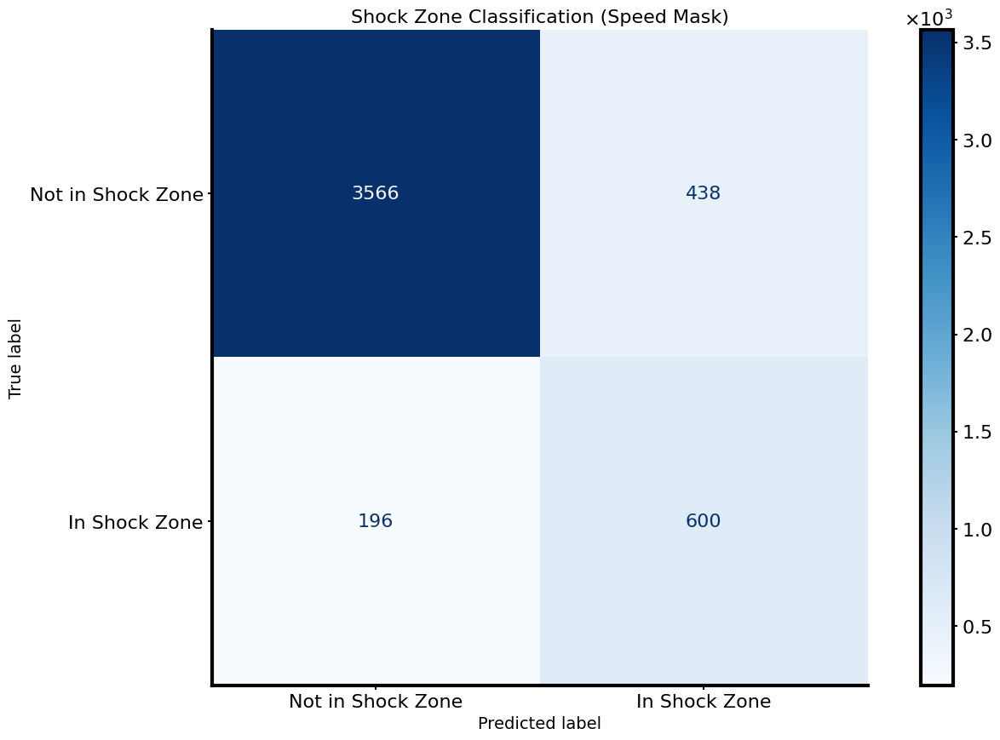

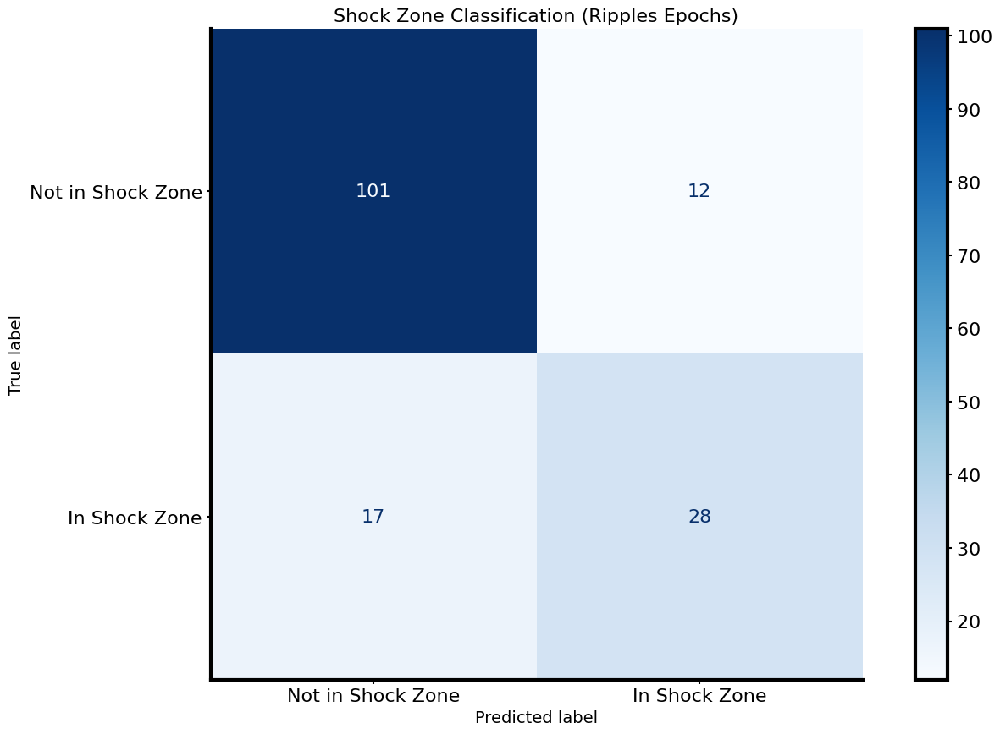

In [93]:
featurePred = Mouse_Results.resultsNN_phase_pkl["_pre"]["featurePred"][0][:,:2]
featureTrue = Mouse_Results.resultsNN_phase_pkl["_pre"]["featureTrue"][0][:,:2]
speedMask = Mouse_Results.resultsNN_phase_pkl["_pre"]["speedMask"][0]
time_decoding_pre = Mouse_Results.resultsNN_phase_pkl["_pre"]["times"][0]
is_freeze = inEpochsMask(time_decoding_pre, freeze_epochs)
is_ripples = inEpochsMask(time_decoding_pre, ripples_epochs)

plot_shock_zone_classification(featurePred, featureTrue, shock_zone, np.ones_like(featurePred[:,0], dtype=bool), "Shock Zone Classification (All Epochs)")
plot_shock_zone_classification(featurePred, featureTrue, shock_zone, speedMask, "Shock Zone Classification (Speed Mask)")
if is_freeze.sum() > 0:
    plot_shock_zone_classification(featurePred, featureTrue, shock_zone, is_freeze, "Shock Zone Classification (Freezing Epochs)")

if is_ripples.sum() > 0:
    plot_shock_zone_classification(featurePred, featureTrue, shock_zone, is_ripples, "Shock Zone Classification (Ripples Epochs)")

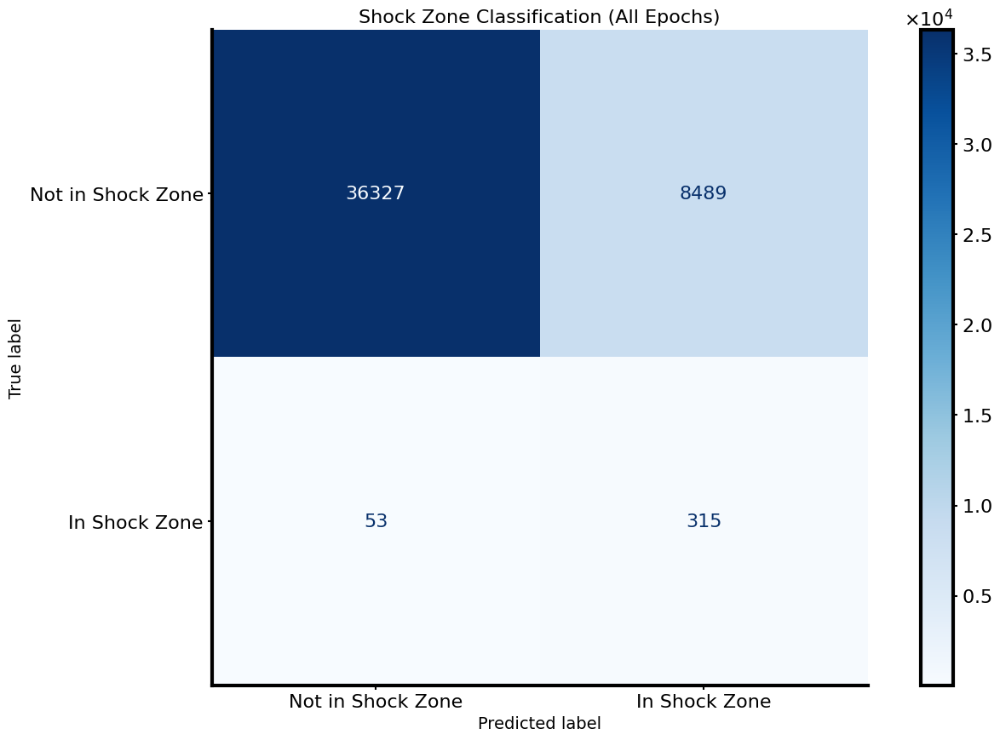

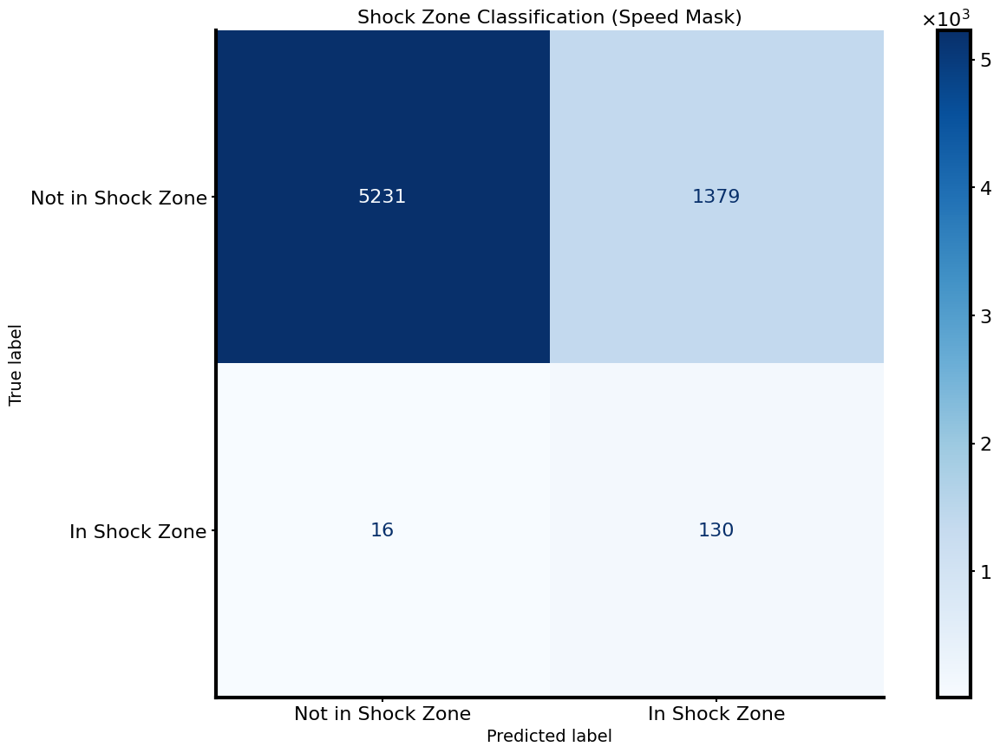

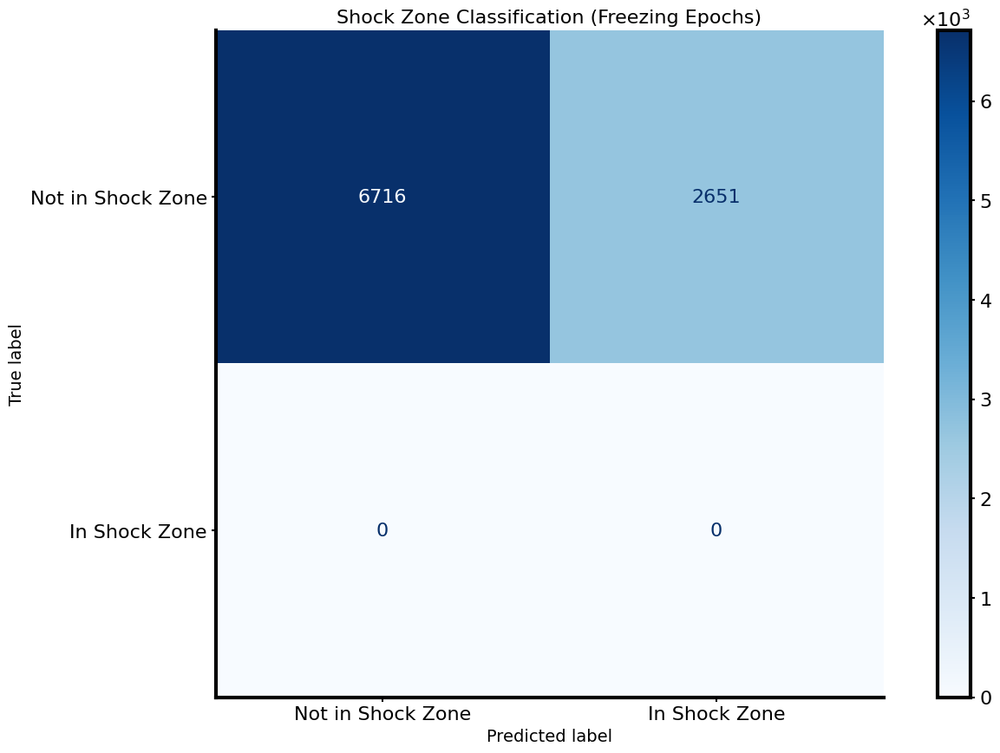

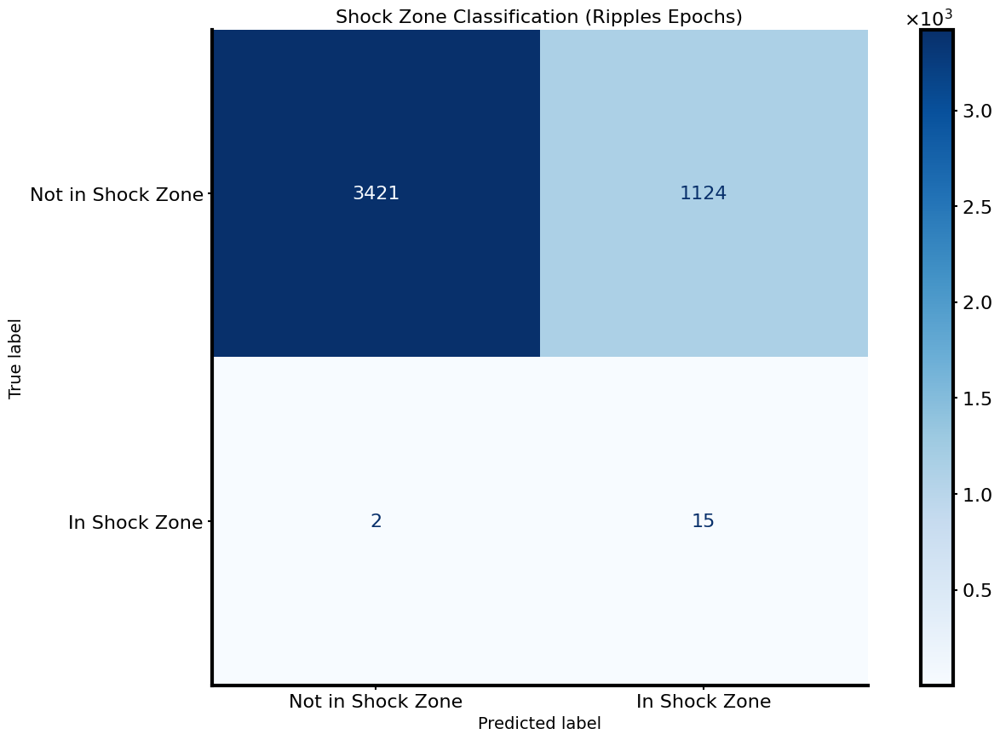

<Figure size 1600x1000 with 0 Axes>

In [90]:
from shapely.geometry import Point

featurePred = Mouse_Results.resultsNN_phase_pkl["_cond"]["featurePred"][0][:,:2]
featureTrue = Mouse_Results.resultsNN_phase_pkl["_cond"]["featureTrue"][0][:,:2]
speedMask = Mouse_Results.resultsNN_phase_pkl["_cond"]["speedMask"][0]
constraint_mixin = SpatialConstraintsMixin(
    grid_size = Mouse_Results.ann.params.GaussianGridSize,
    maze_params = Mouse_Results.Linearizer.maze_params
)
shock_zone = Mouse_Results.DataHelper.create_zone_polygon_from_borders(
                constraint_mixin.ZONEDEF[ZONELABELS.index("Shock")]
            )

# we show the classification error for shock zone/not shock zone based on predicted position and true position. We look at the classification error during all epochs, speed epochs (ie speed mask), freezing epochs and ripples epochs 
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
def plot_shock_zone_classification(featurePred, featureTrue, shock_zone, mask, title):
    # Determine if predicted and true positions are in the shock zone
    featurePred_points = [Point(x, y) for x, y in featurePred]
    featureTrue_points = [Point(x, y) for x, y in featureTrue]
    pred_in_shock = [shock_zone.contains(point) for point in featurePred_points]
    true_in_shock = [shock_zone.contains(point) for point in featureTrue_points]
    
    # Apply the mask to focus on specific epochs
    pred_in_shock_masked = [pred_in_shock[i] for i in range(len(pred_in_shock)) if mask[i]]
    true_in_shock_masked = [true_in_shock[i] for i in range(len(true_in_shock)) if mask[i]]
    
    # Compute confusion matrix
    cm = confusion_matrix(true_in_shock_masked, pred_in_shock_masked)
    
    # Plot confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Not in Shock Zone", "In Shock Zone"])
    disp.plot(cmap='Blues')
    plt.title(title)
    plt.show()
    
plot_shock_zone_classification(featurePred, featureTrue, shock_zone, np.ones_like(featurePred[:,0], dtype=bool), "Shock Zone Classification (All Epochs)")
plot_shock_zone_classification(featurePred, featureTrue, shock_zone, speedMask, "Shock Zone Classification (Speed Mask)")
plot_shock_zone_classification(featurePred, featureTrue, shock_zone, is_freeze, "Shock Zone Classification (Freezing Epochs)")
plot_shock_zone_classification(featurePred, featureTrue, shock_zone, is_ripples, "Shock Zone Classification (Ripples Epochs)")
plt.tight_layout()
plt.show()

## andere sachen

In [ ]:
entropy_mask = Mouse_Results.resultsNN_phase_pkl["_pre"][0]["Hn"] < thresh_entropy
entropy_sort = np.argsort(Mouse_Results.resultsNN_phase_pkl["_pre"][0]["Hn"])

In [ ]:
# plot 5 best and 5 worst entropy neurons
plt.figure()
for i in range(5):
    plt.subplot(2,5,i+1)
    plt.imshow(Mouse_Results.resultsNN_phase_pkl["_pre"][0]["logits_hw"][entropy_sort[i]], origin = "lower", extent=(0,1,0,1))
    plt.plot(Mouse_Results.resultsNN_phase_pkl["_pre"][0]["featureTrue"][entropy_sort[i]][0], Mouse_Results.resultsNN_phase_pkl["_pre"][0]["featureTrue"][entropy_sort[i]][1], 'ro')
    plt.title(f"Best Entropy Neuron {i+1}")
    plt.xlabel("Time")
    plt.ylabel("Logits")
    
    plt.subplot(2,5,10-i)
    plt.imshow(Mouse_Results.resultsNN_phase_pkl["_pre"][0]["logits_hw"][entropy_sort[-(i+1)]], origin = "lower", extent=(0,1,0,1))
    plt.plot(Mouse_Results.resultsNN_phase_pkl["_pre"][0]["featureTrue"][entropy_sort[-(i+1)]][0], Mouse_Results.resultsNN_phase_pkl["_pre"][0]["featureTrue"][entropy_sort[-(i+1)]][1], 'ro')
    plt.title(f"Worst Entropy Neuron {i+1}")
    plt.xlabel("Time")
    plt.ylabel("Logits")

Mouse_Results.resultsNN_phase_pkl["_pre"][0]["logits_hw"][entropy_mask].shape

In [ ]:
import numpy as np

def compute_gini(heatmap):
    """
    Computes the Gini Coefficient for a 2D heatmap.
    Args:
        heatmap: [H, W] or [N, H, W] array of probabilities.
    """
    # Flatten and handle batching
    if heatmap.ndim == 3:
        # Reshape to [N, H*W]
        flattened = np.sort(heatmap.reshape(heatmap.shape[0], -1), axis=1)
        n = flattened.shape[1]
        index = np.arange(1, n + 1)
        # Calculate Gini for each batch
        return (np.sum((2 * index - n - 1) * flattened, axis=1)) / (n * np.sum(flattened, axis=1))
    else:
        # Single heatmap [H*W]
        flattened = np.sort(heatmap.flatten())
        n = flattened.shape[0]
        index = np.arange(1, n + 1)
        return ((np.sum((2 * index - n - 1) * flattened)) / (n * np.sum(flattened)))

# Example usage:
# gini_scores = compute_gini(results_dict['probs_hw'])

In [ ]:
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error

def prepare_uncertainty_data(results_dict):
    """
    Extracts features from your results dict to train an error predictor.
    Target: Euclidean distance between pred and true.
    """
    # 1. Calculate the Ground Truth Error (L2 Distance)
    # Assuming pos_2d is [N, 2] and featureTrue contains the ground truth 2D coords
    preds = results_dict['featurePred']
    targets = results_dict['featureTrue']
    mov_mask = results_dict["speedMask"]
    preds = preds[mov_mask,:2]
    targets = targets[mov_mask,:2]
    
    # Calculate Euclidean Error (The value we want to predict)
    errors = np.linalg.norm(preds - targets, axis=1)
    
    top5sum = np.sum(np.sort(results_dict['logits_hw'][mov_mask], axis=1)[:,-5:], axis=(1,2))
    top10sum = np.sum(np.sort(results_dict['logits_hw'][mov_mask], axis=1)[:,-10:], axis=(1,2))
    # compute gini coef over the whole logits map
    gini_coef = compute_gini(results_dict['logits_hw'][mov_mask])

    # 2. Assemble Feature Matrix (X)
    # We use the scalar metrics you've already computed + some structural ones
    features = np.stack([
        results_dict['maxp'][mov_mask],          # Peak confidence
        results_dict['Hn'][mov_mask],            # Normalized Entropy
        results_dict['var_total'][mov_mask],     # Variance/Spread
        # Add dynamic features if available
        np.max(results_dict['logits_hw'][mov_mask], axis=(1,2)), # Raw max logit
        top5sum,                                 # Sum of top 5 logits
        top10sum,                                # Sum of top 10 logits
        gini_coef                                # Gini Coefficient of the heatmap
    ], axis=1)
    
    # turn it into pandas dataframe for better handling
    from neuroencoders.utils.backend import pd
    feature_names = ['maxp', 'Hn', 'var_total', 'max_logit', 'top5sum', 'top10sum', 'gini_coef']
    features_df = pd.DataFrame(features, columns=feature_names)
    
    return features_df, errors

results_dict = Mouse_Results.resultsNN_phase_pkl["_pre"][0]
# Usage with your data
X, y = prepare_uncertainty_data(results_dict)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Initialize XGBoost Regressor
error_model = xgb.XGBRegressor(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=6,
    objective='reg:squarederror'
)

error_model.fit(X_train, y_train)

# Check performance
expected_error = error_model.predict(X_val)
print(f"MAE of Error Predictor: {mean_absolute_error(y_val, expected_error):.4f}")

# IMPORTANT: Check which feature predicts failure best
import matplotlib.pyplot as plt
xgb.plot_importance(error_model)
plt.show()

In [ ]:
import shap
explainer = shap.Explainer(error_model.predict, X_val)
shap_values = explainer(X_val)
shap.initjs()

In [ ]:
shap.waterfall_plot(shap_values[0])

In [ ]:
shap.summary_plot(shap_values, X_val)

In [ ]:
import tensorflow as tf

def build_oracle_cnn(input_shape=(45, 45, 1)):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=input_shape),
        # Treat the heatmap as an image
        tf.keras.layers.Conv2D(16, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dense(3) # Predicts xy position and future error
    ])
    def custom_loss(y_true, y_pred):
        # y_true: [batch_size, 3] (x_true, y_true, error_true)
        # y_pred: [batch_size, 3] (x_pred, y_pred, error_pred)
        pos_loss = tf.reduce_mean(tf.square(y_true[:, :2] - y_pred[:, :2]))  # MSE for position
        error_loss = tf.reduce_mean(tf.square(pos_loss - y_pred[:,2]))
        return pos_loss + error_loss
    model.compile(optimizer='adam', loss=custom_loss)
    return model

# To train: 
# oracle = build_oracle_cnn()
# oracle.fit(results_dict['logits_hw'], y, epochs=20)

In [ ]:
oracle = build_oracle_cnn()

In [ ]:
preds = results_dict['featurePred']
targets = results_dict['featureTrue']
mov_mask = results_dict["speedMask"]
preds = preds[mov_mask,:2]
targets = targets[mov_mask,:2]

# Calculate Euclidean Error (The value we want to predict)
errors = np.linalg.norm(preds - targets, axis=1)

logits_hw = results_dict['logits_hw'][mov_mask]

In [ ]:
results_dict_train = Mouse_Results.resultsNN_phase_pkl["_training"][0]
preds_train = results_dict_train['featurePred']
targets_train = results_dict_train['featureTrue']
mov_mask_train = results_dict_train["speedMask"]
preds_train = preds_train[mov_mask_train,:2]
targets_train = targets_train[mov_mask_train,:2]

errors_train = np.linalg.norm(preds_train - targets_train, axis=1)
logits_hw_train = results_dict_train['logits_hw'][mov_mask_train]

In [ ]:
logits_concat = np.concatenate([logits_hw_train, logits_hw], axis=0) * 1.2518 
errors_concat = np.concatenate([errors_train, errors])
targets_concat = np.concatenate([targets_train, targets], axis=0)
    
logits_train, logits_val, errors_train, errors_val = train_test_split(
    logits_concat, targets_concat,
    test_size=0.2, random_state=42)

In [ ]:
oracle.fit(logits_train, errors_train, epochs=20)

In [ ]:
results_dict.keys()

In [ ]:
results_dict["latent"]

In [ ]:
Mouse_Results.ann.model.loss["latent"].target_structure

In [ ]:
for head_name, head in Mouse_Results.ann.heads.items():
    print(f"Head: {head_name}, Output Shape: {head.output_shape}")

In [ ]:
Mouse_Results.ann.tmp_outputs["latent_output"]

In [ ]:
Mouse_Results.ann.model.output

In [ ]:
plt.plot(predicted_train[:,2])

In [ ]:
predicted_train = oracle.predict(logits_train)
predicted_val = oracle.predict(logits_val)
predicted_concat = np.concatenate([predicted_train, predicted_val], axis=0)
plt.figure()
# plt.scatter(errors_train[:,0], errors_train[:,1], alpha=0.5, label='Train')
plt.scatter(errors_val[:,0], errors_val[:,1], alpha=0.5, label='Val')
# plt.scatter(predicted_train[:,0], predicted_train[:,1], alpha=0.5, label='Pred Train')
plt.scatter(predicted_val[:,0], predicted_val[:,1], alpha=0.5, label='Pred Val')
final_errors = np.linalg.norm(predicted_concat[:,:2] - targets_concat[:,:2], axis=1)
plt.scatter(final_errors, predicted_concat[:,2], alpha=0.5, label='Predicted Future Error')
plt.plot([0, max(errors)], [0, max(errors)], 'r--') # Line for perfect predictions
plt.xlabel('True L2 Error')
plt.ylabel('Predicted L2 Error')
plt.title('Oracle CNN Predictions vs True Errors')
plt.legend()
plt.show()

In [ ]:
predicted_train = oracle.predict(logits_train)
predicted_val = oracle.predict(logits_val)

plt.figure()
plt.scatter(errors_train, predicted_train, alpha=0.5, label='Train')
plt.scatter(errors_val, predicted_val, alpha=0.5, label='Val')
plt.plot([0, max(errors)], [0, max(errors)], 'r--') # Line for perfect predictions
plt.xlabel('True L2 Error')
plt.ylabel('Predicted L2 Error')
plt.title('Oracle CNN Predictions vs True Errors')
plt.legend()
plt.show()

In [ ]:
Mouse_Results.fig_summary_id_card(252, Mouse_Results.DataHelper)

In [ ]:
Mouse_Results._plot_summary_bayesian(108)

In [ ]:
Mouse_Results.fig_summary_id_card(
    timeWindow = 108, DataHelper = Mouse_Results.DataHelper, open = True, show = True
)

In [ ]:
datasets_train, counts_train = Mouse_Results.ann.train(
    Mouse_Results.DataHelper.fullBehavior,
    windowSizeMS=108,    
    isPredLoss=False,
    l_function=Mouse_Results.l_function,
    num_augmentations=4,
    strideFactor=4,
    return_datasets = True,
    useTrain = True,
    useTest = False,
)

In [ ]:
datasets, counts = Mouse_Results.ann.test(
    Mouse_Results.DataHelper.fullBehavior,
    windowSizeMS=108,    
    isPredLoss=False,
    l_function=Mouse_Results.l_function,
    num_augmentations=4,
    strideFactor=4,
    return_datasets = True,
    useTrain = False,
    useTest = True,
)

In [ ]:
batch = next(iter(datasets.take(1)))
inputs, targets = batch

In [ ]:
import tensorflow as tf
Mouse_Results.ann.model = tf.keras.models.load_model("/home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/M994_PAG/STRIDE_4_consensus_v4_factor3_dim64_3Transformers_lr001_nHeads4_dropout015_cLambda07_speed_10_50_Transformer/models/108/savedModels/full_model.keras")


In [ ]:
datasets

In [ ]:
## prepare contrastive visualizer callback
viz_batch = datasets.take(5)
viz_inputs = []
viz_linpos = []
l_function = Mouse_Results.ann.Linearizer.pykeops_linearization
for x, y in viz_batch.as_numpy_iterator():
    viz_inputs.append(x)
    viz_linpos.append(l_function(y["latent"][:, :2])[1])

viz_inputs = {
    k: np.concatenate([batch[k] for batch in viz_inputs], axis=0)
    for k in viz_inputs[0].keys()
}
try:
    groups = viz_inputs["groups"]
    neg1_counts = np.sum(groups == -1, axis=1)
    best_row_idx = np.argmin(neg1_counts)
except KeyError:
    best_row_idx = None

viz_linpos = np.concatenate(viz_linpos, axis=0)

In [ ]:
tf_device = tf.config.list_physical_devices("CPU")[0].name

In [ ]:
tf_device = "cpu"

In [ ]:
with tf.device(Mouse_Results.ann.deviceName):
    Mouse_Results.ann.viz_encoder = tf.keras.Model(
        inputs=Mouse_Results.ann.inputs,
        outputs=Mouse_Results.ann.tmp_outputs["latent_output"],
        name="SpikeNetEncoderModel",
    )

In [ ]:
viz_pos = []
for x, y in viz_batch.as_numpy_iterator():
    viz_pos.append(y["latent"][:, :2])
    
viz_pos = np.concatenate(viz_pos, axis=0)

In [ ]:
from neuroencoders.fullEncoder.nnUtils import ContrastiveVisualizer
with tf.device(Mouse_Results.ann.deviceName):
    callback = ContrastiveVisualizer(
        viz_x=viz_inputs,
        viz_y=viz_linpos,
        encoder_model=Mouse_Results.ann.viz_encoder,
        params=Mouse_Results.ann.params,
        save_dir="/home/mickey/download",
        trial_idx=best_row_idx,
    )

In [ ]:
Mouse_Results = callback

In [ ]:
from neuroencoders.fullEncoder.nnUtils import create_attention_mask_from_padding_mask
import seaborn as sns
epoch = 0
with tf.device(tf_device):
    # Mirror your working function indexing
    transformer_encoder = Mouse_Results.encoder_model.get_layer("transformer_encoder")
    internal_block = transformer_encoder.layers[1]

    # Sub-model for prefix
    prefix_model = tf.keras.Model(
        inputs=Mouse_Results.encoder_model.input, outputs=transformer_encoder.input
    )
    x = prefix_model(Mouse_Results.viz_x, training=False)

    # Handle mask/tensor list
    mask = None
    if isinstance(x, (list, tuple)):
        mask = x[1] if len(x) > 1 else None
        x = x[0]

    # Apply internal norm1
    x_norm = internal_block.norm1(x)

    # Create attention mask
    attention_mask = None
    if mask is not None:
        attention_mask = create_attention_mask_from_padding_mask(mask)

    # Get weights (Trial 0, Head 0)
    _, weights = internal_block.mha(
        query=x_norm,
        value=x_norm,
        attention_mask=attention_mask,
        return_attention_scores=True,
        training=False,
    )
    trial_weights = weights[Mouse_Results.trial_idx]  # [heads, seq, seq]
    attn_map = tf.cast(
        tf.reduce_mean(trial_weights, axis=0), tf.float32
    ).numpy()  # average over heads -> [seq, seq]

    # Plot and save map
    plt.figure(figsize=(8, 6))
    plt.imshow(attn_map, cmap="viridis", aspect="equal")
    plt.title(f"Attention Snapshot - Epoch {epoch + 1}")
    plt.colorbar(label="Weight")
    plt.savefig(os.path.join(Mouse_Results.save_dir, f"attn_epoch_{epoch + 1:03d}.png"))
    plt.close()

    # Create a grouped colorbar/labels for the heatmap axes
    groups_for_trial = self.viz_x["groups"][self.trial_idx]
    valid_len = np.sum(groups_for_trial != -1)

    # Slice the map to remove padding from the visual
    clean_attn = attn_map[:valid_len, :valid_len]

    plt.figure(figsize=(10, 8))
    sns.heatmap(clean_attn, cmap="viridis", xticklabels=5, yticklabels=5)
    plt.title(f"Mean Attention - Epoch {epoch + 1} (Non-padded spikes only)")
    plt.savefig(
        os.path.join(self.save_dir, f"sns_attn_epoch_{epoch + 1:03d}.png")
    )
    plt.close()


In [ ]:
plot_len

In [ ]:
from matplotlib import gridspec
with tf.device(tf_device):

    # 1. Extraction Logic (Same as before)
    transformer_encoder = self.encoder_model.get_layer("transformer_encoder")
    internal_block = transformer_encoder.layers[1]
    prefix_model = tf.keras.Model(
        inputs=self.encoder_model.input, outputs=transformer_encoder.input
    )
    x_raw = prefix_model(self.viz_x, training=False)

    mask = x_raw[1] if isinstance(x_raw, (list, tuple)) else None
    x_raw = x_raw[0] if isinstance(x_raw, (list, tuple)) else x_raw

    x_norm = internal_block.norm1(x_raw)
    _, weights = internal_block.mha(
        query=x_norm,
        value=x_norm,
        attention_mask=create_attention_mask_from_padding_mask(mask)
        if mask is not None
        else None,
        return_attention_scores=True,
        training=False,
    )

    # 2. Prepare Data
    # Average heads and slice to valid (non-padded) sequence length
    groups_for_trial = self.viz_x["groups"][self.trial_idx]
    valid_len = np.sum(groups_for_trial != -1)
    # Use first 100 max for visual clarity
    plot_len = min(100, valid_len)

    attn_map = tf.reduce_mean(weights[self.trial_idx], axis=0)[
        :plot_len, :plot_len
    ].numpy().astype(np.float32)
    example = {k: v[self.trial_idx] for k, v in self.viz_x.items()}

    # 3. Setup GridSpec (1 row for spikes, 1 row for attention)
    fig = plt.figure(figsize=(12, 14))
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 2], hspace=0.05)

    ax_spikes = fig.add_subplot(gs[0])
    ax_attn = fig.add_subplot(gs[1])

    # 4. Plot Spikes (Aligned to the attention columns)
    cmaps = [
        plt.get_cmap("tab10"),
        plt.get_cmap("Set1"),
        plt.get_cmap("Set2"),
    ]
    while len(cmaps) < self.params.nGroups:
        cmaps.append(plt.get_cmap("hsv"))

    for i in range(plot_len):
        g_idx = int(groups_for_trial[i])
        spike_idx = int(example[f"indices{g_idx}"][i])
        if spike_idx == 0:
            continue

        wave = example[f"group{g_idx}"][spike_idx - 1]  # [channels, samples]
        # Center the waveform at the column index 'i'
        time_axis = np.linspace(i - 0.4, i + 0.4, wave.shape[1])

        for ch in range(wave.shape[0]):
            ax_spikes.plot(
                time_axis,
                wave[ch, :].astype(np.float32),
                color=cmaps[g_idx](ch),
                lw=0.8,
                alpha=0.7,
            )

    ax_spikes.set_title(f"Aligned Spikes & Attention - Epoch {epoch + 1}")
    ax_spikes.set_ylabel("Voltage")
    ax_spikes.set_xlim(-0.5, plot_len - 0.5)
    ax_spikes.axis("off")  # Cleaner look

    # 5. Plot Attention Map
    im = ax_attn.imshow(attn_map.astype(np.float32), cmap="viridis", aspect="auto", origin="upper")
    ax_attn.set_xlabel("Key Spike Index")
    ax_attn.set_ylabel("Query Spike Index")

    # Colorbar
    plt.colorbar(
        im,
        ax=ax_attn,
        orientation="horizontal",  # This puts it at the bottom
        fraction=0.05,             # Controls size relative to the axes
        pad=0.1,                   # Spacing between the xaxis label and cbar
        label="Mean Attention Weight",
    )

    plt.savefig(
        os.path.join(self.save_dir, f"combined_viz_epoch_{epoch + 1:03d}.png"),
        bbox_inches="tight",
    )
    plt.close()


In [ ]:
callback._plot_raw_spikes(epoch=0)

In [ ]:
model = tf.keras.models.load_model("/home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/M994_PAG/STRIDE_4_consensus_v4_factor3_dim64_3Transformers_lr001_nHeads4_dropout015_cLambda07_speed_10_50_Transformer/models/108/savedModels/full_model.keras")
zouzou = model.predict(datasets)

In [ ]:
zouzou.keys()

In [ ]:
for key in zouzou.keys():
    if key == "pos_2d" or key == "latent":
        continue
    print(key)
    plt.plot(zouzou[key], label = f"model {key}")
plt.legend()
plt.show()

In [ ]:
from tqdm import tqdm

extract_spikes_counts = False # Set to False if you don't want to extract spike counts
# 2. Extract metadata in a single pass
print("Extracting metadata...")
list_pos = []
list_times = []
list_times_behavior = []
list_pos_index = []
list_groups = []
list_speed_filter = []
list_index_in_dat = []

self = Mouse_Results.ann  # For easier access to params and target_structure
# Spike Counts (Dynamic dict to handle variable groups)
dict_spike_counts = {
    f"group{g}_spikes_count": [] for g in range(self.params.nGroups)
}

for inputs, targets in tqdm(datasets, desc="Gathering metadata"):
    # Reconstruct full Y ground truth from individual target heads
    max_idx = 0
    for spec in self.target_structure.values():
        if spec == "latent":
            continue  # Skip latent for ground truth reconstruction
        max_idx = max(max_idx, spec["slice"][1])

    batch_size = next(iter(targets.values())).shape[0]
    batch_y_true = np.zeros((batch_size, max_idx), dtype=np.float32)

    for name, spec in self.target_structure.items():
        if name in targets:
            start, end = spec["slice"]
            batch_y_true[:, start:end] = targets[name].numpy()

    list_pos.append(batch_y_true)
    list_times.append(inputs["time"].numpy())
    list_times_behavior.append(inputs["time_behavior"].numpy())
    list_pos_index.append(inputs["pos_index"].numpy())
    list_index_in_dat.append(inputs["indexInDat"].numpy())
    list_groups.append(inputs["groups"].numpy())

    # Optional keys (use .get or check)
    if "speedFilter" in inputs:
        list_speed_filter.append(inputs["speedFilter"].numpy())

    if extract_spikes_counts:
        for g in range(self.params.nGroups):
            key = f"group{g}_spikes_count"
            if key in inputs:
                dict_spike_counts[key].append(inputs[key].numpy())

# 3. Concatenate all batches into single arrays
print("Concatenating results...")
# full_pred_features and full_pos_loss are already arrays/None from predict

full_feature_true = np.concatenate(list_pos, axis=0)
full_times = np.concatenate(list_times, axis=0).flatten()
full_times_behavior = np.concatenate(list_times_behavior, axis=0).flatten()
full_pos_index = np.concatenate(list_pos_index, axis=0).flatten()


In [ ]:
from neuroencoders.importData.epochs_management import get_epochs_mask


speedMask = Mouse_Results.DataHelper.fullBehavior["Times"]["speedFilter"]
epochMask = get_epochs_mask(behaviorData=Mouse_Results.DataHelper.fullBehavior, useTrain = True, useTest = False)
totMask = epochMask

# Handle Speed Mask
# If speedFilter was in dataset, use it. Otherwise compute via lookup
if len(list_speed_filter) > 0:
    windowmaskSpeed = np.concatenate(list_speed_filter, axis=0).flatten()
else:
    # Fallback to your original lookup method
    print("Looking up speed mask from original array...")
    windowmaskSpeed = speedMask[full_pos_index]

In [ ]:
def plot_attention_map(model, input_dict, trial_idx = 0, head_idx = 0):
    try:
        # Mirror your working function indexing
        transformer_encoder = model.get_layer("transformer_encoder")
        internal_block = transformer_encoder.layers[1]

        # Sub-model for prefix
        prefix_model = tf.keras.Model(
            inputs=model.input, outputs=transformer_encoder.input
        )
        x = prefix_model(input_dict, training=False)

        # Handle mask/tensor list
        mask = None
        if isinstance(x, (list, tuple)):
            mask = x[1] if len(x) > 1 else None
            x = x[0]

        # Apply internal norm1
        x_norm = internal_block.norm1(x)

        # Create attention mask
        attention_mask = None
        if mask is not None:
            from neuroencoders.fullEncoder.nnUtils import create_attention_mask_from_padding_mask

            attention_mask = create_attention_mask_from_padding_mask(mask)

        # Get weights (Trial 0, Head 0)
        _, weights = internal_block.mha(
            query=x_norm,
            value=x_norm,
            attention_mask=attention_mask,
            return_attention_scores=True,
            training=False,
        )
        attn_map = tf.cast(weights[trial_idx, head_idx], tf.float32).numpy()  # [seq_len, seq_len]

        # Plot and save map
        plt.figure(figsize=(8, 6))
        im = plt.imshow(attn_map, cmap="viridis", aspect="equal")
        plt.colorbar(im, label='Attention Weight')
        plt.title(f"Trial {trial_idx} | Head {head_idx}\nSpike-to-Spike Attention")
        plt.xlabel("Key (Spikes)")
        plt.ylabel("Query (Spikes)")
        plt.show()
        
    except Exception as e:
        print(f"\n[Visualizer] Attention snapshot failed: {e}")


In [ ]:
# get the row with the minimum count of -1 in inputs["groups"]
min_neg1_count = float('inf')
best_row_idx = -1
for idx, group_row in enumerate(inputs["groups"].numpy()):
    neg1_count = np.sum(group_row == -1)
    if neg1_count < min_neg1_count:
        min_neg1_count = neg1_count
        best_row_idx = idx

In [ ]:
plot_attention_map(Mouse_Results.ann.model, inputs, trial_idx=best_row_idx, head_idx=3)

In [ ]:
Mouse_Results.load_data(
    suffixes = ["_pre", "_cond", "_post", "_training"],
    load_pickle = True,
    extract_spikes_counts = True
)

In [ ]:
Mouse_Results.load_bayes(
    suffixes = ["_pre", "_cond", "_post", "_training"],
    load_pickle = True,
    target = "pos"
)

In [ ]:
Mouse_Results._create_decoding_bayes_matrices(
    winMS = 108, suffix = "_training"
)

In [ ]:
Mouse_Results.fig_summary_id_card(
    timeWindow=108,
    DataHelper=Mouse_Results.DataHelper,
    save=True,
    block=False,
    mouse_name=Mouse_Results.mouse_name + Mouse_Results.manipe,
)

In [ ]:
from neuroencoders.resultAnalysis.print_results import print_results

print_results(
    Mouse_Results.ann.folderResult,
    windowSizeMS=windowSizeMS[0],
    show=True,
    lossSelection=0.5,
    euclidean=False,
    target="pre",
    phase="training",
    useSpeedMask=True,
    training_data=Mouse_Results.ann.training_data,
    force=True,
    l_function=Mouse_Results.l_function,
)


In [ ]:
import tensorflow as tf
tf.keras.utils.plot_model(Mouse_Results.ann.model, show_shapes=True, show_layer_names=True)

In [ ]:
Mouse_Results.load_trainers(
    which = "ann",
    max_nb_spikes = 512,
    max_spikes_per_group = 128,
    redo = True,
    jit_compile = True
)

datasets, counts = Mouse_Results.ann.train(
    Mouse_Results.DataHelper.fullBehavior,
    windowSizeMS=252,
    isPredLoss=False,
    earlyStop=True,
    l_function=Mouse_Results.l_function,
    num_augmentations=4,
    strideFactor=4,
    return_datasets=True,
    count_spikes = True
    )

for ex in datasets["train"].take(2):
    print(ex[0]["max_spikes"])
    print(ex[0]["length"])
    print(ex[0]["length_hand"])
    print((ex[0]["groups"].numpy() == -1).sum(axis = 1))

In [ ]:
from neuroencoders.importData.epochs_management import inEpochsMask

min_speed = 7
max_speed = 50
helper = Mouse_Results.helper

# Mimic rawdata_parser logic: handle shape mismatch and apply Hamming convolution
speed = helper.fullBehavior["Speed"][:, 0]
if len(speed) == len(helper.fullBehavior["positionTime"]) - 1:
    speed = np.append(speed, speed[-1])

window_len = 14
s = np.r_[
    speed[window_len - 1 : 0 : -1],
    speed,
    speed[-2 : -window_len - 1 : -1],
]
w = np.hamming(window_len)
smoothed_speed = np.convolve(w / w.sum(), s, mode="valid")[
    (window_len // 2 - 1) : -(window_len // 2)
]

# Use logical_and to be conservative and ensure we filter within the [9, 75] range
helper.fullBehavior["Times"]["speedFilter"] = np.logical_and(
    smoothed_speed > min_speed,
    smoothed_speed < max_speed,
).astype(bool)

speedMask = helper.fullBehavior["Times"]["speedFilter"]
epochMask = inEpochsMask(
    helper.fullBehavior["positionTime"][:, 0],
    helper.fullBehavior["Times"]["trainEpochs"],
)
totMask = speedMask * epochMask
full_training_true_positions = helper.fullBehavior["Positions"][totMask]

In [ ]:
totMask_test = speedMask * inEpochsMask(
    helper.fullBehavior["positionTime"][:, 0],
    helper.fullBehavior["Times"]["testEpochs"],
)
full_test_true_positions = helper.fullBehavior["Positions"][totMask_test]

In [ ]:
full_test_true_positions.shape, full_training_true_positions.shape

In [ ]:
plt.scatter(full_test_true_positions[:, 0], full_test_true_positions[:, 1], s= 10)
plt.scatter(full_training_true_positions[:, 0], full_training_true_positions[:, 1], s= 10, alpha = 0.5)

In [ ]:
plt.hexbin(full_training_true_positions[:, 0], full_training_true_positions[:, 1])

In [ ]:
Mouse_Results.Params.batch_size 

In [ ]:
Mouse_Results.ann._setup_feature_description()

In [ ]:
datasets, _ = Mouse_Results.ann.train(
    Mouse_Results.DataHelper.fullBehavior,
    windowSizeMS=108,
    isPredLoss=False,
    earlyStop=False,
    load_model=False,
    fine_tune=False,
    l_function=Mouse_Results.l_function,
    num_augmentations=11,
    strideFactor=4,
    debug_oversampling=False,
    return_datasets = True,
    inference_mode = True,
    shuffle = False
)

In [ ]:
ex = next(iter(datasets["train"]))
ex[1]

In [ ]:
for example in datasets["train"].take(5):
    print(example[1]["main_pred"])

In [ ]:
for example in datasets["test"].take(5):
    print(example[1]["main_pred"])

In [ ]:
model = Mouse_Results.ann.model
# Train the model.
model.fit(
    train_images,
    train_labels, 
    batch_size=64,
    epochs=5, 
    callbacks=[tensorboard_callback])


In [ ]:
Mouse_Results.ann.model.save("model.keras")

In [ ]:
Mouse_Results.Params.GaussianHeatmap

In [ ]:
import tensorflow as tf
model = tf.keras.models.load_model("model.keras")

In [ ]:
model.loss

In [ ]:
# for each layer and loss in model, print the get_config size in mB and the number of parameters 
for layer in model.layers:
    config = layer.get_config()
    config_size = sys.getsizeof(config) / (1024 * 1024)  # Convert to MB
    num_params = layer.count_params()
    print(f"Layer: {layer.name}, Config Size: {config_size:.4f} MB, Number of Parameters: {num_params}")

# for each layer and loss in model, print the get_config size in mB and the number of parameters
for k, v in model.loss.items():
    config = v.get_config()
    config_size = sys.getsizeof(config) / (1024 * 1024)  # Convert to MB
    print(f"Loss: {k}, Config Size: {config_size:.4f} MB")

In [ ]:
Mouse_Results.load_data(suffixes = ["_training", "_pre", "_cond", "_post"])
Mouse_Results.load_bayes(suffixes = ["_training", "_pre", "_cond", "_post"], phase = "training", load_bayesMatrices = True, load_decoded_bayes = True)

In [ ]:
Mouse_Results.bayesian_neurons_summary(winMS = 108, use_speed_filter = False)

In [ ]:
Mouse_Results.summary_behavior(
    Mouse_Results.data_helper,
    show = True
)

## looking to improve summary id

In [ ]:
Mouse_Results.convert_to_df()

In [ ]:
Mouse_Results.plot_barplot_error()

In [ ]:
np.where(Mouse_Results.data_helper.fullBehavior["Speed"] == -1)

In [ ]:
Mouse_Results.data_helper.fullBehavior["Times"]["speedFilter"].flatten()

In [ ]:
(Mouse_Results.data_helper.fullBehavior["Speed"] > 50).sum()

In [ ]:
plt.hist(Mouse_Results.data_helper.fullBehavior["Speed"], 100)

In [ ]:
plt.hist(Mouse_Results.data_helper.fullBehavior["Speed"][Mouse_Results.data_helper.fullBehavior["Times"]["speedFilter"].flatten()[:-1]], 100)

In [ ]:
Mouse_Results.load_data(suffixes = ["_training", "_pre", "_cond", "_post"], load_pickle = True)

In [ ]:
Mouse_Results.load_bayes(suffixes = ["_training", "_pre", "_cond", "_post"], phase = "training", load_bayesMatrices = True, load_decoded_bayes = True)

In [ ]:
# Assuming you have a Mouse_Results object 'results'
Mouse_Results.plot_ann_pred_by_phase(
    winMS_list=[108],
    speeds=['fast', 'slow'],
    type_error='lin',
    threshold_pct=None,  # Keep top 20% most confident predictions
    add_bayes=True,
    reduce_fn = "median"
)